## Distances and Angles between Images

We are going to compute distances and angles between images.

## Learning objectives
By the end of this notebook, you will learn to 

1. Write programs to compute distance.
2. Write programs to compute angle.

"distance" and "angle" are useful beyond their usual interpretation. They are useful for describing __similarity__ between objects. You will
first use the functions you wrote to compare MNIST digits. Furthermore, we will use these concepts for implementing the K Nearest Neighbors algorithm, which is a useful algorithm for classifying object according to distance.

In [1]:
# PACKAGE: DO NOT EDIT THIS LINE
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import scipy

import sklearn
from ipywidgets import interact
from load_data import load_mnist
from scipy.spatial import distance_matrix

The next cell loads the MNIST digits dataset.

In [2]:
MNIST = load_mnist()
images = MNIST['data'].astype(np.double)
labels = MNIST['target'].astype(np.int)
print('>>> Labels', labels)
print('>>> Length of labels', len(labels))

>>> Labels [0 0 0 ..., 9 9 9]
>>> Length of labels 70000


In [3]:
# Plot figures so that they can be shown in the notebook
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

For this assignment, you need to implement the two functions (`distance` and `angle`) in the cell below which compute the distance and angle between two vectors.

In [4]:
# GRADED FUNCTION: DO NOT EDIT THIS LINE

def distance(x0, x1):
    """Compute distance between two vectors x0, x1 using the dot product"""
    distance = np.sqrt(np.dot(x0 - x1, x0 - x1)) # <-- EDIT THIS to compute the distance between x0 and x1
    return distance

def angle(x0, x1):
    """Compute the angle between two vectors x0, x1 using the dot product"""
    # <-- EDIT THIS to compute angle between x0 and x1
    angle = np.arccos(np.dot(x0, x1)/ np.sqrt(np.dot(x0, x0) * np.dot(x1, x1)))
    return angle


We have created some helper functions for you to visualize vectors in the cells below. You do not need to modify them.

In [5]:
def plot_vector(v, w):
    fig = plt.figure(figsize=(4,4))
    ax = fig.gca()
    plt.xlim([-2, 2])
    plt.ylim([-2, 2])
    plt.grid()
    ax.arrow(0, 0, v[0], v[1], head_width=0.05, head_length=0.1, 
             length_includes_head=True, linewidth=2, color='r');
    ax.arrow(0, 0, w[0], w[1], head_width=0.05, head_length=0.1, 
             length_includes_head=True, linewidth=2, color='r');

In [6]:
# Some sanity checks, you may want to have more interesting test cases to test your implementation
a = np.array([1,0])
b = np.array([0,1])
np.testing.assert_almost_equal(distance(a, b), np.sqrt(2))
assert((angle(a,b) / (np.pi * 2) * 360.) == 90)

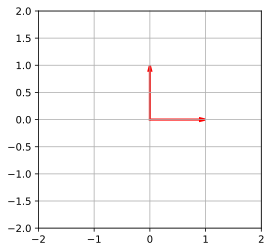

In [7]:
plot_vector(b, a)

The next cell shows some digits from the dataset.

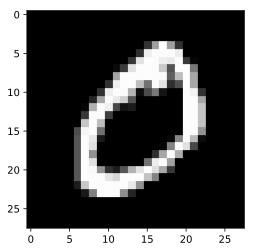

In [8]:
plt.imshow(images[labels==0].reshape(-1, 28, 28)[0], cmap='gray');

But we have the following questions:

1. What does it mean for two digits in the MNIST dataset to be _different_ by our distance function? 
2. Furthermore, how are different classes of digits different for MNIST digits? Let's find out!

For the first question, we can see just how the distance between digits compare among all distances for 
the first 500 digits. The next cell computes pairwise distances between images.

In [9]:
distances = []
for i in range(len(images[:500])):
    for j in range(len(images[:500])):
        distances.append(distance(images[i], images[j]))


#Find the index of the digit, among all MNIST digits
#that is the second-closest to the first image in the dataset (the first image is closest to itself trivially). 
#Your answer should be a single integer.

#1. get all the distances between the first image and the the rest of all images
first_image_distances_unsorted = distances[0:499]
#2. Rank them based on distance values Asc
first_image_distances_sorted = np.sort(first_image_distances_unsorted)
print(">>> Distances: \n", first_image_distances_sorted[1])


#3. pick item #2 in the sorted list and find it's index in the unsorted list
result = np.where(first_image_distances_unsorted == first_image_distances_sorted[1])
print('Tuple of arrays returned : ', result[0])






>>> Distances: 
 1020.6473436
Tuple of arrays returned :  [61]


In [10]:
@interact(first=(0, 499), second=(0, 499), continuous_update=False)
def show_img(first, second):
    plt.figure(figsize=(8,4))
    f = images[first].reshape(28, 28)
    s = images[second].reshape(28, 28)
    
    ax0 = plt.subplot2grid((2, 2), (0, 0))
    ax1 = plt.subplot2grid((2, 2), (1, 0))
    ax2 = plt.subplot2grid((2, 2), (0, 1), rowspan=2)
    
    #plt.imshow(np.hstack([f,s]), cmap='gray')
    ax0.imshow(f, cmap='gray')
    ax1.imshow(s, cmap='gray')
    ax2.hist(np.array(distances), bins=50)
    d = distance(f.ravel(), s.ravel())
    ax2.axvline(x=d, ymin=0, ymax=40000, color='C4', linewidth=4)
    ax2.text(0, 46000, "Distance is {:.2f}".format(d), size=12)
    ax2.set(xlabel='distance', ylabel='number of images')
    plt.show()

interactive(children=(IntSlider(value=249, description='first', max=499), IntSlider(value=249, description='se…

In [11]:
# GRADED FUNCTION: DO NOT EDIT THIS LINE
def most_similar_image():
    """Find the index of the digit, among all MNIST digits
       that is the second-closest to the first image in the dataset (the first image is closest to itself trivially). 
       Your answer should be a single integer.
    """
    index = 61 #<-- Change the -1 to the index of the most similar image.
    # You should do your computation outside this function and update this number
    # once you have computed the result
    return index

In [12]:
result = most_similar_image()

For the second question, we can compute a `mean` image for each class of image, i.e. we compute mean image for digits of `1`, `2`, `3`,..., `9`, then we compute pairwise distance between them. We can organize the pairwise distances in a 2D plot, which would allow us to visualize the dissimilarity between images of different classes.

First we compute the mean for digits of each class.

In [13]:
means = {}
for n in np.unique(labels):
    means[n] = np.mean(images[labels==n], axis=0)


For each pair of classes, we compute the pairwise distance and 
store them into MD (mean distances). We store the angles between the mean digits in AG

In [14]:
MD = np.zeros((10, 10))
AG = np.zeros((10, 10))
for i in means.keys():
    for j in means.keys():
        MD[i, j] = distance(means[i], means[j])
        AG[i, j] = angle(means[i].ravel(), means[j].ravel())

Now we can visualize the distances! Here we put the pairwise distances. The colorbar
shows how the distances map to color intensity.

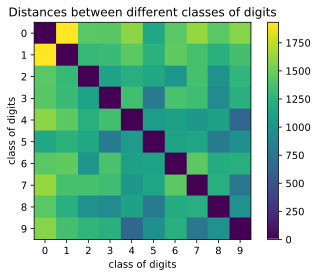

In [15]:
fig, ax = plt.subplots()
grid = ax.imshow(MD, interpolation='nearest')
ax.set(title='Distances between different classes of digits',
       xticks=range(10), 
       xlabel='class of digits',
       ylabel='class of digits',
       yticks=range(10))
fig.colorbar(grid)
plt.show()

Similarly for the angles.

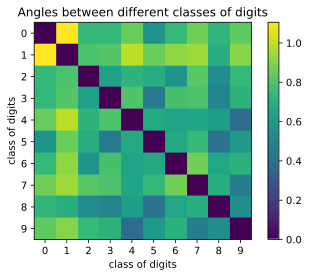

In [16]:
fig, ax = plt.subplots()
grid = ax.imshow(AG, interpolation='nearest')
ax.set(title='Angles between different classes of digits',
       xticks=range(10), 
       xlabel='class of digits',
       ylabel='class of digits',
       yticks=range(10))
fig.colorbar(grid)
plt.show();

## K Nearest Neighbors

In this section, we will explore the [KNN classification algorithm](https://en.wikipedia.org/wiki/K-nearest_neighbors_algorithm).
A classification algorithm takes input some data and use the data to 
determine which class (category) this piece of data belongs to.

![flower](https://archive.ics.uci.edu/ml/assets/MLimages/Large53.jpg)

As a motivating example, consider the [iris flower dataset](https://archive.ics.uci.edu/ml/datasets/iris). The dataset consists
of 150 data points where each data point is a feature vector $\boldsymbol x \in \mathbb{R}^4$ describing the attribute of a flower in the dataset, the four dimensions represent 

1. sepal length in cm 
2. sepal width in cm 
3. petal length in cm 
4. petal width in cm 


and the corresponding target $y \in \mathbb{Z}$ describes the class of the flower. It uses the integers $0$, $1$ and $2$ to represent the 3 classes of flowers in this dataset.

0. Iris Setosa
1. Iris Versicolour 
2. Iris Virginica


In [17]:
from matplotlib.colors import ListedColormap
from sklearn import neighbors, datasets
iris = datasets.load_iris()
# print('data shape is {}'.format(iris.data.shape))
# print('class shape is {}'.format(iris.target.shape))
# print(">>> Flower data\n", iris.data)
# print(">>> Classification data\n", iris.target)


For the simplicity of the exercise, we will only use the first 2 dimensions (sepal length and sepal width) of as features used to classify the flowers.


In [18]:
X = iris.data[:, :2] # use first two version for simplicity
y = iris.target
# print(">>> sepal data\n", X)
# print(">>> classification data\n", y)




We create a scatter plot of the dataset below. The x and y axis represent the sepal length and sepal width of the dataset, and the color of the points represent the different classes of flowers.

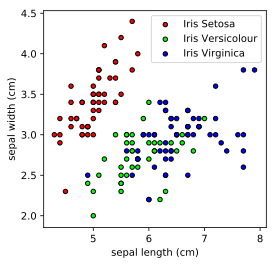

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn import neighbors, datasets
iris = datasets.load_iris()
cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA', '#AAAAFF'])
cmap_bold = ListedColormap(['#FF0000',  '#00FF00', '#0000FF'])

K = 3
x = X[-1]

fig, ax = plt.subplots(figsize=(4,4))
for i, iris_class in enumerate(['Iris Setosa', 'Iris Versicolour', 'Iris Virginica']):
    idx = y==i
    ax.scatter(X[idx,0], X[idx,1], 
               c=cmap_bold.colors[i], edgecolor='k', 
               s=20, label=iris_class);
ax.set(xlabel='sepal length (cm)', ylabel='sepal width (cm)')
ax.legend();

The idea behind a KNN classifier is pretty simple: Given a training set $\boldsymbol X \in \mathbb{R}^{N \times D}$ and $\boldsymbol y \in \mathbb{Z}^N$, we predict the label of a new point $\boldsymbol x \in \mathbb{R}^{D}$ __as the label of the majority of its "K nearest neighbor"__ (hence the name KNN) by some distance measure (e.g the Euclidean distance).
Here, $N$ is the number of data points in the dataset, and $D$ is the dimensionality of the data.

In [20]:
# GRADED FUNCTION: DO NOT EDIT THIS LINE

def pairwise_distance_matrix(X, Y):
    """Compute the pairwise distance between rows of X and rows of Y

    Arguments
    ----------
    X: ndarray of size (N, D)
    Y: ndarray of size (M, D)
    
    Returns
    --------
    distance_matrix: matrix of shape (N, M), each entry distance_matrix[i,j] is the distance between
    ith row of X and the jth row of Y (we use the dot product to compute the distance).
    """
    N, D = X.shape
    M, _ = Y.shape
    dist_matrix = distance_matrix(X, Y) # <-- EDIT THIS to compute the correct distance matrix.
    return dist_matrix



For `pairwise_distance_matrix`, you may be tempting to iterate through
rows of $\boldsymbol X$ and $\boldsymbol Y$ and fill in the distance matrix, but that is slow! Can you
think of some way to vectorize your computation (i.e. make it faster by using numpy/scipy operations only)?

In [46]:
# GRADED FUNCTION: DO NOT EDIT THIS LINE

def KNN(k, X, y, x):
    """K nearest neighbors
    k: number of nearest neighbors
    X: training input locations
    y: training labels
    x: test input
    """
    N, D = X.shape
    M, _ = x.shape
    
    num_classes = len(np.unique(y))
    
    #print("num classes", np.unique(y))
    dist = pairwise_distance_matrix(X, x) # <-- EDIT THIS to compute the pairwise distance matrix
    
    print(">>> distances matrix\n", dist)
    # Next we make the predictions
    ypred = np.zeros(num_classes)
    print(">>> ypred before\n", ypred)
    print("reshaped ordered",np.argsort(dist.reshape(N)))
    
    classes = y[np.argsort(dist.reshape(N))][:k] # find the labels of the k nearest neighbors
    #print("reshaped ordered",np.argsort(dist.reshape(N)) )
    for c in np.unique(classes):
        ypred[c] = 0  # <-- EDIT THIS to compute the correct prediction
        
    return np.argmax(ypred)

We can also visualize the "decision boundary" of the KNN classifier, which is the region of a problem space in which the output label of a classifier is ambiguous. This would help us develop an intuition of how KNN behaves in practice. The code below plots the decision boundary.

>>> distances matrix
 [[ 3.08058436]
 [ 2.56124969]
 [ 2.60768096]
 [ 2.46981781]
 [ 3.10644491]
 [ 3.58050276]
 [ 2.72946881]
 [ 2.94108823]
 [ 2.19544984]
 [ 2.64007576]
 [ 3.42052628]
 [ 2.83019434]
 [ 2.5       ]
 [ 2.23606798]
 [ 3.90512484]
 [ 4.16173041]
 [ 3.58050276]
 [ 3.08058436]
 [ 3.68781778]
 [ 3.3286634 ]
 [ 3.18904374]
 [ 3.24499615]
 [ 2.90688837]
 [ 2.92061637]
 [ 2.83019434]
 [ 2.62488095]
 [ 2.94108823]
 [ 3.14006369]
 [ 3.06104557]
 [ 2.60768096]
 [ 2.58069758]
 [ 3.18904374]
 [ 3.63593179]
 [ 3.88329757]
 [ 2.64007576]
 [ 2.78028775]
 [ 3.33016516]
 [ 2.64007576]
 [ 2.28254244]
 [ 3.        ]
 [ 3.02324329]
 [ 1.7691806 ]
 [ 2.45967478]
 [ 3.02324329]
 [ 3.3286634 ]
 [ 2.5       ]
 [ 3.3286634 ]
 [ 2.55538647]
 [ 3.36005952]
 [ 2.86006993]
 [ 4.30464865]
 [ 3.80131556]
 [ 4.1677332 ]
 [ 2.55538647]
 [ 3.67151195]
 [ 3.        ]
 [ 3.78021163]
 [ 2.12602916]
 [ 3.80788655]
 [ 2.54950976]
 [ 1.97230829]
 [ 3.28024389]
 [ 2.95465734]
 [ 3.38378486]
 [ 2.98328678]
 [ 

>>> distances matrix
 [[ 2.53179778]
 [ 2.0880613 ]
 [ 2.34093998]
 [ 2.28473193]
 [ 2.64764046]
 [ 2.90172363]
 [ 2.56320112]
 [ 2.45153013]
 [ 2.19544984]
 [ 2.18403297]
 [ 2.70185122]
 [ 2.5       ]
 [ 2.11896201]
 [ 2.33238076]
 [ 3.01496269]
 [ 3.40587727]
 [ 2.90172363]
 [ 2.53179778]
 [ 2.80713377]
 [ 2.82842712]
 [ 2.40208243]
 [ 2.72946881]
 [ 2.7513633 ]
 [ 2.33452351]
 [ 2.5       ]
 [ 2.06155281]
 [ 2.45153013]
 [ 2.51793566]
 [ 2.41867732]
 [ 2.34093998]
 [ 2.21359436]
 [ 2.40208243]
 [ 3.1144823 ]
 [ 3.2       ]
 [ 2.18403297]
 [ 2.25610283]
 [ 2.5       ]
 [ 2.18403297]
 [ 2.28254244]
 [ 2.43310501]
 [ 2.54950976]
 [ 1.64012195]
 [ 2.45967478]
 [ 2.54950976]
 [ 2.82842712]
 [ 2.11896201]
 [ 2.82842712]
 [ 2.37697286]
 [ 2.70739727]
 [ 2.35372046]
 [ 2.66270539]
 [ 2.37697286]
 [ 2.52388589]
 [ 1.3       ]
 [ 2.05912603]
 [ 1.81107703]
 [ 2.43515913]
 [ 1.52315462]
 [ 2.19544984]
 [ 1.72626765]
 [ 1.11803399]
 [ 2.03960781]
 [ 1.3       ]
 [ 1.99248588]
 [ 1.90262976]
 [ 

>>> distances matrix
 [[ 3.53553391]
 [ 3.36005952]
 [ 3.64005494]
 [ 3.66196668]
 [ 3.67695526]
 [ 3.64005494]
 [ 3.84187454]
 [ 3.5383612 ]
 [ 3.72155881]
 [ 3.42052628]
 [ 3.48281495]
 [ 3.68781778]
 [ 3.44093011]
 [ 3.85875628]
 [ 3.49857114]
 [ 3.89486842]
 [ 3.64005494]
 [ 3.53553391]
 [ 3.38378486]
 [ 3.75366488]
 [ 3.25576412]
 [ 3.6796739 ]
 [ 3.96988665]
 [ 3.39705755]
 [ 3.68781778]
 [ 3.28024389]
 [ 3.5383612 ]
 [ 3.46554469]
 [ 3.39411255]
 [ 3.64005494]
 [ 3.5       ]
 [ 3.25576412]
 [ 3.92045916]
 [ 3.82753184]
 [ 3.42052628]
 [ 3.40587727]
 [ 3.26496554]
 [ 3.42052628]
 [ 3.77359245]
 [ 3.46554469]
 [ 3.60693776]
 [ 3.36154726]
 [ 3.88329757]
 [ 3.60693776]
 [ 3.75366488]
 [ 3.44093011]
 [ 3.75366488]
 [ 3.72021505]
 [ 3.54682957]
 [ 3.47131099]
 [ 2.28035085]
 [ 2.50599282]
 [ 2.21359436]
 [ 2.46981781]
 [ 2.10950231]
 [ 2.61725047]
 [ 2.64196896]
 [ 3.04138127]
 [ 2.14709106]
 [ 2.94108823]
 [ 2.78567766]
 [ 2.62488095]
 [ 2.        ]
 [ 2.42074369]
 [ 2.75862284]
 [ 

 [ 2.75862284]]
>>> ypred before
 [ 0.  0.  0.]
reshaped ordered [[0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]]
>>> distances matrix
 [[ 2.64007576]
 [ 2.1023796 ]
 [ 2.21359436]
 [ 2.0880613 ]
 [ 2.6925824 ]
 [ 3.13049517]
 [ 2.37697286]
 [ 2.50798724]
 [ 1.84390889]
 [ 2.19317122]
 [ 2.9529646

>>> distances matrix
 [[ 2.6       ]
 [ 2.24722051]
 [ 2.52388589]
 [ 2.5       ]
 [ 2.73130006]
 [ 2.88617394]
 [ 2.74590604]
 [ 2.54950976]
 [ 2.47588368]
 [ 2.33238076]
 [ 2.6925824 ]
 [ 2.64196896]
 [ 2.30217289]
 [ 2.61725047]
 [ 2.91547595]
 [ 3.32415403]
 [ 2.88617394]
 [ 2.6       ]
 [ 2.72946881]
 [ 2.87923601]
 [ 2.40416306]
 [ 2.78567766]
 [ 2.91547595]
 [ 2.41660919]
 [ 2.64196896]
 [ 2.19544984]
 [ 2.54950976]
 [ 2.56320112]
 [ 2.46981781]
 [ 2.52388589]
 [ 2.38537209]
 [ 2.40416306]
 [ 3.13209195]
 [ 3.15753068]
 [ 2.33238076]
 [ 2.37065392]
 [ 2.47386338]
 [ 2.33238076]
 [ 2.54950976]
 [ 2.50798724]
 [ 2.64007576]
 [ 2.        ]
 [ 2.70185122]
 [ 2.64007576]
 [ 2.87923601]
 [ 2.30217289]
 [ 2.87923601]
 [ 2.58069758]
 [ 2.7202941 ]
 [ 2.45967478]
 [ 2.28473193]
 [ 2.12132034]
 [ 2.15406592]
 [ 1.34164079]
 [ 1.74642492]
 [ 1.74642492]
 [ 2.2090722 ]
 [ 1.7691806 ]
 [ 1.86815417]
 [ 1.83575598]
 [ 1.42126704]
 [ 1.91049732]
 [ 1.1045361 ]
 [ 1.8       ]
 [ 1.86815417]
 [ 

>>> distances matrix
 [[ 4.        ]
 [ 3.89486842]
 [ 4.1677332 ]
 [ 4.20594817]
 [ 4.14004831]
 [ 4.03112887]
 [ 4.35660418]
 [ 4.02243707]
 [ 4.29534632]
 [ 3.94461658]
 [ 3.89486842]
 [ 4.18807832]
 [ 3.98246155]
 [ 4.42831797]
 [ 3.82883794]
 [ 4.20119031]
 [ 4.03112887]
 [ 4.        ]
 [ 3.74833296]
 [ 4.18688428]
 [ 3.7013511 ]
 [ 4.12310563]
 [ 4.46542271]
 [ 3.88329757]
 [ 4.18807832]
 [ 3.80788655]
 [ 4.02243707]
 [ 3.92045916]
 [ 3.86005181]
 [ 4.1677332 ]
 [ 4.03112887]
 [ 3.7013511 ]
 [ 4.31393092]
 [ 4.17731971]
 [ 3.94461658]
 [ 3.91152144]
 [ 3.68781778]
 [ 3.94461658]
 [ 4.33820239]
 [ 3.9408121 ]
 [ 4.08044115]
 [ 3.98497177]
 [ 4.42944692]
 [ 4.08044115]
 [ 4.18688428]
 [ 3.98246155]
 [ 4.18688428]
 [ 4.25440948]
 [ 3.96988665]
 [ 3.9661064 ]
 [ 2.46981781]
 [ 2.83196045]
 [ 2.44131112]
 [ 3.04630924]
 [ 2.47588368]
 [ 3.10644491]
 [ 2.97321375]
 [ 3.64005494]
 [ 2.47588368]
 [ 3.48855271]
 [ 3.42052628]
 [ 3.06104557]
 [ 2.54950976]
 [ 2.84253408]
 [ 3.24499615]
 [ 

 [[ 2.3194827 ]
 [ 1.80277564]
 [ 2.00249844]
 [ 1.91049732]
 [ 2.40831892]
 [ 2.76586334]
 [ 2.2090722 ]
 [ 2.2090722 ]
 [ 1.74642492]
 [ 1.90262976]
 [ 2.57099203]
 [ 2.2       ]
 [ 1.8       ]
 [ 1.86815417]
 [ 2.97321375]
 [ 3.32415403]
 [ 2.76586334]
 [ 2.3194827 ]
 [ 2.7513633 ]
 [ 2.61725047]
 [ 2.28035085]
 [ 2.51793566]
 [ 2.40831892]
 [ 2.12132034]
 [ 2.2       ]
 [ 1.81107703]
 [ 2.2090722 ]
 [ 2.33452351]
 [ 2.23606798]
 [ 2.00249844]
 [ 1.9       ]
 [ 2.28035085]
 [ 2.92745623]
 [ 3.08058436]
 [ 1.90262976]
 [ 2.00997512]
 [ 2.40416306]
 [ 1.90262976]
 [ 1.84390889]
 [ 2.22036033]
 [ 2.30867928]
 [ 1.14017543]
 [ 2.03960781]
 [ 2.30867928]
 [ 2.61725047]
 [ 1.8       ]
 [ 2.61725047]
 [ 2.00997512]
 [ 2.54950976]
 [ 2.10950231]
 [ 2.97321375]
 [ 2.56124969]
 [ 2.83196045]
 [ 1.30384048]
 [ 2.33452351]
 [ 1.83575598]
 [ 2.58069758]
 [ 1.20415946]
 [ 2.47588368]
 [ 1.55241747]
 [ 0.82462113]
 [ 2.10950231]
 [ 1.56204994]
 [ 2.14009346]
 [ 1.87882942]
 [ 2.68700577]
 [ 1.9697

>>> distances matrix
 [[ 2.98328678]
 [ 2.76586334]
 [ 3.04795013]
 [ 3.06104557]
 [ 3.12409987]
 [ 3.13847097]
 [ 3.25576412]
 [ 2.97321375]
 [ 3.10644491]
 [ 2.83196045]
 [ 2.96816442]
 [ 3.11126984]
 [ 2.84253408]
 [ 3.24499615]
 [ 3.04630924]
 [ 3.45398321]
 [ 3.13847097]
 [ 2.98328678]
 [ 2.90688837]
 [ 3.22024844]
 [ 2.7202941 ]
 [ 3.14006369]
 [ 3.39411255]
 [ 2.83196045]
 [ 3.11126984]
 [ 2.69072481]
 [ 2.97321375]
 [ 2.92061637]
 [ 2.84253408]
 [ 3.04795013]
 [ 2.90688837]
 [ 2.7202941 ]
 [ 3.41320963]
 [ 3.35410197]
 [ 2.83196045]
 [ 2.82842712]
 [ 2.74590604]
 [ 2.83196045]
 [ 3.16227766]
 [ 2.90688837]
 [ 3.04795013]
 [ 2.73130006]
 [ 3.28024389]
 [ 3.04795013]
 [ 3.22024844]
 [ 2.84253408]
 [ 3.22024844]
 [ 3.12409987]
 [ 3.02324329]
 [ 2.9       ]
 [ 2.        ]
 [ 2.0880613 ]
 [ 1.90262976]
 [ 1.86010752]
 [ 1.67630546]
 [ 2.06155281]
 [ 2.21359436]
 [ 2.41867732]
 [ 1.74642492]
 [ 2.3430749 ]
 [ 2.15406592]
 [ 2.10950231]
 [ 1.41421356]
 [ 1.92353841]
 [ 2.20227155]
 [ 

 [[ 2.84253408]
 [ 2.33452351]
 [ 2.36008474]
 [ 2.22036033]
 [ 2.86006993]
 [ 3.34215499]
 [ 2.46981781]
 [ 2.70185122]
 [ 1.94164878]
 [ 2.40831892]
 [ 3.18904374]
 [ 2.58069758]
 [ 2.26715681]
 [ 1.97230829]
 [ 3.6796739 ]
 [ 3.92045916]
 [ 3.34215499]
 [ 2.84253408]
 [ 3.46554469]
 [ 3.08058436]
 [ 2.96984848]
 [ 3.        ]
 [ 2.64196896]
 [ 2.69072481]
 [ 2.58069758]
 [ 2.40416306]
 [ 2.70185122]
 [ 2.90688837]
 [ 2.83196045]
 [ 2.36008474]
 [ 2.3430749 ]
 [ 2.96984848]
 [ 3.38378486]
 [ 3.64005494]
 [ 2.40831892]
 [ 2.54950976]
 [ 3.11126984]
 [ 2.40831892]
 [ 2.02484567]
 [ 2.76586334]
 [ 2.78028775]
 [ 1.56204994]
 [ 2.19544984]
 [ 2.78028775]
 [ 3.08058436]
 [ 2.26715681]
 [ 3.08058436]
 [ 2.30217289]
 [ 3.12409987]
 [ 2.62488095]
 [ 4.15932687]
 [ 3.63593179]
 [ 4.02492236]
 [ 2.41660919]
 [ 3.53411941]
 [ 2.83019434]
 [ 3.60555128]
 [ 1.94164878]
 [ 3.66742416]
 [ 2.36008474]
 [ 1.83847763]
 [ 3.10644491]
 [ 2.84604989]
 [ 3.2249031 ]
 [ 2.80178515]
 [ 3.84707681]
 [ 2.8600

>>> distances matrix
 [[ 2.22036033]
 [ 1.77200451]
 [ 2.02484567]
 [ 1.96977156]
 [ 2.33452351]
 [ 2.6       ]
 [ 2.24722051]
 [ 2.13775583]
 [ 1.88679623]
 [ 1.86815417]
 [ 2.4       ]
 [ 2.18403297]
 [ 1.80277564]
 [ 2.02484567]
 [ 2.72946881]
 [ 3.1144823 ]
 [ 2.6       ]
 [ 2.22036033]
 [ 2.51793566]
 [ 2.51793566]
 [ 2.1       ]
 [ 2.41867732]
 [ 2.43515913]
 [ 2.02237484]
 [ 2.18403297]
 [ 1.74642492]
 [ 2.13775583]
 [ 2.2090722 ]
 [ 2.10950231]
 [ 2.02484567]
 [ 1.8973666 ]
 [ 2.1       ]
 [ 2.80713377]
 [ 2.90172363]
 [ 1.86815417]
 [ 1.94164878]
 [ 2.20227155]
 [ 1.86815417]
 [ 1.97230829]
 [ 2.12132034]
 [ 2.23606798]
 [ 1.3453624 ]
 [ 2.14709106]
 [ 2.23606798]
 [ 2.51793566]
 [ 1.80277564]
 [ 2.51793566]
 [ 2.06155281]
 [ 2.40208243]
 [ 2.03960781]
 [ 2.48394847]
 [ 2.14709106]
 [ 2.3430749 ]
 [ 1.00498756]
 [ 1.86010752]
 [ 1.52970585]
 [ 2.19317122]
 [ 1.2083046 ]
 [ 2.        ]
 [ 1.41421356]
 [ 0.80622577]
 [ 1.77200451]
 [ 1.08166538]
 [ 1.74642492]
 [ 1.61245155]
 [ 

 [[ 3.18276609]
 [ 3.02324329]
 [ 3.3015148 ]
 [ 3.3286634 ]
 [ 3.32415403]
 [ 3.28024389]
 [ 3.5       ]
 [ 3.18904374]
 [ 3.4       ]
 [ 3.08058436]
 [ 3.12409987]
 [ 3.34215499]
 [ 3.10644491]
 [ 3.53553391]
 [ 3.13847097]
 [ 3.53553391]
 [ 3.28024389]
 [ 3.18276609]
 [ 3.02324329]
 [ 3.39705755]
 [ 2.9       ]
 [ 3.32415403]
 [ 3.62353419]
 [ 3.04795013]
 [ 3.34215499]
 [ 2.94108823]
 [ 3.18904374]
 [ 3.11126984]
 [ 3.04138127]
 [ 3.3015148 ]
 [ 3.16227766]
 [ 2.9       ]
 [ 3.56089876]
 [ 3.46698716]
 [ 3.08058436]
 [ 3.06104557]
 [ 2.90688837]
 [ 3.08058436]
 [ 3.44818793]
 [ 3.1144823 ]
 [ 3.25576412]
 [ 3.06757233]
 [ 3.55105618]
 [ 3.25576412]
 [ 3.39705755]
 [ 3.10644491]
 [ 3.39705755]
 [ 3.38378486]
 [ 3.18904374]
 [ 3.12409987]
 [ 1.94164878]
 [ 2.14709106]
 [ 1.86815417]
 [ 2.14709106]
 [ 1.74928557]
 [ 2.26715681]
 [ 2.28254244]
 [ 2.73130006]
 [ 1.78885438]
 [ 2.60768096]
 [ 2.5       ]
 [ 2.26715681]
 [ 1.6643317 ]
 [ 2.06155281]
 [ 2.40831892]
 [ 1.93132079]
 [ 2.4758

>>> distances matrix
 [[ 2.37065392]
 [ 1.83575598]
 [ 1.93132079]
 [ 1.80277564]
 [ 2.41660919]
 [ 2.86530976]
 [ 2.0880613 ]
 [ 2.23606798]
 [ 1.55241747]
 [ 1.92353841]
 [ 2.6925824 ]
 [ 2.15406592]
 [ 1.78885438]
 [ 1.62788206]
 [ 3.16227766]
 [ 3.44818793]
 [ 2.86530976]
 [ 2.37065392]
 [ 2.94108823]
 [ 2.64007576]
 [ 2.44131112]
 [ 2.54950976]
 [ 2.28035085]
 [ 2.19544984]
 [ 2.15406592]
 [ 1.88679623]
 [ 2.23606798]
 [ 2.41867732]
 [ 2.33238076]
 [ 1.93132079]
 [ 1.87882942]
 [ 2.44131112]
 [ 2.95465734]
 [ 3.17647603]
 [ 1.92353841]
 [ 2.05912603]
 [ 2.58069758]
 [ 1.92353841]
 [ 1.64924225]
 [ 2.28254244]
 [ 2.32594067]
 [ 1.02956301]
 [ 1.84390889]
 [ 2.32594067]
 [ 2.64007576]
 [ 1.78885438]
 [ 2.64007576]
 [ 1.8973666 ]
 [ 2.64196896]
 [ 2.14709106]
 [ 3.49857114]
 [ 3.        ]
 [ 3.36154726]
 [ 1.74928557]
 [ 2.86530976]
 [ 2.20227155]
 [ 2.98328678]
 [ 1.3453624 ]
 [ 3.0016662 ]
 [ 1.7691806 ]
 [ 1.16619038]
 [ 2.48394847]
 [ 2.15406592]
 [ 2.58069758]
 [ 2.19317122]
 [ 

>>> distances matrix
 [[ 2.32594067]
 [ 2.        ]
 [ 2.28035085]
 [ 2.26715681]
 [ 2.45967478]
 [ 2.596151  ]
 [ 2.5       ]
 [ 2.28254244]
 [ 2.26715681]
 [ 2.0808652 ]
 [ 2.40416306]
 [ 2.38537209]
 [ 2.06155281]
 [ 2.40831892]
 [ 2.61725047]
 [ 3.02654919]
 [ 2.596151  ]
 [ 2.32594067]
 [ 2.43310501]
 [ 2.6       ]
 [ 2.11896201]
 [ 2.50798724]
 [ 2.66270539]
 [ 2.14709106]
 [ 2.38537209]
 [ 1.94164878]
 [ 2.28254244]
 [ 2.28473193]
 [ 2.19317122]
 [ 2.28035085]
 [ 2.14009346]
 [ 2.11896201]
 [ 2.84604989]
 [ 2.86356421]
 [ 2.0808652 ]
 [ 2.10950231]
 [ 2.18403297]
 [ 2.0808652 ]
 [ 2.33452351]
 [ 2.23606798]
 [ 2.37065392]
 [ 1.83575598]
 [ 2.47588368]
 [ 2.37065392]
 [ 2.6       ]
 [ 2.06155281]
 [ 2.6       ]
 [ 2.3430749 ]
 [ 2.43515913]
 [ 2.19544984]
 [ 2.01246118]
 [ 1.82482876]
 [ 1.87882942]
 [ 1.08166538]
 [ 1.45602198]
 [ 1.45602198]
 [ 1.91049732]
 [ 1.56204994]
 [ 1.58113883]
 [ 1.58113883]
 [ 1.25299641]
 [ 1.61245155]
 [ 0.80622577]
 [ 1.5       ]
 [ 1.58113883]
 [ 

>>> distances matrix
 [[ 3.66196668]
 [ 3.57770876]
 [ 3.84707681]
 [ 3.89101529]
 [ 3.80131556]
 [ 3.6796739 ]
 [ 4.03112887]
 [ 3.68917335]
 [ 3.99249296]
 [ 3.62353419]
 [ 3.54682957]
 [ 3.85875628]
 [ 3.66742416]
 [ 4.12310563]
 [ 3.47131099]
 [ 3.84187454]
 [ 3.6796739 ]
 [ 3.66196668]
 [ 3.39411255]
 [ 3.84187454]
 [ 3.36005952]
 [ 3.78021163]
 [ 4.13400532]
 [ 3.55105618]
 [ 3.85875628]
 [ 3.48855271]
 [ 3.68917335]
 [ 3.58050276]
 [ 3.52278299]
 [ 3.84707681]
 [ 3.71214224]
 [ 3.36005952]
 [ 3.96232255]
 [ 3.82099463]
 [ 3.62353419]
 [ 3.58468967]
 [ 3.34215499]
 [ 3.62353419]
 [ 4.03112887]
 [ 3.60555128]
 [ 3.74432905]
 [ 3.71079506]
 [ 4.11460812]
 [ 3.74432905]
 [ 3.84187454]
 [ 3.66742416]
 [ 3.84187454]
 [ 3.93573373]
 [ 3.62353419]
 [ 3.63593179]
 [ 2.10950231]
 [ 2.47588368]
 [ 2.0808652 ]
 [ 2.7513633 ]
 [ 2.12602916]
 [ 2.7784888 ]
 [ 2.61725047]
 [ 3.35261092]
 [ 2.12132034]
 [ 3.17804972]
 [ 3.15753068]
 [ 2.7202941 ]
 [ 2.24722051]
 [ 2.5       ]
 [ 2.91547595]
 [ 

>>> distances matrix
 [[ 2.02237484]
 [ 1.50332964]
 [ 1.70293864]
 [ 1.61245155]
 [ 2.10950231]
 [ 2.47386338]
 [ 1.91049732]
 [ 1.91049732]
 [ 1.45602198]
 [ 1.60312195]
 [ 2.28035085]
 [ 1.9       ]
 [ 1.5       ]
 [ 1.58113883]
 [ 2.6925824 ]
 [ 3.03644529]
 [ 2.47386338]
 [ 2.02237484]
 [ 2.46981781]
 [ 2.3194827 ]
 [ 1.99248588]
 [ 2.22036033]
 [ 2.10950231]
 [ 1.82482876]
 [ 1.9       ]
 [ 1.5132746 ]
 [ 1.91049732]
 [ 2.03960781]
 [ 1.94164878]
 [ 1.70293864]
 [ 1.6       ]
 [ 1.99248588]
 [ 2.63058929]
 [ 2.78926514]
 [ 1.60312195]
 [ 1.71172428]
 [ 2.11896201]
 [ 1.60312195]
 [ 1.55241747]
 [ 1.92353841]
 [ 2.00997512]
 [ 0.85440037]
 [ 1.74642492]
 [ 2.00997512]
 [ 2.3194827 ]
 [ 1.5       ]
 [ 2.3194827 ]
 [ 1.71172428]
 [ 2.25610283]
 [ 1.81107703]
 [ 2.78028775]
 [ 2.33452351]
 [ 2.64007576]
 [ 1.06301458]
 [ 2.14009346]
 [ 1.58113883]
 [ 2.3430749 ]
 [ 0.90553851]
 [ 2.28035085]
 [ 1.26491106]
 [ 0.53851648]
 [ 1.86010752]
 [ 1.3892444 ]
 [ 1.91049732]
 [ 1.61245155]
 [ 

 [ 1.80277564]]
>>> ypred before
 [ 0.  0.  0.]
reshaped ordered [[0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]]
>>> distances matrix
 [[ 2.75862284]
 [ 2.58069758]
 [ 2.86006993]
 [ 2.88444102]
 [ 2.9       ]
 [ 2.88444102]
 [ 3.06104557]
 [ 2.75862284]
 [ 2.95296461]
 [ 2.64007576]
 [ 2.7202941

>>> distances matrix
 [[ 2.61725047]
 [ 2.12602916]
 [ 2.12602916]
 [ 1.98494332]
 [ 2.62488095]
 [ 3.1144823 ]
 [ 2.22036033]
 [ 2.47588368]
 [ 1.70293864]
 [ 2.19317122]
 [ 2.96984848]
 [ 2.3430749 ]
 [ 2.05182845]
 [ 1.72046505]
 [ 3.46554469]
 [ 3.68781778]
 [ 3.1144823 ]
 [ 2.61725047]
 [ 3.25576412]
 [ 2.84253408]
 [ 2.76586334]
 [ 2.76586334]
 [ 2.38537209]
 [ 2.47588368]
 [ 2.3430749 ]
 [ 2.20227155]
 [ 2.47588368]
 [ 2.68700577]
 [ 2.61725047]
 [ 2.12602916]
 [ 2.12132034]
 [ 2.76586334]
 [ 3.14006369]
 [ 3.40587727]
 [ 2.19317122]
 [ 2.33452351]
 [ 2.90688837]
 [ 2.19317122]
 [ 1.78044938]
 [ 2.54558441]
 [ 2.54950976]
 [ 1.3892444 ]
 [ 1.94164878]
 [ 2.54950976]
 [ 2.84253408]
 [ 2.05182845]
 [ 2.84253408]
 [ 2.06155281]
 [ 2.9       ]
 [ 2.40416306]
 [ 4.03112887]
 [ 3.48855271]
 [ 3.9       ]
 [ 2.30867928]
 [ 3.4176015 ]
 [ 2.68328157]
 [ 3.44818793]
 [ 1.78885438]
 [ 3.54682957]
 [ 2.19544984]
 [ 1.74642492]
 [ 2.95296461]
 [ 2.76586334]
 [ 3.08706981]
 [ 2.64196896]
 [ 

>>> distances matrix
 [[ 1.92353841]
 [ 1.48660687]
 [ 1.74642492]
 [ 1.7       ]
 [ 2.03960781]
 [ 2.3       ]
 [ 1.96977156]
 [ 1.84390889]
 [ 1.64012195]
 [ 1.58113883]
 [ 2.1       ]
 [ 1.8973666 ]
 [ 1.52315462]
 [ 1.78044938]
 [ 2.43310501]
 [ 2.81602557]
 [ 2.3       ]
 [ 1.92353841]
 [ 2.22036033]
 [ 2.22036033]
 [ 1.8       ]
 [ 2.12132034]
 [ 2.15406592]
 [ 1.72626765]
 [ 1.8973666 ]
 [ 1.45602198]
 [ 1.84390889]
 [ 1.91049732]
 [ 1.81107703]
 [ 1.74642492]
 [ 1.61554944]
 [ 1.8       ]
 [ 2.50798724]
 [ 2.60192237]
 [ 1.58113883]
 [ 1.64924225]
 [ 1.90262976]
 [ 1.58113883]
 [ 1.72046505]
 [ 1.82482876]
 [ 1.94164878]
 [ 1.14017543]
 [ 1.88679623]
 [ 1.94164878]
 [ 2.22036033]
 [ 1.52315462]
 [ 2.22036033]
 [ 1.78885438]
 [ 2.1023796 ]
 [ 1.74642492]
 [ 2.2627417 ]
 [ 1.88679623]
 [ 2.12132034]
 [ 0.70710678]
 [ 1.62788206]
 [ 1.23693169]
 [ 1.92353841]
 [ 0.94339811]
 [ 1.7691806 ]
 [ 1.11803399]
 [ 0.56568542]
 [ 1.48660687]
 [ 0.84852814]
 [ 1.47648231]
 [ 1.31529464]
 [ 

>>> distances matrix
 [[ 3.14006369]
 [ 3.04138127]
 [ 3.31209903]
 [ 3.35410197]
 [ 3.28024389]
 [ 3.18276609]
 [ 3.49857114]
 [ 3.16227766]
 [ 3.45398321]
 [ 3.08868904]
 [ 3.04138127]
 [ 3.3286634 ]
 [ 3.13049517]
 [ 3.58468967]
 [ 3.        ]
 [ 3.38378486]
 [ 3.18276609]
 [ 3.14006369]
 [ 2.90688837]
 [ 3.33016516]
 [ 2.84253408]
 [ 3.26496554]
 [ 3.60555128]
 [ 3.02324329]
 [ 3.3286634 ]
 [ 2.95296461]
 [ 3.16227766]
 [ 3.06104557]
 [ 3.        ]
 [ 3.31209903]
 [ 3.17647603]
 [ 2.84253408]
 [ 3.46554469]
 [ 3.34215499]
 [ 3.08868904]
 [ 3.0528675 ]
 [ 2.83196045]
 [ 3.08868904]
 [ 3.49284984]
 [ 3.08058436]
 [ 3.22024844]
 [ 3.17804972]
 [ 3.57770876]
 [ 3.22024844]
 [ 3.33016516]
 [ 3.13049517]
 [ 3.33016516]
 [ 3.4       ]
 [ 3.1144823 ]
 [ 3.10644491]
 [ 1.70880075]
 [ 2.        ]
 [ 1.65529454]
 [ 2.21359436]
 [ 1.62788206]
 [ 2.24722051]
 [ 2.14009346]
 [ 2.81602557]
 [ 1.64012195]
 [ 2.64007576]
 [ 2.63058929]
 [ 2.20227155]
 [ 1.70880075]
 [ 1.98494332]
 [ 2.38537209]
 [ 

>>> distances matrix
 [[ 2.01246118]
 [ 1.47648231]
 [ 1.58113883]
 [ 1.45602198]
 [ 2.06155281]
 [ 2.50599282]
 [ 1.74642492]
 [ 1.87882942]
 [ 1.21655251]
 [ 1.56524758]
 [ 2.33238076]
 [ 1.80277564]
 [ 1.43178211]
 [ 1.30384048]
 [ 2.80178515]
 [ 3.08868904]
 [ 2.50599282]
 [ 2.01246118]
 [ 2.58069758]
 [ 2.28473193]
 [ 2.0808652 ]
 [ 2.19317122]
 [ 1.94164878]
 [ 1.83575598]
 [ 1.80277564]
 [ 1.52643375]
 [ 1.87882942]
 [ 2.05912603]
 [ 1.97230829]
 [ 1.58113883]
 [ 1.52315462]
 [ 2.0808652 ]
 [ 2.6       ]
 [ 2.81780056]
 [ 1.56524758]
 [ 1.7       ]
 [ 2.22036033]
 [ 1.56524758]
 [ 1.31529464]
 [ 1.92353841]
 [ 1.96977156]
 [ 0.67082039]
 [ 1.5132746 ]
 [ 1.96977156]
 [ 2.28473193]
 [ 1.43178211]
 [ 2.28473193]
 [ 1.55241747]
 [ 2.28254244]
 [ 1.78885438]
 [ 3.17647603]
 [ 2.66270539]
 [ 3.04138127]
 [ 1.43178211]
 [ 2.54950976]
 [ 1.86010752]
 [ 2.64007576]
 [ 0.98994949]
 [ 2.68328157]
 [ 1.41421356]
 [ 0.85440037]
 [ 2.14009346]
 [ 1.86815417]
 [ 2.24722051]
 [ 1.84390889]
 [ 

>>> distances matrix
 [[ 2.10950231]
 [ 1.83847763]
 [ 2.12132034]
 [ 2.12602916]
 [ 2.24722051]
 [ 2.34093998]
 [ 2.33452351]
 [ 2.0808652 ]
 [ 2.16333077]
 [ 1.91049732]
 [ 2.15406592]
 [ 2.20227155]
 [ 1.91049732]
 [ 2.30217289]
 [ 2.33452351]
 [ 2.74590604]
 [ 2.34093998]
 [ 2.10950231]
 [ 2.15870331]
 [ 2.37065392]
 [ 1.87882942]
 [ 2.28254244]
 [ 2.48394847]
 [ 1.94164878]
 [ 2.20227155]
 [ 1.7691806 ]
 [ 2.0808652 ]
 [ 2.05912603]
 [ 1.97230829]
 [ 2.12132034]
 [ 1.97989899]
 [ 1.87882942]
 [ 2.6       ]
 [ 2.596151  ]
 [ 1.91049732]
 [ 1.92093727]
 [ 1.93132079]
 [ 1.91049732]
 [ 2.22036033]
 [ 2.02484567]
 [ 2.16333077]
 [ 1.80277564]
 [ 2.3430749 ]
 [ 2.16333077]
 [ 2.37065392]
 [ 1.91049732]
 [ 2.37065392]
 [ 2.19317122]
 [ 2.19317122]
 [ 2.        ]
 [ 1.7       ]
 [ 1.5132746 ]
 [ 1.56524758]
 [ 0.92195445]
 [ 1.14017543]
 [ 1.2083046 ]
 [ 1.60312195]
 [ 1.47648231]
 [ 1.26491106]
 [ 1.41421356]
 [ 1.23693169]
 [ 1.33416641]
 [ 0.53851648]
 [ 1.20415946]
 [ 1.34164079]
 [ 

>>> distances matrix
 [[ 3.58468967]
 [ 3.54682957]
 [ 3.80788655]
 [ 3.86264158]
 [ 3.72155881]
 [ 3.56089876]
 [ 3.98120585]
 [ 3.62353419]
 [ 3.98497177]
 [ 3.58468967]
 [ 3.44093011]
 [ 3.80131556]
 [ 3.64005494]
 [ 4.11096096]
 [ 3.32415403]
 [ 3.6796739 ]
 [ 3.56089876]
 [ 3.58468967]
 [ 3.26496554]
 [ 3.74432905]
 [ 3.27566787]
 [ 3.68917335]
 [ 4.07062649]
 [ 3.48855271]
 [ 3.80131556]
 [ 3.45398321]
 [ 3.62353419]
 [ 3.49857114]
 [ 3.44818793]
 [ 3.80788655]
 [ 3.67695526]
 [ 3.27566787]
 [ 3.84187454]
 [ 3.6796739 ]
 [ 3.58468967]
 [ 3.53411941]
 [ 3.24499615]
 [ 3.58468967]
 [ 4.01621713]
 [ 3.53553391]
 [ 3.67151195]
 [ 3.74833296]
 [ 4.08533964]
 [ 3.67151195]
 [ 3.74432905]
 [ 3.64005494]
 [ 3.74432905]
 [ 3.9       ]
 [ 3.52278299]
 [ 3.57770876]
 [ 1.92093727]
 [ 2.3430749 ]
 [ 1.91049732]
 [ 2.76586334]
 [ 2.02484567]
 [ 2.73130006]
 [ 2.48394847]
 [ 3.37342556]
 [ 2.        ]
 [ 3.16227766]
 [ 3.21403174]
 [ 2.64196896]
 [ 2.25610283]
 [ 2.41867732]
 [ 2.86356421]
 [ 

>>> distances matrix
 [[ 1.72626765]
 [ 1.20415946]
 [ 1.40356688]
 [ 1.31529464]
 [ 1.81107703]
 [ 2.18403297]
 [ 1.61245155]
 [ 1.61245155]
 [ 1.17046999]
 [ 1.30384048]
 [ 1.99248588]
 [ 1.6       ]
 [ 1.2       ]
 [ 1.3       ]
 [ 2.41660919]
 [ 2.7513633 ]
 [ 2.18403297]
 [ 1.72626765]
 [ 2.19317122]
 [ 2.02237484]
 [ 1.70880075]
 [ 1.92353841]
 [ 1.81107703]
 [ 1.52970585]
 [ 1.6       ]
 [ 1.21655251]
 [ 1.61245155]
 [ 1.74642492]
 [ 1.64924225]
 [ 1.40356688]
 [ 1.3       ]
 [ 1.70880075]
 [ 2.33452351]
 [ 2.5       ]
 [ 1.30384048]
 [ 1.41421356]
 [ 1.83847763]
 [ 1.30384048]
 [ 1.26491106]
 [ 1.62788206]
 [ 1.71172428]
 [ 0.58309519]
 [ 1.45602198]
 [ 1.71172428]
 [ 2.02237484]
 [ 1.2       ]
 [ 2.02237484]
 [ 1.41421356]
 [ 1.96468827]
 [ 1.5132746 ]
 [ 2.60768096]
 [ 2.12602916]
 [ 2.46981781]
 [ 0.86023253]
 [ 1.97230829]
 [ 1.3453624 ]
 [ 2.12132034]
 [ 0.60827625]
 [ 2.10950231]
 [ 0.98488578]
 [ 0.28284271]
 [ 1.62788206]
 [ 1.26491106]
 [ 1.70293864]
 [ 1.36014705]
 [ 

>>> distances matrix
 [[ 2.54950976]
 [ 2.41867732]
 [ 2.6925824 ]
 [ 2.72946881]
 [ 2.69072481]
 [ 2.64007576]
 [ 2.88444102]
 [ 2.56124969]
 [ 2.82311884]
 [ 2.46981781]
 [ 2.48394847]
 [ 2.7202941 ]
 [ 2.50599282]
 [ 2.95465734]
 [ 2.50599282]
 [ 2.90688837]
 [ 2.64007576]
 [ 2.54950976]
 [ 2.38537209]
 [ 2.75862284]
 [ 2.2627417 ]
 [ 2.68700577]
 [ 3.        ]
 [ 2.42074369]
 [ 2.7202941 ]
 [ 2.33238076]
 [ 2.56124969]
 [ 2.47588368]
 [ 2.40831892]
 [ 2.6925824 ]
 [ 2.55538647]
 [ 2.2627417 ]
 [ 2.92061637]
 [ 2.83019434]
 [ 2.46981781]
 [ 2.44131112]
 [ 2.26715681]
 [ 2.46981781]
 [ 2.86356421]
 [ 2.48394847]
 [ 2.62488095]
 [ 2.54950976]
 [ 2.95296461]
 [ 2.62488095]
 [ 2.75862284]
 [ 2.50599282]
 [ 2.75862284]
 [ 2.7784888 ]
 [ 2.54950976]
 [ 2.5       ]
 [ 1.4       ]
 [ 1.52315462]
 [ 1.30384048]
 [ 1.58113883]
 [ 1.11803399]
 [ 1.64012195]
 [ 1.65529454]
 [ 2.18403297]
 [ 1.17046999]
 [ 2.01246118]
 [ 2.00997512]
 [ 1.62788206]
 [ 1.07703296]
 [ 1.42126704]
 [ 1.78044938]
 [ 

>>> distances matrix
 [[ 2.33452351]
 [ 1.86010752]
 [ 1.83847763]
 [ 1.69705627]
 [ 2.33452351]
 [ 2.82842712]
 [ 1.92093727]
 [ 2.19317122]
 [ 1.41421356]
 [ 1.92093727]
 [ 2.69072481]
 [ 2.05182845]
 [ 1.78044938]
 [ 1.42126704]
 [ 3.18904374]
 [ 3.39705755]
 [ 2.82842712]
 [ 2.33452351]
 [ 2.98328678]
 [ 2.54950976]
 [ 2.5       ]
 [ 2.47588368]
 [ 2.0808652 ]
 [ 2.20227155]
 [ 2.05182845]
 [ 1.94164878]
 [ 2.19317122]
 [ 2.40831892]
 [ 2.3430749 ]
 [ 1.83847763]
 [ 1.84390889]
 [ 2.5       ]
 [ 2.84253408]
 [ 3.1144823 ]
 [ 1.92093727]
 [ 2.06155281]
 [ 2.64007576]
 [ 1.92093727]
 [ 1.48660687]
 [ 2.26715681]
 [ 2.2627417 ]
 [ 1.17046999]
 [ 1.64012195]
 [ 2.2627417 ]
 [ 2.54950976]
 [ 1.78044938]
 [ 2.54950976]
 [ 1.7691806 ]
 [ 2.61725047]
 [ 2.12602916]
 [ 3.82753184]
 [ 3.26955654]
 [ 3.7       ]
 [ 2.13775583]
 [ 3.22800248]
 [ 2.46981781]
 [ 3.22024844]
 [ 1.58113883]
 [ 3.35261092]
 [ 1.96977156]
 [ 1.60312195]
 [ 2.73130006]
 [ 2.61725047]
 [ 2.87923601]
 [ 2.41660919]
 [ 

>>> distances matrix
 [[ 1.67630546]
 [ 1.30384048]
 [ 1.58113883]
 [ 1.56204994]
 [ 1.80277564]
 [ 2.00997512]
 [ 1.80277564]
 [ 1.61554944]
 [ 1.56204994]
 [ 1.3892444 ]
 [ 1.81107703]
 [ 1.7       ]
 [ 1.36014705]
 [ 1.70293864]
 [ 2.10950231]
 [ 2.5019992 ]
 [ 2.00997512]
 [ 1.67630546]
 [ 1.90262976]
 [ 1.96468827]
 [ 1.5132746 ]
 [ 1.86815417]
 [ 1.97230829]
 [ 1.48660687]
 [ 1.7       ]
 [ 1.25299641]
 [ 1.61554944]
 [ 1.64924225]
 [ 1.55241747]
 [ 1.58113883]
 [ 1.44222051]
 [ 1.5132746 ]
 [ 2.23606798]
 [ 2.30217289]
 [ 1.3892444 ]
 [ 1.43178211]
 [ 1.60312195]
 [ 1.3892444 ]
 [ 1.62788206]
 [ 1.58113883]
 [ 1.70880075]
 [ 1.17046999]
 [ 1.7691806 ]
 [ 1.70880075]
 [ 1.96468827]
 [ 1.36014705]
 [ 1.96468827]
 [ 1.64012195]
 [ 1.82482876]
 [ 1.52315462]
 [ 1.91049732]
 [ 1.52643375]
 [ 1.7691806 ]
 [ 0.41231056]
 [ 1.27279221]
 [ 0.90553851]
 [ 1.56524758]
 [ 0.86023253]
 [ 1.41421356]
 [ 0.89442719]
 [ 0.60827625]
 [ 1.14017543]
 [ 0.5       ]
 [ 1.11803399]
 [ 1.        ]
 [ 

>>> distances matrix
 [[ 3.13847097]
 [ 3.10161248]
 [ 3.36154726]
 [ 3.4176015 ]
 [ 3.27566787]
 [ 3.12409987]
 [ 3.53411941]
 [ 3.17647603]
 [ 3.54400903]
 [ 3.13847097]
 [ 3.        ]
 [ 3.35410197]
 [ 3.19530906]
 [ 3.66878727]
 [ 2.9       ]
 [ 3.26496554]
 [ 3.12409987]
 [ 3.13847097]
 [ 2.83196045]
 [ 3.3015148 ]
 [ 2.83019434]
 [ 3.24499615]
 [ 3.62353419]
 [ 3.04138127]
 [ 3.35410197]
 [ 3.00832179]
 [ 3.17647603]
 [ 3.0528675 ]
 [ 3.0016662 ]
 [ 3.36154726]
 [ 3.23109888]
 [ 2.83019434]
 [ 3.40587727]
 [ 3.25269119]
 [ 3.13847097]
 [ 3.08706981]
 [ 2.80178515]
 [ 3.13847097]
 [ 3.57351368]
 [ 3.08868904]
 [ 3.2249031 ]
 [ 3.32415403]
 [ 3.64005494]
 [ 3.2249031 ]
 [ 3.3015148 ]
 [ 3.19530906]
 [ 3.3015148 ]
 [ 3.45398321]
 [ 3.08058436]
 [ 3.13049517]
 [ 1.52643375]
 [ 1.91049732]
 [ 1.5       ]
 [ 2.33452351]
 [ 1.58113883]
 [ 2.28473193]
 [ 2.05182845]
 [ 2.94278779]
 [ 1.56204994]
 [ 2.7202941 ]
 [ 2.80178515]
 [ 2.19544984]
 [ 1.82482876]
 [ 1.97230829]
 [ 2.41660919]
 [ 

>>> distances matrix
 [[ 1.7       ]
 [ 1.16619038]
 [ 1.26491106]
 [ 1.14017543]
 [ 1.74642492]
 [ 2.19544984]
 [ 1.43178211]
 [ 1.56524758]
 [ 0.90553851]
 [ 1.25299641]
 [ 2.02484567]
 [ 1.48660687]
 [ 1.11803399]
 [ 1.        ]
 [ 2.5       ]
 [ 2.7784888 ]
 [ 2.19544984]
 [ 1.7       ]
 [ 2.28035085]
 [ 1.96977156]
 [ 1.78044938]
 [ 1.87882942]
 [ 1.62788206]
 [ 1.52643375]
 [ 1.48660687]
 [ 1.22065556]
 [ 1.56524758]
 [ 1.74928557]
 [ 1.6643317 ]
 [ 1.26491106]
 [ 1.2083046 ]
 [ 1.78044938]
 [ 2.28473193]
 [ 2.50599282]
 [ 1.25299641]
 [ 1.3892444 ]
 [ 1.92093727]
 [ 1.25299641]
 [ 1.00498756]
 [ 1.61245155]
 [ 1.65529454]
 [ 0.36055513]
 [ 1.20415946]
 [ 1.65529454]
 [ 1.96977156]
 [ 1.11803399]
 [ 1.96977156]
 [ 1.23693169]
 [ 1.97230829]
 [ 1.47648231]
 [ 2.95465734]
 [ 2.41867732]
 [ 2.82311884]
 [ 1.23693169]
 [ 2.34093998]
 [ 1.61245155]
 [ 2.38537209]
 [ 0.72111026]
 [ 2.46981781]
 [ 1.14017543]
 [ 0.7       ]
 [ 1.88679623]
 [ 1.71172428]
 [ 2.01246118]
 [ 1.58113883]
 [ 

>>> distances matrix
 [[ 1.92093727]
 [ 1.72046505]
 [ 2.        ]
 [ 2.02484567]
 [ 2.06155281]
 [ 2.1023796 ]
 [ 2.20227155]
 [ 1.91049732]
 [ 2.1023796 ]
 [ 1.78044938]
 [ 1.92353841]
 [ 2.05182845]
 [ 1.80277564]
 [ 2.23606798]
 [ 2.06155281]
 [ 2.47386338]
 [ 2.1023796 ]
 [ 1.92093727]
 [ 1.8973666 ]
 [ 2.16333077]
 [ 1.6643317 ]
 [ 2.0808652 ]
 [ 2.33452351]
 [ 1.7691806 ]
 [ 2.05182845]
 [ 1.64012195]
 [ 1.91049732]
 [ 1.86010752]
 [ 1.78044938]
 [ 2.        ]
 [ 1.86010752]
 [ 1.6643317 ]
 [ 2.37065392]
 [ 2.34093998]
 [ 1.78044938]
 [ 1.7691806 ]
 [ 1.7       ]
 [ 1.78044938]
 [ 2.14709106]
 [ 1.84390889]
 [ 1.98494332]
 [ 1.82482876]
 [ 2.24722051]
 [ 1.98494332]
 [ 2.16333077]
 [ 1.80277564]
 [ 2.16333077]
 [ 2.0808652 ]
 [ 1.97230829]
 [ 1.83847763]
 [ 1.3892444 ]
 [ 1.20415946]
 [ 1.25299641]
 [ 0.85440037]
 [ 0.82462113]
 [ 1.        ]
 [ 1.3       ]
 [ 1.45602198]
 [ 0.9486833 ]
 [ 1.30384048]
 [ 1.3       ]
 [ 1.07703296]
 [ 0.36055513]
 [ 0.92195445]
 [ 1.14017543]
 [ 

>>> distances matrix
 [[ 3.62491379]
 [ 3.64005494]
 [ 3.88973007]
 [ 3.95600809]
 [ 3.75765885]
 [ 3.55105618]
 [ 4.04969135]
 [ 3.67695526]
 [ 4.1       ]
 [ 3.66878727]
 [ 3.44818793]
 [ 3.86264158]
 [ 3.73630834]
 [ 4.22018957]
 [ 3.28024389]
 [ 3.61247837]
 [ 3.55105618]
 [ 3.62491379]
 [ 3.24499615]
 [ 3.75898923]
 [ 3.31058907]
 [ 3.71214224]
 [ 4.12310563]
 [ 3.54682957]
 [ 3.86264158]
 [ 3.54400903]
 [ 3.67695526]
 [ 3.53411941]
 [ 3.49284984]
 [ 3.88973007]
 [ 3.76430604]
 [ 3.31058907]
 [ 3.82753184]
 [ 3.64005494]
 [ 3.66878727]
 [ 3.60555128]
 [ 3.26496554]
 [ 3.66878727]
 [ 4.12310563]
 [ 3.58468967]
 [ 3.71618084]
 [ 3.91152144]
 [ 4.1761226 ]
 [ 3.71618084]
 [ 3.75898923]
 [ 3.73630834]
 [ 3.75898923]
 [ 3.98497177]
 [ 3.53553391]
 [ 3.64005494]
 [ 1.84390889]
 [ 2.33238076]
 [ 1.86010752]
 [ 2.91547595]
 [ 2.06155281]
 [ 2.81602557]
 [ 2.46981781]
 [ 3.52278299]
 [ 2.01246118]
 [ 3.27566787]
 [ 3.4       ]
 [ 2.6925824 ]
 [ 2.40831892]
 [ 2.46981781]
 [ 2.94108823]
 [ 

 [ 0.  0.  0.]
reshaped ordered [[0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]]
>>> distances matrix
 [[ 1.43178211]
 [ 0.90553851]
 [ 1.1045361 ]
 [ 1.0198039 ]
 [ 1.5132746 ]
 [ 1.8973666 ]
 [ 1.31529464]
 [ 1.31529464]
 [ 0.89442719]
 [ 1.00498756]
 [ 1.70880075]
 [ 1.3       ]
 [ 0.9       ]


 [ 0.  0.  0.]
reshaped ordered [[0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]]
>>> distances matrix
 [[ 1.97989899]
 [ 1.83575598]
 [ 2.10950231]
 [ 2.14709106]
 [ 2.12132034]
 [ 2.10950231]
 [ 2.30217289]
 [ 1.98494332]
 [ 2.24722051]
 [ 1.88679623]
 [ 1.94164878]
 [ 2.14009346]
 [ 1.92353841]


>>> distances matrix
 [[ 3.58468967]
 [ 3.6138622 ]
 [ 3.86005181]
 [ 3.92937654]
 [ 3.71618084]
 [ 3.49857114]
 [ 4.01621713]
 [ 3.64005494]
 [ 4.07921561]
 [ 3.64005494]
 [ 3.4       ]
 [ 3.82753184]
 [ 3.71079506]
 [ 4.19761837]
 [ 3.22024844]
 [ 3.54682957]
 [ 3.49857114]
 [ 3.58468967]
 [ 3.19061123]
 [ 3.71214224]
 [ 3.26955654]
 [ 3.66742416]
 [ 4.08533964]
 [ 3.51140997]
 [ 3.82753184]
 [ 3.51710108]
 [ 3.64005494]
 [ 3.49284984]
 [ 3.45398321]
 [ 3.86005181]
 [ 3.73630834]
 [ 3.26955654]
 [ 3.77359245]
 [ 3.58050276]
 [ 3.64005494]
 [ 3.57351368]
 [ 3.22024844]
 [ 3.64005494]
 [ 4.1       ]
 [ 3.54682957]
 [ 3.67695526]
 [ 3.90512484]
 [ 4.1484937 ]
 [ 3.67695526]
 [ 3.71214224]
 [ 3.71079506]
 [ 3.71214224]
 [ 3.95600809]
 [ 3.48855271]
 [ 3.60555128]
 [ 1.78044938]
 [ 2.28254244]
 [ 1.80277564]
 [ 2.90688837]
 [ 2.02484567]
 [ 2.78926514]
 [ 2.41867732]
 [ 3.51283361]
 [ 1.96977156]
 [ 3.25576412]
 [ 3.40147027]
 [ 2.65706605]
 [ 2.40208243]
 [ 2.43515913]
 [ 2.91204396]
 [ 

 [ 1.44222051]]
>>> ypred before
 [ 0.  0.  0.]
reshaped ordered [[0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]]
>>> distances matrix
 [[ 1.33416641]
 [ 0.80622577]
 [ 1.00498756]
 [ 0.92195445]
 [ 1.41421356]
 [ 1.80277564]
 [ 1.21655251]
 [ 1.21655251]
 [ 0.80622577]
 [ 0.90553851]
 [ 1.6155494

>>> distances matrix
 [[ 2.06155281]
 [ 1.96977156]
 [ 2.23606798]
 [ 2.28473193]
 [ 2.20227155]
 [ 2.14009346]
 [ 2.41867732]
 [ 2.0808652 ]
 [ 2.40416306]
 [ 2.01246118]
 [ 1.98494332]
 [ 2.24722051]
 [ 2.06155281]
 [ 2.52982213]
 [ 2.01246118]
 [ 2.41660919]
 [ 2.14009346]
 [ 2.06155281]
 [ 1.88679623]
 [ 2.2627417 ]
 [ 1.7691806 ]
 [ 2.19317122]
 [ 2.52388589]
 [ 1.94164878]
 [ 2.24722051]
 [ 1.87882942]
 [ 2.0808652 ]
 [ 1.98494332]
 [ 1.92093727]
 [ 2.23606798]
 [ 2.1023796 ]
 [ 1.7691806 ]
 [ 2.42074369]
 [ 2.33238076]
 [ 2.01246118]
 [ 1.97230829]
 [ 1.7691806 ]
 [ 2.01246118]
 [ 2.43515913]
 [ 2.        ]
 [ 2.14009346]
 [ 2.20227155]
 [ 2.50798724]
 [ 2.14009346]
 [ 2.2627417 ]
 [ 2.06155281]
 [ 2.2627417 ]
 [ 2.32594067]
 [ 2.05182845]
 [ 2.02484567]
 [ 1.04403065]
 [ 1.04403065]
 [ 0.92195445]
 [ 1.20415946]
 [ 0.63245553]
 [ 1.16619038]
 [ 1.17046999]
 [ 1.81107703]
 [ 0.70710678]
 [ 1.58113883]
 [ 1.71172428]
 [ 1.13137085]
 [ 0.7       ]
 [ 0.92195445]
 [ 1.30384048]
 [ 

>>> distances matrix
 [[ 2.0808652 ]
 [ 1.65529454]
 [ 1.58113883]
 [ 1.44222051]
 [ 2.06155281]
 [ 2.56124969]
 [ 1.62788206]
 [ 1.94164878]
 [ 1.16619038]
 [ 1.7       ]
 [ 2.44131112]
 [ 1.78044938]
 [ 1.56524758]
 [ 1.14017543]
 [ 2.94108823]
 [ 3.1144823 ]
 [ 2.56124969]
 [ 2.0808652 ]
 [ 2.74590604]
 [ 2.26715681]
 [ 2.28254244]
 [ 2.20227155]
 [ 1.7691806 ]
 [ 1.97230829]
 [ 1.78044938]
 [ 1.74642492]
 [ 1.94164878]
 [ 2.16333077]
 [ 2.10950231]
 [ 1.58113883]
 [ 1.61245155]
 [ 2.28254244]
 [ 2.54558441]
 [ 2.83196045]
 [ 1.7       ]
 [ 1.83575598]
 [ 2.41867732]
 [ 1.7       ]
 [ 1.22065556]
 [ 2.02484567]
 [ 2.        ]
 [ 1.1       ]
 [ 1.3453624 ]
 [ 2.        ]
 [ 2.26715681]
 [ 1.56524758]
 [ 2.26715681]
 [ 1.5       ]
 [ 2.36008474]
 [ 1.88679623]
 [ 3.71079506]
 [ 3.13209195]
 [ 3.59026461]
 [ 2.1       ]
 [ 3.14006369]
 [ 2.35372046]
 [ 3.06757233]
 [ 1.50332964]
 [ 3.25576412]
 [ 1.84390889]
 [ 1.62788206]
 [ 2.596151  ]
 [ 2.60192237]
 [ 2.76586334]
 [ 2.28035085]
 [ 

>>> distances matrix
 [[  1.26491106e+00]
 [  9.21954446e-01]
 [  1.20415946e+00]
 [  1.20415946e+00]
 [  1.39283883e+00]
 [  1.60312195e+00]
 [  1.42126704e+00]
 [  1.20830460e+00]
 [  1.25299641e+00]
 [  1.00000000e+00]
 [  1.40356688e+00]
 [  1.30384048e+00]
 [  9.89949494e-01]
 [  1.38924440e+00]
 [  1.72626765e+00]
 [  2.10950231e+00]
 [  1.60312195e+00]
 [  1.26491106e+00]
 [  1.51327460e+00]
 [  1.55241747e+00]
 [  1.10453610e+00]
 [  1.45602198e+00]
 [  1.58113883e+00]
 [  1.07703296e+00]
 [  1.30384048e+00]
 [  8.60232527e-01]
 [  1.20830460e+00]
 [  1.23693169e+00]
 [  1.14017543e+00]
 [  1.20415946e+00]
 [  1.06301458e+00]
 [  1.10453610e+00]
 [  1.82482876e+00]
 [  1.90000000e+00]
 [  1.00000000e+00]
 [  1.02956301e+00]
 [  1.20000000e+00]
 [  1.00000000e+00]
 [  1.30384048e+00]
 [  1.17046999e+00]
 [  1.30000000e+00]
 [  1.00000000e+00]
 [  1.42126704e+00]
 [  1.30000000e+00]
 [  1.55241747e+00]
 [  9.89949494e-01]
 [  1.55241747e+00]
 [  1.27279221e+00]
 [  1.41421356e+00

>>> distances matrix
 [[ 2.68328157]
 [ 2.6925824 ]
 [ 2.94108823]
 [ 3.00832179]
 [ 2.81780056]
 [ 2.64007576]
 [ 3.10161248]
 [ 2.73130006]
 [ 3.15753068]
 [ 2.7202941 ]
 [ 2.52388589]
 [ 2.91547595]
 [ 2.78926514]
 [ 3.27566787]
 [ 2.40416306]
 [ 2.76586334]
 [ 2.64007576]
 [ 2.68328157]
 [ 2.3430749 ]
 [ 2.83019434]
 [ 2.37065392]
 [ 2.7784888 ]
 [ 3.17804972]
 [ 2.6       ]
 [ 2.91547595]
 [ 2.596151  ]
 [ 2.73130006]
 [ 2.59422435]
 [ 2.54950976]
 [ 2.94108823]
 [ 2.81602557]
 [ 2.37065392]
 [ 2.92061637]
 [ 2.75862284]
 [ 2.7202941 ]
 [ 2.65706605]
 [ 2.33238076]
 [ 2.7202941 ]
 [ 3.17804972]
 [ 2.64007576]
 [ 2.77308492]
 [ 3.        ]
 [ 3.22800248]
 [ 2.77308492]
 [ 2.83019434]
 [ 2.78926514]
 [ 2.83019434]
 [ 3.03644529]
 [ 2.60768096]
 [ 2.6925824 ]
 [ 1.02956301]
 [ 1.42126704]
 [ 1.        ]
 [ 2.        ]
 [ 1.11803399]
 [ 1.86815417]
 [ 1.56204994]
 [ 2.60192237]
 [ 1.08166538]
 [ 2.33452351]
 [ 2.51793566]
 [ 1.74642492]
 [ 1.50332964]
 [ 1.52315462]
 [ 1.99248588]
 [ 

>>> distances matrix
 [[ 1.62788206]
 [ 1.16619038]
 [ 1.13137085]
 [ 0.98994949]
 [ 1.62788206]
 [ 2.12132034]
 [ 1.22065556]
 [ 1.48660687]
 [ 0.70710678]
 [ 1.22065556]
 [ 1.98494332]
 [ 1.3453624 ]
 [ 1.08166538]
 [ 0.72111026]
 [ 2.48394847]
 [ 2.69072481]
 [ 2.12132034]
 [ 1.62788206]
 [ 2.28035085]
 [ 1.84390889]
 [ 1.80277564]
 [ 1.7691806 ]
 [ 1.3892444 ]
 [ 1.5       ]
 [ 1.3453624 ]
 [ 1.25299641]
 [ 1.48660687]
 [ 1.70293864]
 [ 1.64012195]
 [ 1.13137085]
 [ 1.14017543]
 [ 1.80277564]
 [ 2.14009346]
 [ 2.40831892]
 [ 1.22065556]
 [ 1.36014705]
 [ 1.94164878]
 [ 1.22065556]
 [ 0.78102497]
 [ 1.56204994]
 [ 1.55563492]
 [ 0.60827625]
 [ 0.94339811]
 [ 1.55563492]
 [ 1.84390889]
 [ 1.08166538]
 [ 1.84390889]
 [ 1.06301458]
 [ 1.91049732]
 [ 1.42126704]
 [ 3.20156212]
 [ 2.62488095]
 [ 3.08058436]
 [ 1.60312195]
 [ 2.63058929]
 [ 1.84390889]
 [ 2.56320112]
 [ 1.        ]
 [ 2.74590604]
 [ 1.33416641]
 [ 1.17046999]
 [ 2.0880613 ]
 [ 2.10950231]
 [ 2.25610283]
 [ 1.77200451]
 [ 

>>> distances matrix
 [[ 1.48660687]
 [ 1.34164079]
 [ 1.61245155]
 [ 1.65529454]
 [ 1.62788206]
 [ 1.65529454]
 [ 1.80277564]
 [ 1.48660687]
 [ 1.77200451]
 [ 1.3892444 ]
 [ 1.47648231]
 [ 1.64012195]
 [ 1.43178211]
 [ 1.8973666 ]
 [ 1.62788206]
 [ 2.03960781]
 [ 1.65529454]
 [ 1.48660687]
 [ 1.45602198]
 [ 1.72046505]
 [ 1.22065556]
 [ 1.64012195]
 [ 1.92093727]
 [ 1.3453624 ]
 [ 1.64012195]
 [ 1.25299641]
 [ 1.48660687]
 [ 1.42126704]
 [ 1.3453624 ]
 [ 1.61245155]
 [ 1.47648231]
 [ 1.22065556]
 [ 1.92353841]
 [ 1.8973666 ]
 [ 1.3892444 ]
 [ 1.36014705]
 [ 1.25299641]
 [ 1.3892444 ]
 [ 1.80277564]
 [ 1.41421356]
 [ 1.55563492]
 [ 1.60312195]
 [ 1.87882942]
 [ 1.55563492]
 [ 1.72046505]
 [ 1.43178211]
 [ 1.72046505]
 [ 1.7       ]
 [ 1.52643375]
 [ 1.42126704]
 [ 1.20415946]
 [ 0.85440037]
 [ 1.06301458]
 [ 0.60827625]
 [ 0.56568542]
 [ 0.56568542]
 [ 0.92195445]
 [ 1.2       ]
 [ 0.70710678]
 [ 0.9486833 ]
 [ 1.17046999]
 [ 0.63245553]
 [ 0.2236068 ]
 [ 0.5       ]
 [ 0.70710678]
 [ 

>>> distances matrix
 [[ 3.28937684]
 [ 3.35410197]
 [ 3.59026461]
 [ 3.66742416]
 [ 3.4176015 ]
 [ 3.17647603]
 [ 3.73630834]
 [ 3.35261092]
 [ 3.83275358]
 [ 3.37342556]
 [ 3.08706981]
 [ 3.54400903]
 [ 3.4525353 ]
 [ 3.94588393]
 [ 2.88444102]
 [ 3.20156212]
 [ 3.17647603]
 [ 3.28937684]
 [ 2.86530976]
 [ 3.40147027]
 [ 2.97321375]
 [ 3.36154726]
 [ 3.79473319]
 [ 3.22800248]
 [ 3.54400903]
 [ 3.25576412]
 [ 3.35261092]
 [ 3.19530906]
 [ 3.16227766]
 [ 3.59026461]
 [ 3.47131099]
 [ 2.97321375]
 [ 3.44818793]
 [ 3.24499615]
 [ 3.37342556]
 [ 3.2984845 ]
 [ 2.91547595]
 [ 3.37342556]
 [ 3.84707681]
 [ 3.25729949]
 [ 3.38378486]
 [ 3.7013511 ]
 [ 3.88329757]
 [ 3.38378486]
 [ 3.40147027]
 [ 3.4525353 ]
 [ 3.40147027]
 [ 3.68781778]
 [ 3.17804972]
 [ 3.32415403]
 [ 1.44222051]
 [ 1.96977156]
 [ 1.47648231]
 [ 2.70185122]
 [ 1.74642492]
 [ 2.53179778]
 [ 2.1023796 ]
 [ 3.3       ]
 [ 1.67630546]
 [ 3.01496269]
 [ 3.2249031 ]
 [ 2.37697286]
 [ 2.2090722 ]
 [ 2.15870331]
 [ 2.64764046]
 [ 

 [0]]
>>> distances matrix
 [[ 1.11803399]
 [ 0.58309519]
 [ 0.70710678]
 [ 0.6       ]
 [ 1.17046999]
 [ 1.61245155]
 [ 0.9       ]
 [ 0.98488578]
 [ 0.4472136 ]
 [ 0.67082039]
 [ 1.44222051]
 [ 0.92195445]
 [ 0.53851648]
 [ 0.58309519]
 [ 1.92093727]
 [ 2.19544984]
 [ 1.61245155]
 [ 1.11803399]
 [ 1.70293864]
 [ 1.39283883]
 [ 1.20415946]
 [ 1.3       ]
 [ 1.1       ]
 [ 0.94339811]
 [ 0.92195445]
 [ 0.64031242]
 [ 0.98488578]
 [ 1.16619038]
 [ 1.08166538]
 [ 0.70710678]
 [ 0.63245553]
 [ 1.20415946]
 [ 1.70880075]
 [ 1.92353841]
 [ 0.67082039]
 [ 0.80622577]
 [ 1.3453624 ]
 [ 0.67082039]
 [ 0.53851648]
 [ 1.02956301]
 [ 1.07703296]
 [ 0.2236068 ]
 [ 0.72801099]
 [ 1.07703296]
 [ 1.39283883]
 [ 0.53851648]
 [ 1.39283883]
 [ 0.7       ]
 [ 1.3892444 ]
 [ 0.89442719]
 [ 2.5       ]
 [ 1.93132079]
 [ 2.37697286]
 [ 0.92195445]
 [ 1.92353841]
 [ 1.14017543]
 [ 1.87882942]
 [ 0.31622777]
 [ 2.03960781]
 [ 0.63245553]
 [ 0.64031242]
 [ 1.39283883]
 [ 1.43178211]
 [ 1.55241747]
 [ 1.0770329

 [ 0.78102497]]
>>> ypred before
 [ 0.  0.  0.]
reshaped ordered [[0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]]
>>> distances matrix
 [[ 1.80277564]
 [ 1.77200451]
 [ 2.02484567]
 [ 2.0880613 ]
 [ 1.94164878]
 [ 1.84390889]
 [ 2.19317122]
 [ 1.83575598]
 [ 2.23606798]
 [ 1.80277564]
 [ 1.6970562

>>> distances matrix
 [[ 3.73630834]
 [ 3.83275358]
 [ 4.0607881 ]
 [ 4.14366987]
 [ 3.86005181]
 [ 3.58468967]
 [ 4.19761837]
 [ 3.80788655]
 [ 4.31856458]
 [ 3.84707681]
 [ 3.51140997]
 [ 4.00249922]
 [ 3.93192065]
 [ 4.42831797]
 [ 3.26496554]
 [ 3.55105618]
 [ 3.58468967]
 [ 3.73630834]
 [ 3.26955654]
 [ 3.82753184]
 [ 3.42052628]
 [ 3.79473319]
 [ 4.24499706]
 [ 3.68781778]
 [ 4.00249922]
 [ 3.73363094]
 [ 3.80788655]
 [ 3.64005494]
 [ 3.6138622 ]
 [ 4.0607881 ]
 [ 3.94588393]
 [ 3.42052628]
 [ 3.84837628]
 [ 3.62353419]
 [ 3.84707681]
 [ 3.76563408]
 [ 3.35261092]
 [ 3.84707681]
 [ 4.32897216]
 [ 3.71079506]
 [ 3.83275358]
 [ 4.20475921]
 [ 4.35660418]
 [ 3.83275358]
 [ 3.82753184]
 [ 3.93192065]
 [ 3.82753184]
 [ 4.15932687]
 [ 3.60555128]
 [ 3.78549865]
 [ 1.83847763]
 [ 2.40416306]
 [ 1.8973666 ]
 [ 3.20624391]
 [ 2.22036033]
 [ 3.01496269]
 [ 2.52982213]
 [ 3.80131556]
 [ 2.13775583]
 [ 3.50570963]
 [ 3.73363094]
 [ 2.84429253]
 [ 2.71661554]
 [ 2.63058929]
 [ 3.12569992]
 [ 

>>> distances matrix
 [[ 0.90553851]
 [ 0.5       ]
 [ 0.78102497]
 [ 0.78102497]
 [ 1.0198039 ]
 [ 1.31529464]
 [ 1.        ]
 [ 0.82462113]
 [ 0.85440037]
 [ 0.58309519]
 [ 1.11803399]
 [ 0.89442719]
 [ 0.56568542]
 [ 0.98488578]
 [ 1.52315462]
 [ 1.86815417]
 [ 1.31529464]
 [ 0.90553851]
 [ 1.3       ]
 [ 1.20415946]
 [ 0.82462113]
 [ 1.1045361 ]
 [ 1.16619038]
 [ 0.70710678]
 [ 0.89442719]
 [ 0.4472136 ]
 [ 0.82462113]
 [ 0.9       ]
 [ 0.8       ]
 [ 0.78102497]
 [ 0.64031242]
 [ 0.82462113]
 [ 1.5       ]
 [ 1.62788206]
 [ 0.58309519]
 [ 0.63245553]
 [ 0.9486833 ]
 [ 0.58309519]
 [ 0.89442719]
 [ 0.80622577]
 [ 0.92195445]
 [ 0.76157731]
 [ 1.        ]
 [ 0.92195445]
 [ 1.20415946]
 [ 0.56568542]
 [ 1.20415946]
 [ 0.84852814]
 [ 1.1045361 ]
 [ 0.72801099]
 [ 1.8973666 ]
 [ 1.34164079]
 [ 1.77200451]
 [ 0.42426407]
 [ 1.31529464]
 [ 0.53851648]
 [ 1.30384048]
 [ 0.36055513]
 [ 1.43178211]
 [ 0.1       ]
 [ 0.63245553]
 [ 0.80622577]
 [ 0.89442719]
 [ 0.9486833 ]
 [ 0.5       ]
 [ 

>>> distances matrix
 [[ 2.37697286]
 [ 2.43310501]
 [ 2.66833281]
 [ 2.74590604]
 [ 2.50798724]
 [ 2.30217289]
 [ 2.81602557]
 [ 2.43515913]
 [ 2.91547595]
 [ 2.45153013]
 [ 2.19544984]
 [ 2.62488095]
 [ 2.53179778]
 [ 3.02654919]
 [ 2.05182845]
 [ 2.40831892]
 [ 2.30217289]
 [ 2.37697286]
 [ 2.        ]
 [ 2.50599282]
 [ 2.06155281]
 [ 2.45967478]
 [ 2.87923601]
 [ 2.30867928]
 [ 2.62488095]
 [ 2.33452351]
 [ 2.43515913]
 [ 2.28473193]
 [ 2.24722051]
 [ 2.66833281]
 [ 2.54950976]
 [ 2.06155281]
 [ 2.58069758]
 [ 2.40831892]
 [ 2.45153013]
 [ 2.37697286]
 [ 2.01246118]
 [ 2.45153013]
 [ 2.92745623]
 [ 2.34093998]
 [ 2.46981781]
 [ 2.81602557]
 [ 2.96141858]
 [ 2.46981781]
 [ 2.50599282]
 [ 2.53179778]
 [ 2.50599282]
 [ 2.76586334]
 [ 2.28254244]
 [ 2.40416306]
 [ 0.67082039]
 [ 1.08166538]
 [ 0.64031242]
 [ 1.82482876]
 [ 0.82462113]
 [ 1.61245155]
 [ 1.22065556]
 [ 2.40831892]
 [ 0.76157731]
 [ 2.1023796 ]
 [ 2.37697286]
 [ 1.45602198]
 [ 1.36014705]
 [ 1.23693169]
 [ 1.72626765]
 [ 

>>> distances matrix
 [[ 1.44222051]
 [ 1.04403065]
 [ 0.94339811]
 [ 0.80622577]
 [ 1.42126704]
 [ 1.92093727]
 [ 0.98994949]
 [ 1.30384048]
 [ 0.53851648]
 [ 1.07703296]
 [ 1.80277564]
 [ 1.14017543]
 [ 0.9486833 ]
 [ 0.5       ]
 [ 2.30217289]
 [ 2.47588368]
 [ 1.92093727]
 [ 1.44222051]
 [ 2.10950231]
 [ 1.62788206]
 [ 1.65529454]
 [ 1.56204994]
 [ 1.14017543]
 [ 1.34164079]
 [ 1.14017543]
 [ 1.14017543]
 [ 1.30384048]
 [ 1.52643375]
 [ 1.47648231]
 [ 0.94339811]
 [ 0.98488578]
 [ 1.65529454]
 [ 1.91049732]
 [ 2.19317122]
 [ 1.07703296]
 [ 1.2083046 ]
 [ 1.78885438]
 [ 1.07703296]
 [ 0.58309519]
 [ 1.3892444 ]
 [ 1.36014705]
 [ 0.72111026]
 [ 0.70710678]
 [ 1.36014705]
 [ 1.62788206]
 [ 0.9486833 ]
 [ 1.62788206]
 [ 0.86023253]
 [ 1.72046505]
 [ 1.25299641]
 [ 3.14006369]
 [ 2.54950976]
 [ 3.02654919]
 [ 1.64924225]
 [ 2.60192237]
 [ 1.80277564]
 [ 2.47386338]
 [ 1.04403065]
 [ 2.70739727]
 [ 1.3       ]
 [ 1.30384048]
 [ 2.02237484]
 [ 2.15870331]
 [ 2.2090722 ]
 [ 1.71172428]
 [ 

>>> distances matrix
 [[ 1.36014705]
 [ 1.33416641]
 [ 1.58113883]
 [ 1.64924225]
 [ 1.5       ]
 [ 1.44222051]
 [ 1.74642492]
 [ 1.3892444 ]
 [ 1.81107703]
 [ 1.36014705]
 [ 1.28062485]
 [ 1.56524758]
 [ 1.43178211]
 [ 1.92353841]
 [ 1.36014705]
 [ 1.77200451]
 [ 1.44222051]
 [ 1.36014705]
 [ 1.2083046 ]
 [ 1.55563492]
 [ 1.06301458]
 [ 1.48660687]
 [ 1.83575598]
 [ 1.25299641]
 [ 1.56524758]
 [ 1.23693169]
 [ 1.3892444 ]
 [ 1.28062485]
 [ 1.22065556]
 [ 1.58113883]
 [ 1.45602198]
 [ 1.06301458]
 [ 1.72046505]
 [ 1.65529454]
 [ 1.36014705]
 [ 1.3       ]
 [ 1.06301458]
 [ 1.36014705]
 [ 1.82482876]
 [ 1.30384048]
 [ 1.44222051]
 [ 1.74642492]
 [ 1.86815417]
 [ 1.44222051]
 [ 1.55563492]
 [ 1.43178211]
 [ 1.55563492]
 [ 1.67630546]
 [ 1.3453624 ]
 [ 1.34164079]
 [ 0.94339811]
 [ 0.53851648]
 [ 0.80622577]
 [ 0.80622577]
 [ 0.31622777]
 [ 0.50990195]
 [ 0.60827625]
 [ 1.33416641]
 [ 0.4472136 ]
 [ 1.        ]
 [ 1.3892444 ]
 [ 0.42426407]
 [ 0.53851648]
 [ 0.2236068 ]
 [ 0.63245553]
 [ 

>>> distances matrix
 [[ 3.49284984]
 [ 3.61247837]
 [ 3.83275358]
 [ 3.92045916]
 [ 3.6138622 ]
 [ 3.32415403]
 [ 3.96232255]
 [ 3.56931366]
 [ 4.10487515]
 [ 3.62215406]
 [ 3.25729949]
 [ 3.76563408]
 [ 3.71214224]
 [ 4.21070065]
 [ 2.99666481]
 [ 3.27566787]
 [ 3.32415403]
 [ 3.49284984]
 [ 3.00832179]
 [ 3.57351368]
 [ 3.17804972]
 [ 3.54400903]
 [ 4.00249922]
 [ 3.4525353 ]
 [ 3.76563408]
 [ 3.51283361]
 [ 3.56931366]
 [ 3.39558537]
 [ 3.37342556]
 [ 3.83275358]
 [ 3.72155881]
 [ 3.17804972]
 [ 3.58468967]
 [ 3.35410197]
 [ 3.62215406]
 [ 3.53553391]
 [ 3.10483494]
 [ 3.62215406]
 [ 4.11096096]
 [ 3.47131099]
 [ 3.59026461]
 [ 4.01995025]
 [ 4.13037529]
 [ 3.59026461]
 [ 3.57351368]
 [ 3.71214224]
 [ 3.57351368]
 [ 3.93192065]
 [ 3.35261092]
 [ 3.55105618]
 [ 1.58113883]
 [ 2.15870331]
 [ 1.64924225]
 [ 3.02654919]
 [ 2.00249844]
 [ 2.80178515]
 [ 2.28035085]
 [ 3.61247837]
 [ 1.91049732]
 [ 3.3       ]
 [ 3.56931366]
 [ 2.61725047]
 [ 2.54950976]
 [ 2.40831892]
 [ 2.90688837]
 [ 

>>> distances matrix
 [[ 0.7       ]
 [ 0.28284271]
 [ 0.56568542]
 [ 0.58309519]
 [ 0.80622577]
 [ 1.14017543]
 [ 0.78102497]
 [ 0.60827625]
 [ 0.70710678]
 [ 0.36055513]
 [ 0.9486833 ]
 [ 0.67082039]
 [ 0.36055513]
 [ 0.82462113]
 [ 1.3892444 ]
 [ 1.70880075]
 [ 1.14017543]
 [ 0.7       ]
 [ 1.16619038]
 [ 1.        ]
 [ 0.67082039]
 [ 0.9       ]
 [ 0.94339811]
 [ 0.5       ]
 [ 0.67082039]
 [ 0.2236068 ]
 [ 0.60827625]
 [ 0.70710678]
 [ 0.60827625]
 [ 0.56568542]
 [ 0.42426407]
 [ 0.67082039]
 [ 1.30384048]
 [ 1.45602198]
 [ 0.36055513]
 [ 0.41231056]
 [ 0.80622577]
 [ 0.36055513]
 [ 0.72801099]
 [ 0.6       ]
 [ 0.70710678]
 [ 0.78102497]
 [ 0.80622577]
 [ 0.70710678]
 [ 1.        ]
 [ 0.36055513]
 [ 1.        ]
 [ 0.64031242]
 [ 0.92195445]
 [ 0.50990195]
 [ 1.94164878]
 [ 1.36014705]
 [ 1.82482876]
 [ 0.64031242]
 [ 1.4       ]
 [ 0.6       ]
 [ 1.3       ]
 [ 0.4472136 ]
 [ 1.50332964]
 [ 0.14142136]
 [ 0.80622577]
 [ 0.82462113]
 [ 1.08166538]
 [ 1.00498756]
 [ 0.50990195]
 [ 

>>> distances matrix
 [[ 2.21359436]
 [ 2.30867928]
 [ 2.53179778]
 [ 2.61725047]
 [ 2.34093998]
 [ 2.10950231]
 [ 2.66833281]
 [ 2.28035085]
 [ 2.80178515]
 [ 2.3194827 ]
 [ 2.01246118]
 [ 2.47386338]
 [ 2.40831892]
 [ 2.90688837]
 [ 1.84390889]
 [ 2.19317122]
 [ 2.10950231]
 [ 2.21359436]
 [ 1.80277564]
 [ 2.32594067]
 [ 1.8973666 ]
 [ 2.28473193]
 [ 2.7202941 ]
 [ 2.15870331]
 [ 2.47386338]
 [ 2.2090722 ]
 [ 2.28035085]
 [ 2.11896201]
 [ 2.0880613 ]
 [ 2.53179778]
 [ 2.41867732]
 [ 1.8973666 ]
 [ 2.38537209]
 [ 2.20227155]
 [ 2.3194827 ]
 [ 2.23606798]
 [ 1.83847763]
 [ 2.3194827 ]
 [ 2.80713377]
 [ 2.18403297]
 [ 2.30867928]
 [ 2.74590604]
 [ 2.82842712]
 [ 2.30867928]
 [ 2.32594067]
 [ 2.40831892]
 [ 2.32594067]
 [ 2.63058929]
 [ 2.1023796 ]
 [ 2.25610283]
 [ 0.4472136 ]
 [ 0.89442719]
 [ 0.42426407]
 [ 1.77200451]
 [ 0.7       ]
 [ 1.5       ]
 [ 1.02956301]
 [ 2.33452351]
 [ 0.60827625]
 [ 2.00249844]
 [ 2.34093998]
 [ 1.31529464]
 [ 1.34164079]
 [ 1.1045361 ]
 [ 1.60312195]
 [ 

>>> distances matrix
 [[ 1.61554944]
 [ 1.30384048]
 [ 1.14017543]
 [ 1.0198039 ]
 [ 1.56524758]
 [ 2.05912603]
 [ 1.11803399]
 [ 1.48660687]
 [ 0.8       ]
 [ 1.31529464]
 [ 1.96977156]
 [ 1.3       ]
 [ 1.20415946]
 [ 0.70710678]
 [ 2.45967478]
 [ 2.58069758]
 [ 2.05912603]
 [ 1.61554944]
 [ 2.28473193]
 [ 1.74928557]
 [ 1.86815417]
 [ 1.7       ]
 [ 1.22065556]
 [ 1.55241747]
 [ 1.3       ]
 [ 1.40356688]
 [ 1.48660687]
 [ 1.70880075]
 [ 1.67630546]
 [ 1.14017543]
 [ 1.21655251]
 [ 1.86815417]
 [ 2.        ]
 [ 2.30217289]
 [ 1.31529464]
 [ 1.43178211]
 [ 1.99248588]
 [ 1.31529464]
 [ 0.80622577]
 [ 1.58113883]
 [ 1.52315462]
 [ 1.08166538]
 [ 0.85440037]
 [ 1.52315462]
 [ 1.74928557]
 [ 1.20415946]
 [ 1.74928557]
 [ 1.04403065]
 [ 1.87882942]
 [ 1.45602198]
 [ 3.41320963]
 [ 2.81602557]
 [ 3.30605505]
 [ 1.99248588]
 [ 2.90172363]
 [ 2.1023796 ]
 [ 2.72946881]
 [ 1.39283883]
 [ 3.        ]
 [ 1.61245155]
 [ 1.6643317 ]
 [ 2.30217289]
 [ 2.5       ]
 [ 2.5       ]
 [ 2.        ]
 [ 

>>> distances matrix
 [[ 0.92195445]
 [ 0.90553851]
 [ 1.14017543]
 [ 1.21655251]
 [ 1.06301458]
 [ 1.07703296]
 [ 1.3       ]
 [ 0.94339811]
 [ 1.4       ]
 [ 0.92195445]
 [ 0.89442719]
 [ 1.11803399]
 [ 1.00498756]
 [ 1.50332964]
 [ 1.1       ]
 [ 1.50332964]
 [ 1.07703296]
 [ 0.92195445]
 [ 0.90553851]
 [ 1.14017543]
 [ 0.64031242]
 [ 1.06301458]
 [ 1.3892444 ]
 [ 0.80622577]
 [ 1.11803399]
 [ 0.80622577]
 [ 0.94339811]
 [ 0.84852814]
 [ 0.78102497]
 [ 1.14017543]
 [ 1.0198039 ]
 [ 0.64031242]
 [ 1.34164079]
 [ 1.33416641]
 [ 0.92195445]
 [ 0.85440037]
 [ 0.67082039]
 [ 0.92195445]
 [ 1.40356688]
 [ 0.86023253]
 [ 1.        ]
 [ 1.43178211]
 [ 1.43178211]
 [ 1.        ]
 [ 1.14017543]
 [ 1.00498756]
 [ 1.14017543]
 [ 1.23693169]
 [ 0.94339811]
 [ 0.89442719]
 [ 1.23693169]
 [ 0.67082039]
 [ 1.11803399]
 [ 0.67082039]
 [ 0.70710678]
 [ 0.14142136]
 [ 0.64031242]
 [ 1.02956301]
 [ 0.8       ]
 [ 0.63245553]
 [ 1.20415946]
 [ 0.14142136]
 [ 0.72801099]
 [ 0.3       ]
 [ 0.2       ]
 [ 

>>> distances matrix
 [[ 3.05941171]
 [ 3.20156212]
 [ 3.41320963]
 [ 3.50570963]
 [ 3.17804972]
 [ 2.87923601]
 [ 3.53553391]
 [ 3.14006369]
 [ 3.7       ]
 [ 3.20624391]
 [ 2.81602557]
 [ 3.33766385]
 [ 3.3015148 ]
 [ 3.80131556]
 [ 2.54950976]
 [ 2.83019434]
 [ 2.87923601]
 [ 3.05941171]
 [ 2.56320112]
 [ 3.13209195]
 [ 2.74590604]
 [ 3.10483494]
 [ 3.56931366]
 [ 3.02654919]
 [ 3.33766385]
 [ 3.10161248]
 [ 3.14006369]
 [ 2.96141858]
 [ 2.94278779]
 [ 3.41320963]
 [ 3.30605505]
 [ 2.74590604]
 [ 3.13847097]
 [ 2.90688837]
 [ 3.20624391]
 [ 3.1144823 ]
 [ 2.66833281]
 [ 3.20624391]
 [ 3.7013511 ]
 [ 3.04138127]
 [ 3.15753068]
 [ 3.64965752]
 [ 3.71214224]
 [ 3.15753068]
 [ 3.13209195]
 [ 3.3015148 ]
 [ 3.13209195]
 [ 3.51283361]
 [ 2.91204396]
 [ 3.12569992]
 [ 1.14017543]
 [ 1.72626765]
 [ 1.21655251]
 [ 2.66833281]
 [ 1.60312195]
 [ 2.40208243]
 [ 1.84390889]
 [ 3.23882695]
 [ 1.5       ]
 [ 2.90688837]
 [ 3.22800248]
 [ 2.20227155]
 [ 2.21359436]
 [ 2.        ]
 [ 2.5       ]
 [ 

>>> distances matrix
 [[  8.60232527e-01]
 [  5.00000000e-01]
 [  3.60555128e-01]
 [  2.23606798e-01]
 [  8.48528137e-01]
 [  1.34536240e+00]
 [  4.47213595e-01]
 [  7.21110255e-01]
 [  1.00000000e-01]
 [  5.09901951e-01]
 [  1.22065556e+00]
 [  5.65685425e-01]
 [  4.00000000e-01]
 [  1.00000000e-01]
 [  1.72046505e+00]
 [  1.91049732e+00]
 [  1.34536240e+00]
 [  8.60232527e-01]
 [  1.52643375e+00]
 [  1.06301458e+00]
 [  1.07703296e+00]
 [  9.89949494e-01]
 [  6.32455532e-01]
 [  7.61577311e-01]
 [  5.65685425e-01]
 [  6.00000000e-01]
 [  7.21110255e-01]
 [  9.43398113e-01]
 [  8.94427191e-01]
 [  3.60555128e-01]
 [  4.12310563e-01]
 [  1.07703296e+00]
 [  1.36014705e+00]
 [  1.62788206e+00]
 [  5.09901951e-01]
 [  6.32455532e-01]
 [  1.20830460e+00]
 [  5.09901951e-01]
 [  1.77635684e-15]
 [  8.06225775e-01]
 [  7.81024968e-01]
 [  7.07106781e-01]
 [  2.00000000e-01]
 [  7.81024968e-01]
 [  1.06301458e+00]
 [  4.00000000e-01]
 [  1.06301458e+00]
 [  2.82842712e-01]
 [  1.14017543e+00

>>> distances matrix
 [[  1.48660687e+00]
 [  1.60000000e+00]
 [  1.81107703e+00]
 [  1.90262976e+00]
 [  1.61554944e+00]
 [  1.42126704e+00]
 [  1.94164878e+00]
 [  1.55241747e+00]
 [  2.10237960e+00]
 [  1.60312195e+00]
 [  1.30384048e+00]
 [  1.74642492e+00]
 [  1.70000000e+00]
 [  2.20000000e+00]
 [  1.22065556e+00]
 [  1.61245155e+00]
 [  1.42126704e+00]
 [  1.48660687e+00]
 [  1.13137085e+00]
 [  1.61245155e+00]
 [  1.17046999e+00]
 [  1.56524758e+00]
 [  1.99248588e+00]
 [  1.43178211e+00]
 [  1.74642492e+00]
 [  1.50000000e+00]
 [  1.55241747e+00]
 [  1.39283883e+00]
 [  1.36014705e+00]
 [  1.81107703e+00]
 [  1.70293864e+00]
 [  1.17046999e+00]
 [  1.70293864e+00]
 [  1.56204994e+00]
 [  1.60312195e+00]
 [  1.51327460e+00]
 [  1.11803399e+00]
 [  1.60312195e+00]
 [  2.10000000e+00]
 [  1.45602198e+00]
 [  1.58113883e+00]
 [  2.11896201e+00]
 [  2.10950231e+00]
 [  1.58113883e+00]
 [  1.61245155e+00]
 [  1.70000000e+00]
 [  1.61245155e+00]
 [  1.91049732e+00]
 [  1.38924440e+00

>>> distances matrix
 [[ 3.43656806]
 [ 3.6       ]
 [ 3.80525952]
 [ 3.90128184]
 [ 3.55105618]
 [ 3.22800248]
 [ 3.92045916]
 [ 3.52278299]
 [ 4.10121933]
 [ 3.60138862]
 [ 3.17804972]
 [ 3.72155881]
 [ 3.7       ]
 [ 4.2       ]
 [ 2.87923601]
 [ 3.13049517]
 [ 3.22800248]
 [ 3.43656806]
 [ 2.91204396]
 [ 3.49284984]
 [ 3.12569992]
 [ 3.47131099]
 [ 3.94588393]
 [ 3.41320963]
 [ 3.72155881]
 [ 3.5       ]
 [ 3.52278299]
 [ 3.33766385]
 [ 3.32415403]
 [ 3.80525952]
 [ 3.7013511 ]
 [ 3.12569992]
 [ 3.47850543]
 [ 3.23109888]
 [ 3.60138862]
 [ 3.50570963]
 [ 3.04138127]
 [ 3.60138862]
 [ 4.1       ]
 [ 3.42344855]
 [ 3.53553391]
 [ 4.0607881 ]
 [ 4.10487515]
 [ 3.53553391]
 [ 3.49284984]
 [ 3.7       ]
 [ 3.49284984]
 [ 3.90512484]
 [ 3.27566787]
 [ 3.51283361]
 [ 1.5132746 ]
 [ 2.10950231]
 [ 1.60312195]
 [ 3.08058436]
 [ 2.00997512]
 [ 2.80713377]
 [ 2.22036033]
 [ 3.64965752]
 [ 1.90262976]
 [ 3.31360831]
 [ 3.64005494]
 [ 2.6       ]
 [ 2.62488095]
 [ 2.40208243]
 [ 2.90172363]
 [ 

>>> distances matrix
 [[  5.00000000e-01]
 [  1.41421356e-01]
 [  1.41421356e-01]
 [  2.00000000e-01]
 [  5.38516481e-01]
 [  1.00000000e+00]
 [  3.60555128e-01]
 [  3.60555128e-01]
 [  4.47213595e-01]
 [  1.00000000e-01]
 [  8.48528137e-01]
 [  3.00000000e-01]
 [  1.00000000e-01]
 [  5.09901951e-01]
 [  1.34536240e+00]
 [  1.58113883e+00]
 [  1.00000000e+00]
 [  5.00000000e-01]
 [  1.14017543e+00]
 [  7.61577311e-01]
 [  6.70820393e-01]
 [  6.70820393e-01]
 [  5.38516481e-01]
 [  3.60555128e-01]
 [  3.00000000e-01]
 [  2.23606798e-01]
 [  3.60555128e-01]
 [  5.65685425e-01]
 [  5.00000000e-01]
 [  1.41421356e-01]
 [  1.98602732e-15]
 [  6.70820393e-01]
 [  1.07703296e+00]
 [  1.30384048e+00]
 [  1.00000000e-01]
 [  2.23606798e-01]
 [  8.06225775e-01]
 [  1.00000000e-01]
 [  4.12310563e-01]
 [  4.24264069e-01]
 [  4.47213595e-01]
 [  8.54400375e-01]
 [  4.12310563e-01]
 [  4.47213595e-01]
 [  7.61577311e-01]
 [  1.00000000e-01]
 [  7.61577311e-01]
 [  2.23606798e-01]
 [  7.81024968e-01

>>> distances matrix
 [[  1.84390889e+00]
 [  2.00249844e+00]
 [  2.20227155e+00]
 [  2.30000000e+00]
 [  1.96468827e+00]
 [  1.70000000e+00]
 [  2.31948270e+00]
 [  1.92353841e+00]
 [  2.50798724e+00]
 [  2.00000000e+00]
 [  1.61554944e+00]
 [  2.12132034e+00]
 [  2.10237960e+00]
 [  2.60192237e+00]
 [  1.42126704e+00]
 [  1.76918060e+00]
 [  1.70000000e+00]
 [  1.84390889e+00]
 [  1.38924440e+00]
 [  1.93132079e+00]
 [  1.52970585e+00]
 [  1.89736660e+00]
 [  2.35372046e+00]
 [  1.81107703e+00]
 [  2.12132034e+00]
 [  1.90262976e+00]
 [  1.92353841e+00]
 [  1.74642492e+00]
 [  1.72626765e+00]
 [  2.20227155e+00]
 [  2.10000000e+00]
 [  1.52970585e+00]
 [  1.97230829e+00]
 [  1.78044938e+00]
 [  2.00000000e+00]
 [  1.90262976e+00]
 [  1.45602198e+00]
 [  2.00000000e+00]
 [  2.50199920e+00]
 [  1.82482876e+00]
 [  1.94164878e+00]
 [  2.52982213e+00]
 [  2.50199920e+00]
 [  1.94164878e+00]
 [  1.93132079e+00]
 [  2.10237960e+00]
 [  1.93132079e+00]
 [  2.30217289e+00]
 [  1.70880075e+00

>>> distances matrix
 [[ 1.72626765]
 [ 1.5132746 ]
 [ 1.3       ]
 [ 1.20415946]
 [ 1.64924225]
 [ 2.11896201]
 [ 1.21655251]
 [ 1.61245155]
 [ 1.04403065]
 [ 1.50332964]
 [ 2.06155281]
 [ 1.41421356]
 [ 1.41421356]
 [ 0.92195445]
 [ 2.52982213]
 [ 2.59422435]
 [ 2.11896201]
 [ 1.72626765]
 [ 2.37697286]
 [ 1.80277564]
 [ 2.00997512]
 [ 1.77200451]
 [ 1.26491106]
 [ 1.70293864]
 [ 1.41421356]
 [ 1.61245155]
 [ 1.61245155]
 [ 1.82482876]
 [ 1.81107703]
 [ 1.3       ]
 [ 1.40356688]
 [ 2.00997512]
 [ 2.01246118]
 [ 2.32594067]
 [ 1.50332964]
 [ 1.6       ]
 [ 2.12132034]
 [ 1.50332964]
 [ 1.0198039 ]
 [ 1.71172428]
 [ 1.62788206]
 [ 1.42126704]
 [ 1.        ]
 [ 1.62788206]
 [ 1.80277564]
 [ 1.41421356]
 [ 1.80277564]
 [ 1.2       ]
 [ 1.96468827]
 [ 1.60312195]
 [ 3.6       ]
 [ 3.        ]
 [ 3.50142828]
 [ 2.28473193]
 [ 3.12569992]
 [ 2.33452351]
 [ 2.90172363]
 [ 1.7       ]
 [ 3.21403174]
 [ 1.86815417]
 [ 2.        ]
 [ 2.50798724]
 [ 2.78567766]
 [ 2.71661554]
 [ 2.22036033]
 [ 

>>> distances matrix
 [[ 0.58309519]
 [ 0.72801099]
 [ 0.9       ]
 [ 1.00498756]
 [ 0.72111026]
 [ 0.72801099]
 [ 1.0198039 ]
 [ 0.63245553]
 [ 1.23693169]
 [ 0.70710678]
 [ 0.53851648]
 [ 0.82462113]
 [ 0.82462113]
 [ 1.31529464]
 [ 0.82462113]
 [ 1.20415946]
 [ 0.72801099]
 [ 0.58309519]
 [ 0.60827625]
 [ 0.78102497]
 [ 0.28284271]
 [ 0.70710678]
 [ 1.07703296]
 [ 0.50990195]
 [ 0.82462113]
 [ 0.63245553]
 [ 0.63245553]
 [ 0.5       ]
 [ 0.4472136 ]
 [ 0.9       ]
 [ 0.80622577]
 [ 0.28284271]
 [ 0.98488578]
 [ 1.00498756]
 [ 0.70710678]
 [ 0.6       ]
 [ 0.31622777]
 [ 0.70710678]
 [ 1.21655251]
 [ 0.53851648]
 [ 0.67082039]
 [ 1.42126704]
 [ 1.2       ]
 [ 0.67082039]
 [ 0.78102497]
 [ 0.82462113]
 [ 0.78102497]
 [ 1.        ]
 [ 0.58309519]
 [ 0.60827625]
 [ 1.4       ]
 [ 0.8       ]
 [ 1.30384048]
 [ 0.90553851]
 [ 0.98488578]
 [ 0.41231056]
 [ 0.70710678]
 [ 1.06301458]
 [ 1.04403065]
 [ 0.64031242]
 [ 1.34164079]
 [ 0.36055513]
 [ 1.07703296]
 [ 0.58309519]
 [ 0.3       ]
 [ 

>>> distances matrix
 [[ 2.3194827 ]
 [ 2.50798724]
 [ 2.7       ]
 [ 2.80178515]
 [ 2.43310501]
 [ 2.11896201]
 [ 2.80713377]
 [ 2.40831892]
 [ 3.01496269]
 [ 2.5019992 ]
 [ 2.06155281]
 [ 2.60768096]
 [ 2.60768096]
 [ 3.10644491]
 [ 1.78885438]
 [ 2.0808652 ]
 [ 2.11896201]
 [ 2.3194827 ]
 [ 1.80277564]
 [ 2.37697286]
 [ 2.00997512]
 [ 2.35372046]
 [ 2.82842712]
 [ 2.30217289]
 [ 2.60768096]
 [ 2.40831892]
 [ 2.40831892]
 [ 2.22036033]
 [ 2.2090722 ]
 [ 2.7       ]
 [ 2.60192237]
 [ 2.00997512]
 [ 2.37697286]
 [ 2.14709106]
 [ 2.5019992 ]
 [ 2.4       ]
 [ 1.92353841]
 [ 2.5019992 ]
 [ 3.00665928]
 [ 2.30867928]
 [ 2.41867732]
 [ 3.03644529]
 [ 3.        ]
 [ 2.41867732]
 [ 2.37697286]
 [ 2.60768096]
 [ 2.37697286]
 [ 2.8       ]
 [ 2.15870331]
 [ 2.40208243]
 [ 0.4       ]
 [ 1.        ]
 [ 0.50990195]
 [ 2.1023796 ]
 [ 0.98488578]
 [ 1.74642492]
 [ 1.1045361 ]
 [ 2.62488095]
 [ 0.85440037]
 [ 2.25610283]
 [ 2.68328157]
 [ 1.5132746 ]
 [ 1.72046505]
 [ 1.33416641]
 [ 1.82482876]
 [ 

>>> distances matrix
 [[ 1.21655251]
 [ 1.04403065]
 [ 0.80622577]
 [ 0.72801099]
 [ 1.14017543]
 [ 1.61554944]
 [ 0.70710678]
 [ 1.1045361 ]
 [ 0.64031242]
 [ 1.0198039 ]
 [ 1.55241747]
 [ 0.90553851]
 [ 0.9486833 ]
 [ 0.5       ]
 [ 2.02484567]
 [ 2.10950231]
 [ 1.61554944]
 [ 1.21655251]
 [ 1.86815417]
 [ 1.3       ]
 [ 1.50332964]
 [ 1.26491106]
 [ 0.76157731]
 [ 1.2       ]
 [ 0.90553851]
 [ 1.14017543]
 [ 1.1045361 ]
 [ 1.31529464]
 [ 1.30384048]
 [ 0.80622577]
 [ 0.92195445]
 [ 1.50332964]
 [ 1.52643375]
 [ 1.83575598]
 [ 1.0198039 ]
 [ 1.1045361 ]
 [ 1.61245155]
 [ 1.0198039 ]
 [ 0.58309519]
 [ 1.20415946]
 [ 1.11803399]
 [ 1.16619038]
 [ 0.50990195]
 [ 1.11803399]
 [ 1.3       ]
 [ 0.9486833 ]
 [ 1.3       ]
 [ 0.70710678]
 [ 1.45602198]
 [ 1.1       ]
 [ 3.10161248]
 [ 2.5019992 ]
 [ 3.00665928]
 [ 1.88679623]
 [ 2.64764046]
 [ 1.86815417]
 [ 2.4       ]
 [ 1.3453624 ]
 [ 2.72946881]
 [ 1.43178211]
 [ 1.70293864]
 [ 2.02237484]
 [ 2.37065392]
 [ 2.23606798]
 [ 1.74642492]
 [ 

>>> distances matrix
 [[ 0.72801099]
 [ 0.9486833 ]
 [ 1.1045361 ]
 [ 1.21655251]
 [ 0.85440037]
 [ 0.72111026]
 [ 1.20415946]
 [ 0.80622577]
 [ 1.45602198]
 [ 0.92195445]
 [ 0.56568542]
 [ 1.00498756]
 [ 1.04403065]
 [ 1.52970585]
 [ 0.7       ]
 [ 1.1045361 ]
 [ 0.72111026]
 [ 0.72801099]
 [ 0.50990195]
 [ 0.86023253]
 [ 0.41231056]
 [ 0.80622577]
 [ 1.23693169]
 [ 0.7       ]
 [ 1.00498756]
 [ 0.85440037]
 [ 0.80622577]
 [ 0.63245553]
 [ 0.60827625]
 [ 1.1045361 ]
 [ 1.0198039 ]
 [ 0.41231056]
 [ 1.        ]
 [ 0.9486833 ]
 [ 0.92195445]
 [ 0.80622577]
 [ 0.36055513]
 [ 0.92195445]
 [ 1.43178211]
 [ 0.70710678]
 [ 0.82462113]
 [ 1.64012195]
 [ 1.40356688]
 [ 0.82462113]
 [ 0.86023253]
 [ 1.04403065]
 [ 0.86023253]
 [ 1.20415946]
 [ 0.64031242]
 [ 0.8       ]
 [ 1.20415946]
 [ 0.60827625]
 [ 1.11803399]
 [ 1.04403065]
 [ 0.86023253]
 [ 0.50990195]
 [ 0.5       ]
 [ 1.27279221]
 [ 0.89442719]
 [ 0.84852814]
 [ 1.52643375]
 [ 0.31622777]
 [ 1.11803399]
 [ 0.5       ]
 [ 0.4472136 ]
 [ 

>>> distances matrix
 [[ 2.70739727]
 [ 2.91547595]
 [ 3.10161248]
 [ 3.20624391]
 [ 2.81602557]
 [ 2.47386338]
 [ 3.20156212]
 [ 2.80178515]
 [ 3.42344855]
 [ 2.90688837]
 [ 2.43310501]
 [ 3.0016662 ]
 [ 3.01496269]
 [ 3.51283361]
 [ 2.11896201]
 [ 2.37065392]
 [ 2.47386338]
 [ 2.70739727]
 [ 2.15870331]
 [ 2.74590604]
 [ 2.40208243]
 [ 2.72946881]
 [ 3.21403174]
 [ 2.7       ]
 [ 3.0016662 ]
 [ 2.81602557]
 [ 2.80178515]
 [ 2.60768096]
 [ 2.60192237]
 [ 3.10161248]
 [ 3.00665928]
 [ 2.40208243]
 [ 2.7202941 ]
 [ 2.46981781]
 [ 2.90688837]
 [ 2.80178515]
 [ 2.30867928]
 [ 2.90688837]
 [ 3.41320963]
 [ 2.70185122]
 [ 2.80713377]
 [ 3.44818793]
 [ 3.40147027]
 [ 2.80713377]
 [ 2.74590604]
 [ 3.01496269]
 [ 2.74590604]
 [ 3.20156212]
 [ 2.53179778]
 [ 2.8       ]
 [ 0.80622577]
 [ 1.40356688]
 [ 0.92195445]
 [ 2.50798724]
 [ 1.39283883]
 [ 2.15870331]
 [ 1.5       ]
 [ 3.03644529]
 [ 1.26491106]
 [ 2.66833281]
 [ 3.08706981]
 [ 1.92353841]
 [ 2.10950231]
 [ 1.74642492]
 [ 2.23606798]
 [ 

>>> distances matrix
 [[ 0.90553851]
 [ 0.80622577]
 [ 0.53851648]
 [ 0.5       ]
 [ 0.82462113]
 [ 1.3       ]
 [ 0.4       ]
 [ 0.8       ]
 [ 0.53851648]
 [ 0.76157731]
 [ 1.23693169]
 [ 0.6       ]
 [ 0.72111026]
 [ 0.41231056]
 [ 1.70880075]
 [ 1.80277564]
 [ 1.3       ]
 [ 0.90553851]
 [ 1.55241747]
 [ 0.98488578]
 [ 1.2       ]
 [ 0.9486833 ]
 [ 0.4472136 ]
 [ 0.90553851]
 [ 0.6       ]
 [ 0.89442719]
 [ 0.8       ]
 [ 1.00498756]
 [ 1.        ]
 [ 0.53851648]
 [ 0.67082039]
 [ 1.2       ]
 [ 1.22065556]
 [ 1.52643375]
 [ 0.76157731]
 [ 0.82462113]
 [ 1.30384048]
 [ 0.76157731]
 [ 0.4472136 ]
 [ 0.9       ]
 [ 0.80622577]
 [ 1.14017543]
 [ 0.28284271]
 [ 0.80622577]
 [ 0.98488578]
 [ 0.72111026]
 [ 0.98488578]
 [ 0.4472136 ]
 [ 1.14017543]
 [ 0.80622577]
 [ 2.80713377]
 [ 2.2090722 ]
 [ 2.71661554]
 [ 1.70293864]
 [ 2.37697286]
 [ 1.61554944]
 [ 2.1023796 ]
 [ 1.22065556]
 [ 2.45153013]
 [ 1.22065556]
 [ 1.61245155]
 [ 1.74642492]
 [ 2.16333077]
 [ 1.96468827]
 [ 1.48660687]
 [ 

>>> distances matrix
 [[ 1.00498756]
 [ 1.26491106]
 [ 1.41421356]
 [ 1.52970585]
 [ 1.11803399]
 [ 0.86023253]
 [ 1.5       ]
 [ 1.1       ]
 [ 1.77200451]
 [ 1.23693169]
 [ 0.76157731]
 [ 1.3       ]
 [ 1.36014705]
 [ 1.84390889]
 [ 0.67082039]
 [ 1.07703296]
 [ 0.86023253]
 [ 1.00498756]
 [ 0.56568542]
 [ 1.07703296]
 [ 0.7       ]
 [ 1.04403065]
 [ 1.5132746 ]
 [ 1.00498756]
 [ 1.3       ]
 [ 1.17046999]
 [ 1.1       ]
 [ 0.90553851]
 [ 0.9       ]
 [ 1.41421356]
 [ 1.33416641]
 [ 0.7       ]
 [ 1.14017543]
 [ 1.        ]
 [ 1.23693169]
 [ 1.11803399]
 [ 0.60827625]
 [ 1.23693169]
 [ 1.74642492]
 [ 1.        ]
 [ 1.1045361 ]
 [ 1.94164878]
 [ 1.71172428]
 [ 1.1045361 ]
 [ 1.07703296]
 [ 1.36014705]
 [ 1.07703296]
 [ 1.5132746 ]
 [ 0.85440037]
 [ 1.1045361 ]
 [ 0.92195445]
 [ 0.36055513]
 [ 0.85440037]
 [ 1.25299641]
 [ 0.72111026]
 [ 0.72111026]
 [ 0.2236068 ]
 [ 1.56204994]
 [ 0.70710678]
 [ 1.14017543]
 [ 1.78044938]
 [ 0.4472136 ]
 [ 1.20415946]
 [ 0.5       ]
 [ 0.70710678]
 [ 

>>> distances matrix
 [[ 3.0016662 ]
 [ 3.2249031 ]
 [ 3.40587727]
 [ 3.51283361]
 [ 3.10644491]
 [ 2.74590604]
 [ 3.5       ]
 [ 3.1       ]
 [ 3.73363094]
 [ 3.21403174]
 [ 2.71661554]
 [ 3.3       ]
 [ 3.32415403]
 [ 3.82099463]
 [ 2.37697286]
 [ 2.6       ]
 [ 2.74590604]
 [ 3.0016662 ]
 [ 2.43310501]
 [ 3.02654919]
 [ 2.7       ]
 [ 3.01496269]
 [ 3.50570963]
 [ 3.0016662 ]
 [ 3.3       ]
 [ 3.12569992]
 [ 3.1       ]
 [ 2.90172363]
 [ 2.9       ]
 [ 3.40587727]
 [ 3.31360831]
 [ 2.7       ]
 [ 2.98328678]
 [ 2.7202941 ]
 [ 3.21403174]
 [ 3.10644491]
 [ 2.60192237]
 [ 3.21403174]
 [ 3.72155881]
 [ 3.        ]
 [ 3.10161248]
 [ 3.76430604]
 [ 3.70540146]
 [ 3.10161248]
 [ 3.02654919]
 [ 3.32415403]
 [ 3.02654919]
 [ 3.50570963]
 [ 2.81602557]
 [ 3.10161248]
 [ 1.11803399]
 [ 1.71172428]
 [ 1.23693169]
 [ 2.82311884]
 [ 1.70880075]
 [ 2.47386338]
 [ 1.80277564]
 [ 3.35261092]
 [ 1.58113883]
 [ 2.98328678]
 [ 3.40147027]
 [ 2.23606798]
 [ 2.41867732]
 [ 2.06155281]
 [ 2.54950976]
 [ 

>>> distances matrix
 [[ 0.7       ]
 [ 0.70710678]
 [ 0.42426407]
 [ 0.4472136 ]
 [ 0.60827625]
 [ 1.07703296]
 [ 0.2236068 ]
 [ 0.60827625]
 [ 0.6       ]
 [ 0.64031242]
 [ 1.0198039 ]
 [ 0.41231056]
 [ 0.64031242]
 [ 0.50990195]
 [ 1.48660687]
 [ 1.58113883]
 [ 1.07703296]
 [ 0.7       ]
 [ 1.33416641]
 [ 0.76157731]
 [ 1.00498756]
 [ 0.72801099]
 [ 0.2236068 ]
 [ 0.72801099]
 [ 0.41231056]
 [ 0.78102497]
 [ 0.60827625]
 [ 0.8       ]
 [ 0.80622577]
 [ 0.42426407]
 [ 0.56568542]
 [ 1.00498756]
 [ 1.        ]
 [ 1.30384048]
 [ 0.64031242]
 [ 0.67082039]
 [ 1.1       ]
 [ 0.64031242]
 [ 0.5       ]
 [ 0.70710678]
 [ 0.6       ]
 [ 1.20415946]
 [ 0.3       ]
 [ 0.6       ]
 [ 0.76157731]
 [ 0.64031242]
 [ 0.76157731]
 [ 0.36055513]
 [ 0.92195445]
 [ 0.63245553]
 [ 2.61725047]
 [ 2.02237484]
 [ 2.53179778]
 [ 1.62788206]
 [ 2.21359436]
 [ 1.47648231]
 [ 1.91049732]
 [ 1.2083046 ]
 [ 2.28035085]
 [ 1.13137085]
 [ 1.61554944]
 [ 1.58113883]
 [ 2.06155281]
 [ 1.80277564]
 [ 1.34164079]
 [ 

>>> distances matrix
 [[ 1.8       ]
 [ 2.06155281]
 [ 2.22036033]
 [ 2.33452351]
 [ 1.90262976]
 [ 1.55241747]
 [ 2.30217289]
 [ 1.90262976]
 [ 2.57099203]
 [ 2.03960781]
 [ 1.5132746 ]
 [ 2.1023796 ]
 [ 2.15870331]
 [ 2.64764046]
 [ 1.2083046 ]
 [ 1.5       ]
 [ 1.55241747]
 [ 1.8       ]
 [ 1.23693169]
 [ 1.82482876]
 [ 1.50332964]
 [ 1.81107703]
 [ 2.30217289]
 [ 1.81107703]
 [ 2.1023796 ]
 [ 1.96468827]
 [ 1.90262976]
 [ 1.7       ]
 [ 1.70293864]
 [ 2.22036033]
 [ 2.13775583]
 [ 1.50332964]
 [ 1.80277564]
 [ 1.56524758]
 [ 2.03960781]
 [ 1.92353841]
 [ 1.4       ]
 [ 2.03960781]
 [ 2.54950976]
 [ 1.80277564]
 [ 1.9       ]
 [ 2.68328157]
 [ 2.51793566]
 [ 1.9       ]
 [ 1.82482876]
 [ 2.15870331]
 [ 1.82482876]
 [ 2.3194827 ]
 [ 1.61245155]
 [ 1.91049732]
 [ 0.31622777]
 [ 0.58309519]
 [ 0.4       ]
 [ 1.84390889]
 [ 0.80622577]
 [ 1.3892444 ]
 [ 0.63245553]
 [ 2.28254244]
 [ 0.67082039]
 [ 1.87882942]
 [ 2.42074369]
 [ 1.11803399]
 [ 1.58113883]
 [ 1.        ]
 [ 1.43178211]
 [ 

>>> distances matrix
 [[ 1.70293864]
 [ 1.61554944]
 [ 1.36014705]
 [ 1.3       ]
 [ 1.6       ]
 [ 2.02237484]
 [ 1.21655251]
 [ 1.61245155]
 [ 1.22065556]
 [ 1.58113883]
 [ 2.00249844]
 [ 1.41421356]
 [ 1.52315462]
 [ 1.08166538]
 [ 2.43310501]
 [ 2.43515913]
 [ 2.02237484]
 [ 1.70293864]
 [ 2.30867928]
 [ 1.71172428]
 [ 2.00997512]
 [ 1.70293864]
 [ 1.2       ]
 [ 1.72626765]
 [ 1.41421356]
 [ 1.70880075]
 [ 1.61245155]
 [ 1.80277564]
 [ 1.81107703]
 [ 1.36014705]
 [ 1.48660687]
 [ 2.00997512]
 [ 1.86815417]
 [ 2.18403297]
 [ 1.58113883]
 [ 1.64924225]
 [ 2.1023796 ]
 [ 1.58113883]
 [ 1.16619038]
 [ 1.71172428]
 [ 1.60312195]
 [ 1.70293864]
 [ 1.07703296]
 [ 1.60312195]
 [ 1.71172428]
 [ 1.52315462]
 [ 1.71172428]
 [ 1.26491106]
 [ 1.90262976]
 [ 1.62788206]
 [ 3.62215406]
 [ 3.02654919]
 [ 3.53553391]
 [ 2.46981781]
 [ 3.20156212]
 [ 2.43515913]
 [ 2.91547595]
 [ 1.92093727]
 [ 3.27566787]
 [ 2.01246118]
 [ 2.2627417 ]
 [ 2.57099203]
 [ 2.95296461]
 [ 2.78926514]
 [ 2.30867928]
 [ 

>>> distances matrix
 [[ 0.41231056]
 [ 0.84852814]
 [ 0.89442719]
 [ 1.02956301]
 [ 0.5       ]
 [ 0.31622777]
 [ 0.92195445]
 [ 0.53851648]
 [ 1.30384048]
 [ 0.78102497]
 [ 0.14142136]
 [ 0.72801099]
 [ 0.92195445]
 [ 1.34164079]
 [ 0.5       ]
 [ 0.82462113]
 [ 0.31622777]
 [ 0.41231056]
 [ 0.28284271]
 [ 0.4472136 ]
 [ 0.2236068 ]
 [ 0.41231056]
 [ 0.9       ]
 [ 0.5       ]
 [ 0.72801099]
 [ 0.78102497]
 [ 0.53851648]
 [ 0.31622777]
 [ 0.36055513]
 [ 0.89442719]
 [ 0.86023253]
 [ 0.2236068 ]
 [ 0.58309519]
 [ 0.6       ]
 [ 0.78102497]
 [ 0.64031242]
 [ 0.1       ]
 [ 0.78102497]
 [ 1.25299641]
 [ 0.4472136 ]
 [ 0.50990195]
 [ 1.64012195]
 [ 1.17046999]
 [ 0.50990195]
 [ 0.4472136 ]
 [ 0.92195445]
 [ 0.4472136 ]
 [ 0.98488578]
 [ 0.2236068 ]
 [ 0.58309519]
 [ 1.55241747]
 [ 0.98488578]
 [ 1.48660687]
 [ 1.3       ]
 [ 1.28062485]
 [ 0.82462113]
 [ 0.85440037]
 [ 1.34164079]
 [ 1.30384048]
 [ 0.9486833 ]
 [ 1.67630546]
 [ 0.72111026]
 [ 1.48660687]
 [ 0.92195445]
 [ 0.70710678]
 [ 

 [ 1.70880075]]
>>> ypred before
 [ 0.  0.  0.]
reshaped ordered [[0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]]
>>> distances matrix
 [[ 2.5019992 ]
 [ 2.76586334]
 [ 2.92745623]
 [ 3.04138127]
 [ 2.6       ]
 [ 2.22036033]
 [ 3.00665928]
 [ 2.60768096]
 [ 3.27566787]
 [ 2.74590604]
 [ 2.2022715

>>> distances matrix
 [[ 1.11803399]
 [ 1.14017543]
 [ 0.86023253]
 [ 0.84852814]
 [ 1.00498756]
 [ 1.41421356]
 [ 0.67082039]
 [ 1.04403065]
 [ 0.89442719]
 [ 1.08166538]
 [ 1.4       ]
 [ 0.85440037]
 [ 1.06301458]
 [ 0.76157731]
 [ 1.82482876]
 [ 1.83847763]
 [ 1.41421356]
 [ 1.11803399]
 [ 1.70293864]
 [ 1.1045361 ]
 [ 1.43178211]
 [ 1.1       ]
 [ 0.60827625]
 [ 1.17046999]
 [ 0.85440037]
 [ 1.22065556]
 [ 1.04403065]
 [ 1.21655251]
 [ 1.23693169]
 [ 0.86023253]
 [ 1.        ]
 [ 1.43178211]
 [ 1.26491106]
 [ 1.58113883]
 [ 1.08166538]
 [ 1.11803399]
 [ 1.5132746 ]
 [ 1.08166538]
 [ 0.80622577]
 [ 1.14017543]
 [ 1.0198039 ]
 [ 1.48660687]
 [ 0.64031242]
 [ 1.0198039 ]
 [ 1.1045361 ]
 [ 1.06301458]
 [ 1.1045361 ]
 [ 0.78102497]
 [ 1.3       ]
 [ 1.07703296]
 [ 3.04138127]
 [ 2.45153013]
 [ 2.96141858]
 [ 2.05182845]
 [ 2.65706605]
 [ 1.92353841]
 [ 2.33452351]
 [ 1.58113883]
 [ 2.7202941 ]
 [ 1.56204994]
 [ 1.97230829]
 [ 2.02484567]
 [ 2.5       ]
 [ 2.24722051]
 [ 1.78885438]
 [ 

 [[ 0.92195445]
 [ 1.30384048]
 [ 1.39283883]
 [ 1.52315462]
 [ 1.00498756]
 [ 0.63245553]
 [ 1.43178211]
 [ 1.04403065]
 [ 1.78885438]
 [ 1.25299641]
 [ 0.6       ]
 [ 1.23693169]
 [ 1.3892444 ]
 [ 1.83847763]
 [ 0.36055513]
 [ 0.76157731]
 [ 0.63245553]
 [ 0.92195445]
 [ 0.31622777]
 [ 0.90553851]
 [ 0.67082039]
 [ 0.9       ]
 [ 1.40356688]
 [ 0.98488578]
 [ 1.23693169]
 [ 1.22065556]
 [ 1.04403065]
 [ 0.82462113]
 [ 0.85440037]
 [ 1.39283883]
 [ 1.34164079]
 [ 0.67082039]
 [ 0.89442719]
 [ 0.70710678]
 [ 1.25299641]
 [ 1.11803399]
 [ 0.53851648]
 [ 1.25299641]
 [ 1.74642492]
 [ 0.9486833 ]
 [ 1.0198039 ]
 [ 2.05182845]
 [ 1.67630546]
 [ 1.0198039 ]
 [ 0.90553851]
 [ 1.3892444 ]
 [ 0.90553851]
 [ 1.48660687]
 [ 0.7       ]
 [ 1.07703296]
 [ 1.11803399]
 [ 0.64031242]
 [ 1.08166538]
 [ 1.48660687]
 [ 1.02956301]
 [ 0.9486833 ]
 [ 0.5       ]
 [ 1.70293864]
 [ 1.        ]
 [ 1.28062485]
 [ 1.97230829]
 [ 0.70710678]
 [ 1.5       ]
 [ 0.80622577]
 [ 0.89442719]
 [ 0.92195445]
 [ 0.8062

>>> distances matrix
 [[ 3.00665928]
 [ 3.27566787]
 [ 3.43656806]
 [ 3.55105618]
 [ 3.10161248]
 [ 2.70739727]
 [ 3.51283361]
 [ 3.1144823 ]
 [ 3.78549865]
 [ 3.25576412]
 [ 2.7       ]
 [ 3.31360831]
 [ 3.37342556]
 [ 3.86393582]
 [ 2.3194827 ]
 [ 2.5       ]
 [ 2.70739727]
 [ 3.00665928]
 [ 2.40208243]
 [ 3.0016662 ]
 [ 2.71661554]
 [ 3.        ]
 [ 3.50142828]
 [ 3.02654919]
 [ 3.31360831]
 [ 3.17804972]
 [ 3.1144823 ]
 [ 2.90688837]
 [ 2.91547595]
 [ 3.43656806]
 [ 3.35410197]
 [ 2.71661554]
 [ 2.92745623]
 [ 2.64764046]
 [ 3.25576412]
 [ 3.14006369]
 [ 2.60768096]
 [ 3.25576412]
 [ 3.76563408]
 [ 3.01496269]
 [ 3.10644491]
 [ 3.86264158]
 [ 3.73363094]
 [ 3.10644491]
 [ 3.0016662 ]
 [ 3.37342556]
 [ 3.0016662 ]
 [ 3.53553391]
 [ 2.8       ]
 [ 3.12569992]
 [ 1.2083046 ]
 [ 1.77200451]
 [ 1.34164079]
 [ 2.95296461]
 [ 1.83575598]
 [ 2.56320112]
 [ 1.84390889]
 [ 3.45398321]
 [ 1.7       ]
 [ 3.06757233]
 [ 3.53553391]
 [ 2.30867928]
 [ 2.58069758]
 [ 2.15406592]
 [ 2.62488095]
 [ 

 [ 1.52643375]]
>>> ypred before
 [ 0.  0.  0.]
reshaped ordered [[0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]]
>>> distances matrix
 [[ 0.5       ]
 [ 0.82462113]
 [ 0.6       ]
 [ 0.70710678]
 [ 0.36055513]
 [ 0.70710678]
 [ 0.41231056]
 [ 0.5       ]
 [ 0.9486833 ]
 [ 0.72801099]
 [ 0.7071067

>>> distances matrix
 [[ 1.72626765]
 [ 2.06155281]
 [ 2.18403297]
 [ 2.30867928]
 [ 1.81107703]
 [ 1.40356688]
 [ 2.23606798]
 [ 1.84390889]
 [ 2.56320112]
 [ 2.02484567]
 [ 1.40356688]
 [ 2.03960781]
 [ 2.15406592]
 [ 2.62488095]
 [ 1.0198039 ]
 [ 1.25299641]
 [ 1.40356688]
 [ 1.72626765]
 [ 1.1       ]
 [ 1.7       ]
 [ 1.45602198]
 [ 1.70293864]
 [ 2.2090722 ]
 [ 1.77200451]
 [ 2.03960781]
 [ 1.96977156]
 [ 1.84390889]
 [ 1.62788206]
 [ 1.64924225]
 [ 2.18403297]
 [ 2.11896201]
 [ 1.45602198]
 [ 1.62788206]
 [ 1.36014705]
 [ 2.02484567]
 [ 1.8973666 ]
 [ 1.33416641]
 [ 2.02484567]
 [ 2.52982213]
 [ 1.74642492]
 [ 1.82482876]
 [ 2.74590604]
 [ 2.47386338]
 [ 1.82482876]
 [ 1.7       ]
 [ 2.15406592]
 [ 1.7       ]
 [ 2.28035085]
 [ 1.50332964]
 [ 1.86815417]
 [ 0.63245553]
 [ 0.72111026]
 [ 0.70710678]
 [ 1.98494332]
 [ 1.04403065]
 [ 1.48660687]
 [ 0.70710678]
 [ 2.36008474]
 [ 0.92195445]
 [ 1.94164878]
 [ 2.54558441]
 [ 1.20415946]
 [ 1.78885438]
 [ 1.14017543]
 [ 1.5       ]
 [ 

>>> distances matrix
 [[ 1.84390889]
 [ 1.83575598]
 [ 1.56524758]
 [ 1.52643375]
 [ 1.72626765]
 [ 2.1       ]
 [ 1.39283883]
 [ 1.77200451]
 [ 1.48660687]
 [ 1.78885438]
 [ 2.10950231]
 [ 1.58113883]
 [ 1.74928557]
 [ 1.3453624 ]
 [ 2.5019992 ]
 [ 2.45153013]
 [ 2.1       ]
 [ 1.84390889]
 [ 2.40208243]
 [ 1.80277564]
 [ 2.15870331]
 [ 1.81107703]
 [ 1.33416641]
 [ 1.8973666 ]
 [ 1.58113883]
 [ 1.92353841]
 [ 1.77200451]
 [ 1.94164878]
 [ 1.96468827]
 [ 1.56524758]
 [ 1.7       ]
 [ 2.15870331]
 [ 1.91049732]
 [ 2.22036033]
 [ 1.78885438]
 [ 1.83847763]
 [ 2.23606798]
 [ 1.78885438]
 [ 1.42126704]
 [ 1.86815417]
 [ 1.74642492]
 [ 2.        ]
 [ 1.30384048]
 [ 1.74642492]
 [ 1.80277564]
 [ 1.74928557]
 [ 1.80277564]
 [ 1.47648231]
 [ 2.00997512]
 [ 1.80277564]
 [ 3.76563408]
 [ 3.17804972]
 [ 3.68781778]
 [ 2.7202941 ]
 [ 3.38378486]
 [ 2.64007576]
 [ 3.05941171]
 [ 2.19317122]
 [ 3.44818793]
 [ 2.24722051]
 [ 2.54950976]
 [ 2.7513633 ]
 [ 3.19061123]
 [ 2.97321375]
 [ 2.50798724]
 [ 

>>> distances matrix
 [[ 0.41231056]
 [ 0.9486833 ]
 [ 0.86023253]
 [ 1.        ]
 [ 0.36055513]
 [ 0.2       ]
 [ 0.78102497]
 [ 0.53851648]
 [ 1.28062485]
 [ 0.85440037]
 [ 0.28284271]
 [ 0.64031242]
 [ 0.98488578]
 [ 1.27279221]
 [ 0.60827625]
 [ 0.70710678]
 [ 0.2       ]
 [ 0.41231056]
 [ 0.50990195]
 [ 0.14142136]
 [ 0.53851648]
 [ 0.2236068 ]
 [ 0.67082039]
 [ 0.60827625]
 [ 0.64031242]
 [ 0.92195445]
 [ 0.53851648]
 [ 0.4       ]
 [ 0.5       ]
 [ 0.86023253]
 [ 0.89442719]
 [ 0.53851648]
 [ 0.2       ]
 [ 0.42426407]
 [ 0.85440037]
 [ 0.72801099]
 [ 0.5       ]
 [ 0.85440037]
 [ 1.20415946]
 [ 0.50990195]
 [ 0.4472136 ]
 [ 1.74642492]
 [ 1.06301458]
 [ 0.4472136 ]
 [ 0.14142136]
 [ 0.98488578]
 [ 0.14142136]
 [ 0.92195445]
 [ 0.2236068 ]
 [ 0.63245553]
 [ 1.93132079]
 [ 1.3892444 ]
 [ 1.87882942]
 [ 1.62788206]
 [ 1.70293864]
 [ 1.2083046 ]
 [ 1.25299641]
 [ 1.52970585]
 [ 1.72046505]
 [ 1.2       ]
 [ 1.91049732]
 [ 1.14017543]
 [ 1.87882942]
 [ 1.3453624 ]
 [ 1.07703296]
 [ 

 [0]]
>>> distances matrix
 [[ 1.94164878]
 [ 2.28473193]
 [ 2.40416306]
 [ 2.52982213]
 [ 2.02237484]
 [ 1.6       ]
 [ 2.45153013]
 [ 2.06155281]
 [ 2.78567766]
 [ 2.24722051]
 [ 1.61245155]
 [ 2.25610283]
 [ 2.37697286]
 [ 2.84604989]
 [ 1.20415946]
 [ 1.39283883]
 [ 1.6       ]
 [ 1.94164878]
 [ 1.30384048]
 [ 1.90262976]
 [ 1.67630546]
 [ 1.91049732]
 [ 2.41867732]
 [ 1.99248588]
 [ 2.25610283]
 [ 2.19317122]
 [ 2.06155281]
 [ 1.84390889]
 [ 1.86815417]
 [ 2.40416306]
 [ 2.34093998]
 [ 1.67630546]
 [ 1.81107703]
 [ 1.52970585]
 [ 2.24722051]
 [ 2.11896201]
 [ 1.55241747]
 [ 2.24722051]
 [ 2.7513633 ]
 [ 1.96468827]
 [ 2.03960781]
 [ 2.96816442]
 [ 2.6925824 ]
 [ 2.03960781]
 [ 1.90262976]
 [ 2.37697286]
 [ 1.90262976]
 [ 2.5       ]
 [ 1.71172428]
 [ 2.0880613 ]
 [ 0.7       ]
 [ 0.92195445]
 [ 0.80622577]
 [ 2.19317122]
 [ 1.2083046 ]
 [ 1.70293864]
 [ 0.92195445]
 [ 2.58069758]
 [ 1.07703296]
 [ 2.16333077]
 [ 2.75862284]
 [ 1.42126704]
 [ 1.97230829]
 [ 1.3453624 ]
 [ 1.7204650

>>> distances matrix
 [[ 1.67630546]
 [ 1.72046505]
 [ 1.44222051]
 [ 1.42126704]
 [ 1.55241747]
 [ 1.90262976]
 [ 1.25299641]
 [ 1.61554944]
 [ 1.42126704]
 [ 1.6643317 ]
 [ 1.92353841]
 [ 1.43178211]
 [ 1.64012195]
 [ 1.28062485]
 [ 2.3       ]
 [ 2.23606798]
 [ 1.90262976]
 [ 1.67630546]
 [ 2.2090722 ]
 [ 1.61245155]
 [ 1.99248588]
 [ 1.62788206]
 [ 1.17046999]
 [ 1.74642492]
 [ 1.43178211]
 [ 1.80277564]
 [ 1.61554944]
 [ 1.77200451]
 [ 1.80277564]
 [ 1.44222051]
 [ 1.58113883]
 [ 1.99248588]
 [ 1.70293864]
 [ 2.00997512]
 [ 1.6643317 ]
 [ 1.7       ]
 [ 2.06155281]
 [ 1.6643317 ]
 [ 1.3453624 ]
 [ 1.70880075]
 [ 1.58113883]
 [ 1.97230829]
 [ 1.20415946]
 [ 1.58113883]
 [ 1.61245155]
 [ 1.64012195]
 [ 1.61245155]
 [ 1.36014705]
 [ 1.82482876]
 [ 1.65529454]
 [ 3.59026461]
 [ 3.00832179]
 [ 3.51710108]
 [ 2.62488095]
 [ 3.23109888]
 [ 2.50599282]
 [ 2.88617394]
 [ 2.12602916]
 [ 3.28937684]
 [ 2.14009346]
 [ 2.5       ]
 [ 2.6       ]
 [ 3.08058436]
 [ 2.82311884]
 [ 2.37065392]
 [ 

 [0]]
>>> distances matrix
 [[ 0.64031242]
 [ 1.16619038]
 [ 1.13137085]
 [ 1.27279221]
 [ 0.64031242]
 [ 0.14142136]
 [ 1.08166538]
 [ 0.78102497]
 [ 1.55563492]
 [ 1.08166538]
 [ 0.31622777]
 [ 0.92195445]
 [ 1.22065556]
 [ 1.56204994]
 [ 0.3       ]
 [ 0.4472136 ]
 [ 0.14142136]
 [ 0.64031242]
 [ 0.28284271]
 [ 0.4472136 ]
 [ 0.60827625]
 [ 0.5       ]
 [ 0.98488578]
 [ 0.80622577]
 [ 0.92195445]
 [ 1.11803399]
 [ 0.78102497]
 [ 0.58309519]
 [ 0.67082039]
 [ 1.13137085]
 [ 1.14017543]
 [ 0.60827625]
 [ 0.31622777]
 [ 0.2       ]
 [ 1.08166538]
 [ 0.94339811]
 [ 0.5       ]
 [ 1.08166538]
 [ 1.48660687]
 [ 0.72111026]
 [ 0.70710678]
 [ 1.97230829]
 [ 1.36014705]
 [ 0.70710678]
 [ 0.4472136 ]
 [ 1.22065556]
 [ 0.4472136 ]
 [ 1.20415946]
 [ 0.36055513]
 [ 0.86023253]
 [ 1.7       ]
 [ 1.20415946]
 [ 1.6643317 ]
 [ 1.7       ]
 [ 1.56204994]
 [ 1.21655251]
 [ 1.06301458]
 [ 1.70880075]
 [ 1.55563492]
 [ 1.33416641]
 [ 2.06155281]
 [ 1.07703296]
 [ 1.86815417]
 [ 1.25299641]
 [ 1.1045361

>>> distances matrix
 [[ 2.35372046]
 [ 2.6925824 ]
 [ 2.81602557]
 [ 2.94108823]
 [ 2.43310501]
 [ 2.00249844]
 [ 2.86356421]
 [ 2.47386338]
 [ 3.19530906]
 [ 2.65706605]
 [ 2.02237484]
 [ 2.66833281]
 [ 2.78567766]
 [ 3.25729949]
 [ 1.6       ]
 [ 1.74642492]
 [ 2.00249844]
 [ 2.35372046]
 [ 1.71172428]
 [ 2.30867928]
 [ 2.0880613 ]
 [ 2.3194827 ]
 [ 2.82842712]
 [ 2.40416306]
 [ 2.66833281]
 [ 2.6       ]
 [ 2.47386338]
 [ 2.25610283]
 [ 2.28035085]
 [ 2.81602557]
 [ 2.7513633 ]
 [ 2.0880613 ]
 [ 2.20227155]
 [ 1.91049732]
 [ 2.65706605]
 [ 2.52982213]
 [ 1.96468827]
 [ 2.65706605]
 [ 3.16227766]
 [ 2.37697286]
 [ 2.45153013]
 [ 3.36154726]
 [ 3.10483494]
 [ 2.45153013]
 [ 2.30867928]
 [ 2.78567766]
 [ 2.30867928]
 [ 2.91204396]
 [ 2.12132034]
 [ 2.5       ]
 [ 0.89442719]
 [ 1.28062485]
 [ 1.02956301]
 [ 2.54950976]
 [ 1.5       ]
 [ 2.0808652 ]
 [ 1.30384048]
 [ 2.96816442]
 [ 1.36014705]
 [ 2.55538647]
 [ 3.12409987]
 [ 1.80277564]
 [ 2.28035085]
 [ 1.70293864]
 [ 2.10950231]
 [ 

>>> distances matrix
 [[ 1.25299641]
 [ 1.42126704]
 [ 1.14017543]
 [ 1.16619038]
 [ 1.11803399]
 [ 1.41421356]
 [ 0.92195445]
 [ 1.22065556]
 [ 1.26491106]
 [ 1.3453624 ]
 [ 1.45602198]
 [ 1.06301458]
 [ 1.36014705]
 [ 1.14017543]
 [ 1.80277564]
 [ 1.72626765]
 [ 1.41421356]
 [ 1.25299641]
 [ 1.72626765]
 [ 1.14017543]
 [ 1.56524758]
 [ 1.17046999]
 [ 0.78102497]
 [ 1.36014705]
 [ 1.06301458]
 [ 1.48660687]
 [ 1.22065556]
 [ 1.34164079]
 [ 1.3892444 ]
 [ 1.14017543]
 [ 1.28062485]
 [ 1.56524758]
 [ 1.2       ]
 [ 1.50332964]
 [ 1.3453624 ]
 [ 1.3453624 ]
 [ 1.61554944]
 [ 1.3453624 ]
 [ 1.17046999]
 [ 1.30384048]
 [ 1.16619038]
 [ 1.86815417]
 [ 0.98488578]
 [ 1.16619038]
 [ 1.14017543]
 [ 1.36014705]
 [ 1.14017543]
 [ 1.08166538]
 [ 1.36014705]
 [ 1.28062485]
 [ 3.13209195]
 [ 2.56320112]
 [ 3.06757233]
 [ 2.3430749 ]
 [ 2.81780056]
 [ 2.14009346]
 [ 2.43515913]
 [ 1.92353841]
 [ 2.86356421]
 [ 1.84390889]
 [ 2.32594067]
 [ 2.19544984]
 [ 2.75862284]
 [ 2.41867732]
 [ 2.        ]
 [ 

>>> distances matrix
 [[ 1.16619038]
 [ 1.62788206]
 [ 1.6643317 ]
 [ 1.80277564]
 [ 1.2083046 ]
 [ 0.72801099]
 [ 1.65529454]
 [ 1.30384048]
 [ 2.0808652 ]
 [ 1.56204994]
 [ 0.80622577]
 [ 1.47648231]
 [ 1.70293864]
 [ 2.10950231]
 [ 0.31622777]
 [ 0.5       ]
 [ 0.72801099]
 [ 1.16619038]
 [ 0.5       ]
 [ 1.04403065]
 [ 0.98994949]
 [ 1.07703296]
 [ 1.58113883]
 [ 1.28062485]
 [ 1.47648231]
 [ 1.55563492]
 [ 1.30384048]
 [ 1.08166538]
 [ 1.14017543]
 [ 1.6643317 ]
 [ 1.64012195]
 [ 0.98994949]
 [ 0.9       ]
 [ 0.60827625]
 [ 1.56204994]
 [ 1.42126704]
 [ 0.84852814]
 [ 1.56204994]
 [ 2.02484567]
 [ 1.22065556]
 [ 1.25299641]
 [ 2.40831892]
 [ 1.92353841]
 [ 1.25299641]
 [ 1.04403065]
 [ 1.70293864]
 [ 1.04403065]
 [ 1.74928557]
 [ 0.89442719]
 [ 1.36014705]
 [ 1.27279221]
 [ 0.9486833 ]
 [ 1.28062485]
 [ 1.8973666 ]
 [ 1.36014705]
 [ 1.36014705]
 [ 0.82462113]
 [ 2.0808652 ]
 [ 1.3       ]
 [ 1.6643317 ]
 [ 2.37065392]
 [ 1.11803399]
 [ 1.90262976]
 [ 1.2       ]
 [ 1.3       ]
 [ 

>>> distances matrix
 [[ 2.96141858]
 [ 3.28937684]
 [ 3.42052628]
 [ 3.54400903]
 [ 3.04138127]
 [ 2.60768096]
 [ 3.47131099]
 [ 3.08058436]
 [ 3.79473319]
 [ 3.25729949]
 [ 2.63058929]
 [ 3.27566787]
 [ 3.38378486]
 [ 3.86005181]
 [ 2.20227155]
 [ 2.3194827 ]
 [ 2.60768096]
 [ 2.96141858]
 [ 2.3194827 ]
 [ 2.91547595]
 [ 2.6925824 ]
 [ 2.92745623]
 [ 3.43656806]
 [ 3.00832179]
 [ 3.27566787]
 [ 3.19530906]
 [ 3.08058436]
 [ 2.86356421]
 [ 2.88617394]
 [ 3.42052628]
 [ 3.35261092]
 [ 2.6925824 ]
 [ 2.8       ]
 [ 2.5019992 ]
 [ 3.25729949]
 [ 3.13209195]
 [ 2.57099203]
 [ 3.25729949]
 [ 3.76430604]
 [ 2.98328678]
 [ 3.05941171]
 [ 3.93573373]
 [ 3.71079506]
 [ 3.05941171]
 [ 2.91547595]
 [ 3.38378486]
 [ 2.91547595]
 [ 3.51710108]
 [ 2.72946881]
 [ 3.10483494]
 [ 1.3453624 ]
 [ 1.83575598]
 [ 1.48660687]
 [ 3.08058436]
 [ 1.98494332]
 [ 2.64196896]
 [ 1.87882942]
 [ 3.53553391]
 [ 1.84390889]
 [ 3.13049517]
 [ 3.66196668]
 [ 2.37065392]
 [ 2.75862284]
 [ 2.24722051]
 [ 2.68328157]
 [ 

>>> distances matrix
 [[ 0.98994949]
 [ 1.3       ]
 [ 1.04403065]
 [ 1.11803399]
 [ 0.84852814]
 [ 1.04403065]
 [ 0.82462113]
 [ 1.        ]
 [ 1.3       ]
 [ 1.2083046 ]
 [ 1.11803399]
 [ 0.89442719]
 [ 1.26491106]
 [ 1.20415946]
 [ 1.41421356]
 [ 1.31529464]
 [ 1.04403065]
 [ 0.98994949]
 [ 1.36014705]
 [ 0.80622577]
 [ 1.28062485]
 [ 0.86023253]
 [ 0.63245553]
 [ 1.14017543]
 [ 0.89442719]
 [ 1.34164079]
 [ 1.        ]
 [ 1.06301458]
 [ 1.13137085]
 [ 1.04403065]
 [ 1.17046999]
 [ 1.28062485]
 [ 0.80622577]
 [ 1.1       ]
 [ 1.2083046 ]
 [ 1.16619038]
 [ 1.30384048]
 [ 1.2083046 ]
 [ 1.2       ]
 [ 1.06301458]
 [ 0.92195445]
 [ 1.90262976]
 [ 1.        ]
 [ 0.92195445]
 [ 0.80622577]
 [ 1.26491106]
 [ 0.80622577]
 [ 1.0198039 ]
 [ 1.02956301]
 [ 1.08166538]
 [ 2.78567766]
 [ 2.23606798]
 [ 2.73130006]
 [ 2.19544984]
 [ 2.52388589]
 [ 1.91049732]
 [ 2.1023796 ]
 [ 1.86815417]
 [ 2.55538647]
 [ 1.7       ]
 [ 2.28035085]
 [ 1.92093727]
 [ 2.56124969]
 [ 2.14009346]
 [ 1.7691806 ]
 [ 

 [ 1.34164079]]
>>> ypred before
 [ 0.  0.  0.]
reshaped ordered [[0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]]
>>> distances matrix
 [[ 1.65529454]
 [ 2.0808652 ]
 [ 2.14709106]
 [ 2.28254244]
 [ 1.70880075]
 [ 1.23693169]
 [ 2.15406592]
 [ 1.78885438]
 [ 2.55538647]
 [ 2.02484567]
 [ 1.3      

>>> distances matrix
 [[ 3.66742416]
 [ 3.98497177]
 [ 4.12310563]
 [ 4.24499706]
 [ 3.74833296]
 [ 3.31360831]
 [ 4.17731971]
 [ 3.78549865]
 [ 4.49221549]
 [ 3.95600809]
 [ 3.33766385]
 [ 3.98120585]
 [ 4.08044115]
 [ 4.5607017 ]
 [ 2.90688837]
 [ 3.00665928]
 [ 3.31360831]
 [ 3.66742416]
 [ 3.02654919]
 [ 3.62215406]
 [ 3.39558537]
 [ 3.63455637]
 [ 4.14366987]
 [ 3.71079506]
 [ 3.98120585]
 [ 3.88973007]
 [ 3.78549865]
 [ 3.56931366]
 [ 3.59026461]
 [ 4.12310563]
 [ 4.05215992]
 [ 3.39558537]
 [ 3.50142828]
 [ 3.2       ]
 [ 3.95600809]
 [ 3.83275358]
 [ 3.27566787]
 [ 3.95600809]
 [ 4.46430286]
 [ 3.68781778]
 [ 3.76563408]
 [ 4.60977223]
 [ 4.41474801]
 [ 3.76563408]
 [ 3.62215406]
 [ 4.08044115]
 [ 3.62215406]
 [ 4.22018957]
 [ 3.43656806]
 [ 3.80788655]
 [ 1.97230829]
 [ 2.50798724]
 [ 2.10950231]
 [ 3.72155881]
 [ 2.60768096]
 [ 3.31058907]
 [ 2.56320112]
 [ 4.20475921]
 [ 2.46981781]
 [ 3.80788655]
 [ 4.30464865]
 [ 3.04630924]
 [ 3.36005952]
 [ 2.90688837]
 [ 3.36154726]
 [ 

>>> distances matrix
 [[ 0.82462113]
 [ 1.36014705]
 [ 1.25299641]
 [ 1.3892444 ]
 [ 0.76157731]
 [ 0.41231056]
 [ 1.14017543]
 [ 0.9486833 ]
 [ 1.6643317 ]
 [ 1.26491106]
 [ 0.60827625]
 [ 1.02956301]
 [ 1.39283883]
 [ 1.64012195]
 [ 0.58309519]
 [ 0.41231056]
 [ 0.41231056]
 [ 0.82462113]
 [ 0.64031242]
 [ 0.53851648]
 [ 0.90553851]
 [ 0.63245553]
 [ 0.98994949]
 [ 1.0198039 ]
 [ 1.02956301]
 [ 1.33416641]
 [ 0.9486833 ]
 [ 0.80622577]
 [ 0.90553851]
 [ 1.25299641]
 [ 1.3       ]
 [ 0.90553851]
 [ 0.2236068 ]
 [ 0.2236068 ]
 [ 1.26491106]
 [ 1.14017543]
 [ 0.82462113]
 [ 1.26491106]
 [ 1.58113883]
 [ 0.92195445]
 [ 0.85440037]
 [ 2.15406592]
 [ 1.42126704]
 [ 0.85440037]
 [ 0.53851648]
 [ 1.39283883]
 [ 0.53851648]
 [ 1.30384048]
 [ 0.6       ]
 [ 1.04403065]
 [ 2.02484567]
 [ 1.55563492]
 [ 2.        ]
 [ 2.00997512]
 [ 1.92093727]
 [ 1.55241747]
 [ 1.41421356]
 [ 1.94164878]
 [ 1.91049732]
 [ 1.60312195]
 [ 2.3194827 ]
 [ 1.43178211]
 [ 2.21359436]
 [ 1.61245155]
 [ 1.43178211]
 [ 

>>> distances matrix
 [[ 2.52982213]
 [ 2.90688837]
 [ 3.00832179]
 [ 3.13847097]
 [ 2.596151  ]
 [ 2.13775583]
 [ 3.03644529]
 [ 2.65706605]
 [ 3.40147027]
 [ 2.86356421]
 [ 2.18403297]
 [ 2.84604989]
 [ 2.99666481]
 [ 3.45398321]
 [ 1.72626765]
 [ 1.80277564]
 [ 2.13775583]
 [ 2.52982213]
 [ 1.86815417]
 [ 2.45153013]
 [ 2.28473193]
 [ 2.47386338]
 [ 2.98328678]
 [ 2.6       ]
 [ 2.84604989]
 [ 2.81780056]
 [ 2.65706605]
 [ 2.43515913]
 [ 2.46981781]
 [ 3.00832179]
 [ 2.95465734]
 [ 2.28473193]
 [ 2.30867928]
 [ 2.00249844]
 [ 2.86356421]
 [ 2.73130006]
 [ 2.15406592]
 [ 2.86356421]
 [ 3.36154726]
 [ 2.56320112]
 [ 2.62488095]
 [ 3.60555128]
 [ 3.28937684]
 [ 2.62488095]
 [ 2.45153013]
 [ 2.99666481]
 [ 2.45153013]
 [ 3.10161248]
 [ 2.28035085]
 [ 2.6925824 ]
 [ 1.2083046 ]
 [ 1.55563492]
 [ 1.34164079]
 [ 2.82842712]
 [ 1.80277564]
 [ 2.3430749 ]
 [ 1.56204994]
 [ 3.22024844]
 [ 1.6643317 ]
 [ 2.80178515]
 [ 3.39705755]
 [ 2.06155281]
 [ 2.58069758]
 [ 1.97989899]
 [ 2.36008474]
 [ 

 [ 2.36008474]]
>>> ypred before
 [ 0.  0.  0.]
reshaped ordered [[0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]]
>>> distances matrix
 [[ 1.3453624 ]
 [ 1.61245155]
 [ 1.34164079]
 [ 1.39283883]
 [ 1.20415946]
 [ 1.39283883]
 [ 1.11803399]
 [ 1.3453624 ]
 [ 1.52970585]
 [ 1.52643375]
 [ 1.4764823

 [ 1.4       ]]
>>> ypred before
 [ 0.  0.  0.]
reshaped ordered [[0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]]
>>> distances matrix
 [[ 1.27279221]
 [ 1.78044938]
 [ 1.7691806 ]
 [ 1.91049732]
 [ 1.28062485]
 [ 0.78102497]
 [ 1.72046505]
 [ 1.41421356]
 [ 2.19317122]
 [ 1.70293864]
 [ 0.9219544

>>> distances matrix
 [[ 3.22800248]
 [ 3.58468967]
 [ 3.7       ]
 [ 3.82753184]
 [ 3.2984845 ]
 [ 2.84429253]
 [ 3.73630834]
 [ 3.35261092]
 [ 4.08533964]
 [ 3.54682957]
 [ 2.88617394]
 [ 3.54400903]
 [ 3.67695526]
 [ 4.14366987]
 [ 2.43310501]
 [ 2.5       ]
 [ 2.84429253]
 [ 3.22800248]
 [ 2.57099203]
 [ 3.15753068]
 [ 2.97321375]
 [ 3.17804972]
 [ 3.68781778]
 [ 3.28937684]
 [ 3.54400903]
 [ 3.49284984]
 [ 3.35261092]
 [ 3.13209195]
 [ 3.16227766]
 [ 3.7       ]
 [ 3.64005494]
 [ 2.97321375]
 [ 3.01496269]
 [ 2.70739727]
 [ 3.54682957]
 [ 3.4176015 ]
 [ 2.84604989]
 [ 3.54682957]
 [ 4.04969135]
 [ 3.25729949]
 [ 3.32415403]
 [ 4.25440948]
 [ 3.98497177]
 [ 3.32415403]
 [ 3.15753068]
 [ 3.67695526]
 [ 3.15753068]
 [ 3.79473319]
 [ 2.98328678]
 [ 3.38378486]
 [ 1.69705627]
 [ 2.16333077]
 [ 1.83847763]
 [ 3.42052628]
 [ 2.33452351]
 [ 2.96816442]
 [ 2.19544984]
 [ 3.85875628]
 [ 2.19317122]
 [ 3.44818793]
 [ 4.        ]
 [ 2.6925824 ]
 [ 3.11126984]
 [ 2.58069758]
 [ 3.0016662 ]
 [ 

>>> distances matrix
 [[ 1.11803399]
 [ 1.52970585]
 [ 1.30384048]
 [ 1.4       ]
 [ 0.98488578]
 [ 1.        ]
 [ 1.1       ]
 [ 1.17046999]
 [ 1.61245155]
 [ 1.43178211]
 [ 1.13137085]
 [ 1.11803399]
 [ 1.5132746 ]
 [ 1.52970585]
 [ 1.3       ]
 [ 1.1045361 ]
 [ 1.        ]
 [ 1.11803399]
 [ 1.30384048]
 [ 0.86023253]
 [ 1.36014705]
 [ 0.94339811]
 [ 0.9       ]
 [ 1.3       ]
 [ 1.11803399]
 [ 1.55241747]
 [ 1.17046999]
 [ 1.16619038]
 [ 1.25299641]
 [ 1.30384048]
 [ 1.41421356]
 [ 1.36014705]
 [ 0.72111026]
 [ 0.9486833 ]
 [ 1.43178211]
 [ 1.36014705]
 [ 1.3453624 ]
 [ 1.43178211]
 [ 1.5132746 ]
 [ 1.2083046 ]
 [ 1.07703296]
 [ 2.20227155]
 [ 1.31529464]
 [ 1.07703296]
 [ 0.86023253]
 [ 1.5132746 ]
 [ 0.86023253]
 [ 1.3       ]
 [ 1.06301458]
 [ 1.26491106]
 [ 2.72946881]
 [ 2.22036033]
 [ 2.6925824 ]
 [ 2.37697286]
 [ 2.54950976]
 [ 2.02484567]
 [ 2.0808652 ]
 [ 2.12132034]
 [ 2.56124969]
 [ 1.8973666 ]
 [ 2.53179778]
 [ 1.98494332]
 [ 2.6925824 ]
 [ 2.19317122]
 [ 1.88679623]
 [ 

 [[ 1.80277564]
 [ 2.26715681]
 [ 2.30217289]
 [ 2.44131112]
 [ 1.83575598]
 [ 1.34164079]
 [ 2.28254244]
 [ 1.94164878]
 [ 2.7202941 ]
 [ 2.20227155]
 [ 1.44222051]
 [ 2.10950231]
 [ 2.3430749 ]
 [ 2.74590604]
 [ 0.94339811]
 [ 0.90553851]
 [ 1.34164079]
 [ 1.80277564]
 [ 1.14017543]
 [ 1.65529454]
 [ 1.62788206]
 [ 1.7       ]
 [ 2.19317122]
 [ 1.92093727]
 [ 2.10950231]
 [ 2.19317122]
 [ 1.94164878]
 [ 1.72046505]
 [ 1.78044938]
 [ 2.30217289]
 [ 2.28035085]
 [ 1.62788206]
 [ 1.45602198]
 [ 1.14017543]
 [ 2.20227155]
 [ 2.06155281]
 [ 1.48660687]
 [ 2.20227155]
 [ 2.66270539]
 [ 1.86010752]
 [ 1.88679623]
 [ 3.04138127]
 [ 2.55538647]
 [ 1.88679623]
 [ 1.65529454]
 [ 2.3430749 ]
 [ 1.65529454]
 [ 2.38537209]
 [ 1.52643375]
 [ 2.        ]
 [ 1.36014705]
 [ 1.31529464]
 [ 1.43178211]
 [ 2.45967478]
 [ 1.70293864]
 [ 1.92353841]
 [ 1.23693169]
 [ 2.70185122]
 [ 1.6       ]
 [ 2.28035085]
 [ 2.96816442]
 [ 1.65529454]
 [ 2.37697286]
 [ 1.67630546]
 [ 1.88679623]
 [ 1.40356688]
 [ 1.8027

 [[ 3.83275358]
 [ 4.17851648]
 [ 4.30116263]
 [ 4.42718872]
 [ 3.90512484]
 [ 3.4525353 ]
 [ 4.34165867]
 [ 3.95600809]
 [ 4.68187996]
 [ 4.14366987]
 [ 3.49284984]
 [ 4.1484937 ]
 [ 4.27200187]
 [ 4.74341649]
 [ 3.04138127]
 [ 3.10161248]
 [ 3.4525353 ]
 [ 3.83275358]
 [ 3.17804972]
 [ 3.76563408]
 [ 3.57351368]
 [ 3.78549865]
 [ 4.29534632]
 [ 3.88973007]
 [ 4.1484937 ]
 [ 4.08533964]
 [ 3.95600809]
 [ 3.73630834]
 [ 3.76430604]
 [ 4.30116263]
 [ 4.23792402]
 [ 3.57351368]
 [ 3.62215406]
 [ 3.31360831]
 [ 4.14366987]
 [ 4.01621713]
 [ 3.44818793]
 [ 4.14366987]
 [ 4.64865572]
 [ 3.86005181]
 [ 3.92937654]
 [ 4.83011387]
 [ 4.5880279 ]
 [ 3.92937654]
 [ 3.76563408]
 [ 4.27200187]
 [ 3.76563408]
 [ 4.39658959]
 [ 3.59026461]
 [ 3.98497177]
 [ 2.22036033]
 [ 2.72946881]
 [ 2.36008474]
 [ 3.9661064 ]
 [ 2.86006993]
 [ 3.53553391]
 [ 2.77308492]
 [ 4.42944692]
 [ 2.7202941 ]
 [ 4.02492236]
 [ 4.54862617]
 [ 3.26496554]
 [ 3.62353419]
 [ 3.13847097]
 [ 3.57770876]
 [ 2.52388589]
 [ 3.5341

>>> distances matrix
 [[ 1.11803399]
 [ 1.64924225]
 [ 1.52315462]
 [ 1.65529454]
 [ 1.04403065]
 [ 0.70710678]
 [ 1.3892444 ]
 [ 1.23693169]
 [ 1.92353841]
 [ 1.55241747]
 [ 0.90553851]
 [ 1.3       ]
 [ 1.67630546]
 [ 1.88679623]
 [ 0.78102497]
 [ 0.4472136 ]
 [ 0.70710678]
 [ 1.11803399]
 [ 0.89442719]
 [ 0.82462113]
 [ 1.20415946]
 [ 0.92195445]
 [ 1.22065556]
 [ 1.31529464]
 [ 1.3       ]
 [ 1.62788206]
 [ 1.23693169]
 [ 1.1045361 ]
 [ 1.20415946]
 [ 1.52315462]
 [ 1.58113883]
 [ 1.20415946]
 [ 0.50990195]
 [ 0.4472136 ]
 [ 1.55241747]
 [ 1.43178211]
 [ 1.11803399]
 [ 1.55241747]
 [ 1.83575598]
 [ 1.21655251]
 [ 1.14017543]
 [ 2.43515913]
 [ 1.6643317 ]
 [ 1.14017543]
 [ 0.82462113]
 [ 1.67630546]
 [ 0.82462113]
 [ 1.56524758]
 [ 0.9       ]
 [ 1.33416641]
 [ 2.20227155]
 [ 1.78044938]
 [ 2.19317122]
 [ 2.30867928]
 [ 2.16333077]
 [ 1.84390889]
 [ 1.64012195]
 [ 2.23606798]
 [ 2.14009346]
 [ 1.90262976]
 [ 2.61725047]
 [ 1.70880075]
 [ 2.5       ]
 [ 1.87882942]
 [ 1.72626765]
 [ 

 [ 2.12602916]]
>>> ypred before
 [ 0.  0.  0.]
reshaped ordered [[0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]]
>>> distances matrix
 [[ 2.54950976]
 [ 2.96816442]
 [ 3.04138127]
 [ 3.17647603]
 [ 2.6       ]
 [ 2.11896201]
 [ 3.04630924]
 [ 2.68328157]
 [ 3.44818793]
 [ 2.91547595]
 [ 2.1931712

>>> distances matrix
 [[ 1.62788206]
 [ 1.92353841]
 [ 1.65529454]
 [ 1.70880075]
 [ 1.48660687]
 [ 1.61245155]
 [ 1.43178211]
 [ 1.64012195]
 [ 1.84390889]
 [ 1.83575598]
 [ 1.72046505]
 [ 1.52643375]
 [ 1.87882942]
 [ 1.72626765]
 [ 1.93132079]
 [ 1.72626765]
 [ 1.61245155]
 [ 1.62788206]
 [ 1.92353841]
 [ 1.42126704]
 [ 1.91049732]
 [ 1.48660687]
 [ 1.25299641]
 [ 1.78044938]
 [ 1.52643375]
 [ 1.97230829]
 [ 1.64012195]
 [ 1.69705627]
 [ 1.7691806 ]
 [ 1.65529454]
 [ 1.78885438]
 [ 1.91049732]
 [ 1.34164079]
 [ 1.58113883]
 [ 1.83575598]
 [ 1.80277564]
 [ 1.92093727]
 [ 1.83575598]
 [ 1.74642492]
 [ 1.70293864]
 [ 1.56204994]
 [ 2.45153013]
 [ 1.55241747]
 [ 1.56204994]
 [ 1.42126704]
 [ 1.87882942]
 [ 1.42126704]
 [ 1.61554944]
 [ 1.64012195]
 [ 1.72046505]
 [ 3.35410197]
 [ 2.83019434]
 [ 3.31209903]
 [ 2.83019434]
 [ 3.14006369]
 [ 2.54950976]
 [ 2.6925824 ]
 [ 2.46981781]
 [ 3.16227766]
 [ 2.33238076]
 [ 2.87923601]
 [ 2.54950976]
 [ 3.20156212]
 [ 2.76586334]
 [ 2.40831892]
 [ 

>>> distances matrix
 [[ 1.62788206]
 [ 2.14009346]
 [ 2.12132034]
 [ 2.2627417 ]
 [ 1.62788206]
 [ 1.13137085]
 [ 2.06155281]
 [ 1.7691806 ]
 [ 2.54558441]
 [ 2.06155281]
 [ 1.28062485]
 [ 1.91049732]
 [ 2.20227155]
 [ 2.54950976]
 [ 0.80622577]
 [ 0.58309519]
 [ 1.13137085]
 [ 1.62788206]
 [ 1.02956301]
 [ 1.42126704]
 [ 1.52643375]
 [ 1.48660687]
 [ 1.94164878]
 [ 1.78044938]
 [ 1.91049732]
 [ 2.0808652 ]
 [ 1.7691806 ]
 [ 1.56204994]
 [ 1.64012195]
 [ 2.12132034]
 [ 2.12602916]
 [ 1.52643375]
 [ 1.16619038]
 [ 0.86023253]
 [ 2.06155281]
 [ 1.92093727]
 [ 1.3892444 ]
 [ 2.06155281]
 [ 2.47588368]
 [ 1.70293864]
 [ 1.69705627]
 [ 2.94108823]
 [ 2.3430749 ]
 [ 1.69705627]
 [ 1.42126704]
 [ 2.20227155]
 [ 1.42126704]
 [ 2.19317122]
 [ 1.3453624 ]
 [ 1.84390889]
 [ 1.7       ]
 [ 1.5132746 ]
 [ 1.74642492]
 [ 2.5       ]
 [ 1.92353841]
 [ 1.96468827]
 [ 1.40356688]
 [ 2.64196896]
 [ 1.84390889]
 [ 2.23606798]
 [ 2.95465734]
 [ 1.72626765]
 [ 2.50798724]
 [ 1.80277564]
 [ 1.8973666 ]
 [ 

 [[ 3.32415403]
 [ 3.71214224]
 [ 3.80788655]
 [ 3.93954312]
 [ 3.38378486]
 [ 2.91204396]
 [ 3.82753184]
 [ 3.45398321]
 [ 4.20475921]
 [ 3.66742416]
 [ 2.97321375]
 [ 3.64005494]
 [ 3.80131556]
 [ 4.25440948]
 [ 2.5       ]
 [ 2.51793566]
 [ 2.91204396]
 [ 3.32415403]
 [ 2.65706605]
 [ 3.22800248]
 [ 3.08706981]
 [ 3.25729949]
 [ 3.76430604]
 [ 3.40147027]
 [ 3.64005494]
 [ 3.62353419]
 [ 3.45398321]
 [ 3.23109888]
 [ 3.26955654]
 [ 3.80788655]
 [ 3.75765885]
 [ 3.08706981]
 [ 3.05941171]
 [ 2.74590604]
 [ 3.66742416]
 [ 3.53411941]
 [ 2.95465734]
 [ 3.66742416]
 [ 4.16293166]
 [ 3.36154726]
 [ 3.4176015 ]
 [ 4.41021541]
 [ 4.08533964]
 [ 3.4176015 ]
 [ 3.22800248]
 [ 3.80131556]
 [ 3.22800248]
 [ 3.9       ]
 [ 3.06757233]
 [ 3.49284984]
 [ 1.92093727]
 [ 2.3430749 ]
 [ 2.06155281]
 [ 3.61247837]
 [ 2.54950976]
 [ 3.14006369]
 [ 2.36008474]
 [ 4.02243707]
 [ 2.40831892]
 [ 3.60555128]
 [ 4.18688428]
 [ 2.86006993]
 [ 3.33016516]
 [ 2.76586334]
 [ 3.16227766]
 [ 2.19317122]
 [ 3.1064

 [[ 1.33416641]
 [ 1.80277564]
 [ 1.60312195]
 [ 1.71172428]
 [ 1.21655251]
 [ 1.08166538]
 [ 1.41421356]
 [ 1.41421356]
 [ 1.94164878]
 [ 1.70293864]
 [ 1.25299641]
 [ 1.4       ]
 [ 1.8       ]
 [ 1.86815417]
 [ 1.28062485]
 [ 0.98488578]
 [ 1.08166538]
 [ 1.33416641]
 [ 1.3453624 ]
 [ 1.04403065]
 [ 1.52315462]
 [ 1.14017543]
 [ 1.21655251]
 [ 1.52970585]
 [ 1.4       ]
 [ 1.81107703]
 [ 1.41421356]
 [ 1.36014705]
 [ 1.45602198]
 [ 1.60312195]
 [ 1.7       ]
 [ 1.52315462]
 [ 0.80622577]
 [ 0.92195445]
 [ 1.70293864]
 [ 1.61245155]
 [ 1.47648231]
 [ 1.70293864]
 [ 1.84390889]
 [ 1.43178211]
 [ 1.31529464]
 [ 2.51793566]
 [ 1.64924225]
 [ 1.31529464]
 [ 1.04403065]
 [ 1.8       ]
 [ 1.04403065]
 [ 1.61245155]
 [ 1.2083046 ]
 [ 1.5132746 ]
 [ 2.7202941 ]
 [ 2.2627417 ]
 [ 2.70185122]
 [ 2.596151  ]
 [ 2.62488095]
 [ 2.19317122]
 [ 2.12132034]
 [ 2.40208243]
 [ 2.61725047]
 [ 2.13775583]
 [ 2.80713377]
 [ 2.10950231]
 [ 2.86356421]
 [ 2.30217289]
 [ 2.06155281]
 [ 2.54950976]
 [ 1.9697

>>> distances matrix
 [[ 2.30217289]
 [ 2.76586334]
 [ 2.80178515]
 [ 2.94108823]
 [ 2.33238076]
 [ 1.83575598]
 [ 2.7784888 ]
 [ 2.44131112]
 [ 3.22024844]
 [ 2.70185122]
 [ 1.94164878]
 [ 2.60768096]
 [ 2.84253408]
 [ 3.24499615]
 [ 1.44222051]
 [ 1.36014705]
 [ 1.83575598]
 [ 2.30217289]
 [ 1.64012195]
 [ 2.14709106]
 [ 2.12602916]
 [ 2.19544984]
 [ 2.68328157]
 [ 2.42074369]
 [ 2.60768096]
 [ 2.69072481]
 [ 2.44131112]
 [ 2.22036033]
 [ 2.28035085]
 [ 2.80178515]
 [ 2.78028775]
 [ 2.12602916]
 [ 1.93132079]
 [ 1.61554944]
 [ 2.70185122]
 [ 2.56124969]
 [ 1.98494332]
 [ 2.70185122]
 [ 3.16227766]
 [ 2.36008474]
 [ 2.38537209]
 [ 3.53553391]
 [ 3.0528675 ]
 [ 2.38537209]
 [ 2.14709106]
 [ 2.84253408]
 [ 2.14709106]
 [ 2.88444102]
 [ 2.02484567]
 [ 2.5       ]
 [ 1.6       ]
 [ 1.70880075]
 [ 1.70293864]
 [ 2.91547595]
 [ 2.06155281]
 [ 2.38537209]
 [ 1.65529454]
 [ 3.18904374]
 [ 1.94164878]
 [ 2.76586334]
 [ 3.44093011]
 [ 2.10950231]
 [ 2.78567766]
 [ 2.1023796 ]
 [ 2.36008474]
 [ 

>>> distances matrix
 [[ 2.05182845]
 [ 2.30217289]
 [ 2.02484567]
 [ 2.05912603]
 [ 1.91049732]
 [ 2.05912603]
 [ 1.80277564]
 [ 2.05182845]
 [ 2.15406592]
 [ 2.22036033]
 [ 2.16333077]
 [ 1.92093727]
 [ 2.24722051]
 [ 2.02484567]
 [ 2.37697286]
 [ 2.15870331]
 [ 2.05912603]
 [ 2.05182845]
 [ 2.37065392]
 [ 1.86010752]
 [ 2.3430749 ]
 [ 1.92093727]
 [ 1.64012195]
 [ 2.19317122]
 [ 1.92093727]
 [ 2.36008474]
 [ 2.05182845]
 [ 2.12602916]
 [ 2.19317122]
 [ 2.02484567]
 [ 2.16333077]
 [ 2.3430749 ]
 [ 1.78885438]
 [ 2.02484567]
 [ 2.22036033]
 [ 2.20227155]
 [ 2.36008474]
 [ 2.22036033]
 [ 2.06155281]
 [ 2.12132034]
 [ 1.97989899]
 [ 2.7513633 ]
 [ 1.87882942]
 [ 1.97989899]
 [ 1.86010752]
 [ 2.24722051]
 [ 1.86010752]
 [ 1.97230829]
 [ 2.0808652 ]
 [ 2.12602916]
 [ 3.80131556]
 [ 3.27566787]
 [ 3.75898923]
 [ 3.22024844]
 [ 3.58050276]
 [ 2.96984848]
 [ 3.13847097]
 [ 2.81780056]
 [ 3.60555128]
 [ 2.7202941 ]
 [ 3.22024844]
 [ 2.98328678]
 [ 3.61247837]
 [ 3.20156212]
 [ 2.82842712]
 [ 

>>> distances matrix
 [[ 1.56524758]
 [ 2.1023796 ]
 [ 2.02484567]
 [ 2.16333077]
 [ 1.52643375]
 [ 1.07703296]
 [ 1.92093727]
 [ 1.7       ]
 [ 2.44131112]
 [ 2.01246118]
 [ 1.26491106]
 [ 1.80277564]
 [ 2.14709106]
 [ 2.42074369]
 [ 0.9       ]
 [ 0.50990195]
 [ 1.07703296]
 [ 1.56524758]
 [ 1.1045361 ]
 [ 1.30384048]
 [ 1.55241747]
 [ 1.3892444 ]
 [ 1.7691806 ]
 [ 1.74642492]
 [ 1.80277564]
 [ 2.06155281]
 [ 1.7       ]
 [ 1.52315462]
 [ 1.61554944]
 [ 2.02484567]
 [ 2.05912603]
 [ 1.55241747]
 [ 1.        ]
 [ 0.76157731]
 [ 2.01246118]
 [ 1.87882942]
 [ 1.43178211]
 [ 2.01246118]
 [ 2.36008474]
 [ 1.65529454]
 [ 1.61245155]
 [ 2.90688837]
 [ 2.20227155]
 [ 1.61245155]
 [ 1.30384048]
 [ 2.14709106]
 [ 1.30384048]
 [ 2.0808652 ]
 [ 1.3       ]
 [ 1.78885438]
 [ 2.0808652 ]
 [ 1.80277564]
 [ 2.10950231]
 [ 2.61725047]
 [ 2.21359436]
 [ 2.1023796 ]
 [ 1.67630546]
 [ 2.65706605]
 [ 2.15406592]
 [ 2.28035085]
 [ 3.00832179]
 [ 1.90262976]
 [ 2.70739727]
 [ 2.02237484]
 [ 2.00997512]
 [ 

>>> distances matrix
 [[ 3.22024844]
 [ 3.63593179]
 [ 3.71214224]
 [ 3.84707681]
 [ 3.26955654]
 [ 2.78567766]
 [ 3.71618084]
 [ 3.35410197]
 [ 4.11825206]
 [ 3.58468967]
 [ 2.86356421]
 [ 3.53411941]
 [ 3.72155881]
 [ 4.15932687]
 [ 2.37697286]
 [ 2.35372046]
 [ 2.78567766]
 [ 3.22024844]
 [ 2.54950976]
 [ 3.10161248]
 [ 3.0016662 ]
 [ 3.13847097]
 [ 3.64005494]
 [ 3.31209903]
 [ 3.53411941]
 [ 3.55105618]
 [ 3.35410197]
 [ 3.13049517]
 [ 3.17647603]
 [ 3.71214224]
 [ 3.67151195]
 [ 3.0016662 ]
 [ 2.91204396]
 [ 2.596151  ]
 [ 3.58468967]
 [ 3.44818793]
 [ 2.86530976]
 [ 3.58468967]
 [ 4.07062649]
 [ 3.26496554]
 [ 3.31058907]
 [ 4.36004587]
 [ 3.98120585]
 [ 3.31058907]
 [ 3.10161248]
 [ 3.72155881]
 [ 3.10161248]
 [ 3.80131556]
 [ 2.95465734]
 [ 3.4       ]
 [ 1.97230829]
 [ 2.33452351]
 [ 2.10950231]
 [ 3.60693776]
 [ 2.58069758]
 [ 3.1144823 ]
 [ 2.33452351]
 [ 3.98246155]
 [ 2.44131112]
 [ 3.56089876]
 [ 4.17252921]
 [ 2.83196045]
 [ 3.36005952]
 [ 2.75862284]
 [ 3.12409987]
 [ 

>>> distances matrix
 [[ 1.61554944]
 [ 2.03960781]
 [ 1.81107703]
 [ 1.90262976]
 [ 1.48660687]
 [ 1.42126704]
 [ 1.60312195]
 [ 1.67630546]
 [ 2.1023796 ]
 [ 1.94164878]
 [ 1.58113883]
 [ 1.62788206]
 [ 2.02237484]
 [ 2.00997512]
 [ 1.64012195]
 [ 1.34164079]
 [ 1.42126704]
 [ 1.61554944]
 [ 1.69705627]
 [ 1.34164079]
 [ 1.83575598]
 [ 1.43178211]
 [ 1.40356688]
 [ 1.80277564]
 [ 1.62788206]
 [ 2.06155281]
 [ 1.67630546]
 [ 1.65529454]
 [ 1.74642492]
 [ 1.81107703]
 [ 1.92353841]
 [ 1.83575598]
 [ 1.14017543]
 [ 1.28062485]
 [ 1.94164878]
 [ 1.86815417]
 [ 1.80277564]
 [ 1.94164878]
 [ 2.00249844]
 [ 1.70880075]
 [ 1.58113883]
 [ 2.7       ]
 [ 1.80277564]
 [ 1.58113883]
 [ 1.34164079]
 [ 2.02237484]
 [ 1.34164079]
 [ 1.80277564]
 [ 1.52643375]
 [ 1.77200451]
 [ 3.08058436]
 [ 2.61725047]
 [ 3.06104557]
 [ 2.87923601]
 [ 2.97321375]
 [ 2.50599282]
 [ 2.47588368]
 [ 2.63058929]
 [ 2.96984848]
 [ 2.40416306]
 [ 3.04138127]
 [ 2.44131112]
 [ 3.17647603]
 [ 2.64007576]
 [ 2.37065392]
 [ 

 [[ 2.12132034]
 [ 2.62488095]
 [ 2.61725047]
 [ 2.75862284]
 [ 2.12602916]
 [ 1.62788206]
 [ 2.56124969]
 [ 2.2627417 ]
 [ 3.04138127]
 [ 2.54950976]
 [ 1.7691806 ]
 [ 2.40831892]
 [ 2.69072481]
 [ 3.04795013]
 [ 1.28062485]
 [ 1.08166538]
 [ 1.62788206]
 [ 2.12132034]
 [ 1.5       ]
 [ 1.92093727]
 [ 2.        ]
 [ 1.98494332]
 [ 2.44131112]
 [ 2.26715681]
 [ 2.40831892]
 [ 2.56124969]
 [ 2.2627417 ]
 [ 2.05182845]
 [ 2.12602916]
 [ 2.61725047]
 [ 2.61725047]
 [ 2.        ]
 [ 1.6643317 ]
 [ 1.36014705]
 [ 2.54950976]
 [ 2.40831892]
 [ 1.86010752]
 [ 2.54950976]
 [ 2.97321375]
 [ 2.19317122]
 [ 2.19317122]
 [ 3.42052628]
 [ 2.84253408]
 [ 2.19317122]
 [ 1.92093727]
 [ 2.69072481]
 [ 1.92093727]
 [ 2.69072481]
 [ 1.83847763]
 [ 2.33452351]
 [ 1.84390889]
 [ 1.81107703]
 [ 1.92353841]
 [ 2.91547595]
 [ 2.20227155]
 [ 2.37697286]
 [ 1.72626765]
 [ 3.10644491]
 [ 2.1       ]
 [ 2.6925824 ]
 [ 3.4       ]
 [ 2.11896201]
 [ 2.86356421]
 [ 2.15870331]
 [ 2.32594067]
 [ 1.90262976]
 [ 2.2360

>>> distances matrix
 [[ 3.99249296]
 [ 4.3829214 ]
 [ 4.47772264]
 [ 4.60977223]
 [ 4.04969135]
 [ 3.57351368]
 [ 4.49444101]
 [ 4.12310563]
 [ 4.8754487 ]
 [ 4.33820239]
 [ 3.64005494]
 [ 4.30813185]
 [ 4.47213595]
 [ 4.9244289 ]
 [ 3.16227766]
 [ 3.15753068]
 [ 3.57351368]
 [ 3.99249296]
 [ 3.32415403]
 [ 3.88973007]
 [ 3.75765885]
 [ 3.92173431]
 [ 4.42718872]
 [ 4.07185461]
 [ 4.30813185]
 [ 4.29418211]
 [ 4.12310563]
 [ 3.9       ]
 [ 3.93954312]
 [ 4.47772264]
 [ 4.42831797]
 [ 3.75765885]
 [ 3.71079506]
 [ 3.39558537]
 [ 4.33820239]
 [ 4.20475921]
 [ 3.62491379]
 [ 4.33820239]
 [ 4.83321839]
 [ 4.03112887]
 [ 4.08533964]
 [ 5.07740091]
 [ 4.75394573]
 [ 4.08533964]
 [ 3.88973007]
 [ 4.47213595]
 [ 3.88973007]
 [ 4.56946386]
 [ 3.73363094]
 [ 4.16293166]
 [ 2.54558441]
 [ 3.        ]
 [ 2.68700577]
 [ 4.26380112]
 [ 3.18276609]
 [ 3.80131556]
 [ 3.02324329]
 [ 4.68721666]
 [ 3.04138127]
 [ 4.27200187]
 [ 4.84148737]
 [ 3.52278299]
 [ 3.95979797]
 [ 3.42052628]
 [ 3.82753184]
 [ 

>>> distances matrix
 [[ 1.60312195]
 [ 2.12132034]
 [ 1.96468827]
 [ 2.0880613 ]
 [ 1.5132746 ]
 [ 1.21655251]
 [ 1.80277564]
 [ 1.71172428]
 [ 2.34093998]
 [ 2.02237484]
 [ 1.41421356]
 [ 1.74642492]
 [ 2.13775583]
 [ 2.28473193]
 [ 1.25299641]
 [ 0.86023253]
 [ 1.21655251]
 [ 1.60312195]
 [ 1.39283883]
 [ 1.30384048]
 [ 1.71172428]
 [ 1.40356688]
 [ 1.61554944]
 [ 1.80277564]
 [ 1.74642492]
 [ 2.10950231]
 [ 1.71172428]
 [ 1.6       ]
 [ 1.7       ]
 [ 1.96468827]
 [ 2.03960781]
 [ 1.71172428]
 [ 1.        ]
 [ 0.9486833 ]
 [ 2.02237484]
 [ 1.91049732]
 [ 1.62788206]
 [ 2.02237484]
 [ 2.24722051]
 [ 1.70293864]
 [ 1.61245155]
 [ 2.88617394]
 [ 2.06155281]
 [ 1.61245155]
 [ 1.30384048]
 [ 2.13775583]
 [ 1.30384048]
 [ 1.99248588]
 [ 1.40356688]
 [ 1.81107703]
 [ 2.61725047]
 [ 2.24722051]
 [ 2.62488095]
 [ 2.81602557]
 [ 2.64196896]
 [ 2.35372046]
 [ 2.10950231]
 [ 2.71661554]
 [ 2.60768096]
 [ 2.4       ]
 [ 3.10644491]
 [ 2.21359436]
 [ 3.00832179]
 [ 2.37697286]
 [ 2.23606798]
 [ 

 [ 2.58069758]]
>>> ypred before
 [ 0.  0.  0.]
reshaped ordered [[0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]]
>>> distances matrix
 [[ 2.88444102]
 [ 3.34215499]
 [ 3.38378486]
 [ 3.52278299]
 [ 2.91547595]
 [ 2.41867732]
 [ 3.36154726]
 [ 3.02324329]
 [ 3.80131556]
 [ 3.28024389]
 [ 2.5238858

>>> distances matrix
 [[ 2.02484567]
 [ 2.37697286]
 [ 2.11896201]
 [ 2.18403297]
 [ 1.88679623]
 [ 1.91049732]
 [ 1.8973666 ]
 [ 2.05912603]
 [ 2.33452351]
 [ 2.28473193]
 [ 2.05182845]
 [ 1.96977156]
 [ 2.34093998]
 [ 2.22036033]
 [ 2.16333077]
 [ 1.87882942]
 [ 1.91049732]
 [ 2.02484567]
 [ 2.20227155]
 [ 1.78044938]
 [ 2.28035085]
 [ 1.86010752]
 [ 1.70880075]
 [ 2.19544984]
 [ 1.96977156]
 [ 2.41660919]
 [ 2.05912603]
 [ 2.0808652 ]
 [ 2.16333077]
 [ 2.11896201]
 [ 2.24722051]
 [ 2.28035085]
 [ 1.62788206]
 [ 1.80277564]
 [ 2.28473193]
 [ 2.23606798]
 [ 2.26715681]
 [ 2.28473193]
 [ 2.23606798]
 [ 2.10950231]
 [ 1.97230829]
 [ 2.94278779]
 [ 2.03960781]
 [ 1.97230829]
 [ 1.78044938]
 [ 2.34093998]
 [ 1.78044938]
 [ 2.0880613 ]
 [ 1.98494332]
 [ 2.14709106]
 [ 3.60555128]
 [ 3.12409987]
 [ 3.58050276]
 [ 3.26496554]
 [ 3.46554469]
 [ 2.94108823]
 [ 2.98328678]
 [ 2.94108823]
 [ 3.47131099]
 [ 2.77308492]
 [ 3.35261092]
 [ 2.90688837]
 [ 3.60555128]
 [ 3.1144823 ]
 [ 2.80178515]
 [ 

>>> distances matrix
 [[ 1.87882942]
 [ 2.41660919]
 [ 2.33238076]
 [ 2.46981781]
 [ 1.83575598]
 [ 1.39283883]
 [ 2.22036033]
 [ 2.01246118]
 [ 2.74590604]
 [ 2.32594067]
 [ 1.58113883]
 [ 2.10950231]
 [ 2.45967478]
 [ 2.7202941 ]
 [ 1.20415946]
 [ 0.82462113]
 [ 1.39283883]
 [ 1.87882942]
 [ 1.41421356]
 [ 1.61245155]
 [ 1.86815417]
 [ 1.7       ]
 [ 2.06155281]
 [ 2.06155281]
 [ 2.10950231]
 [ 2.37697286]
 [ 2.01246118]
 [ 1.83847763]
 [ 1.93132079]
 [ 2.33238076]
 [ 2.37065392]
 [ 1.86815417]
 [ 1.30384048]
 [ 1.07703296]
 [ 2.32594067]
 [ 2.19317122]
 [ 1.74642492]
 [ 2.32594067]
 [ 2.66270539]
 [ 1.96977156]
 [ 1.92353841]
 [ 3.22024844]
 [ 2.5       ]
 [ 1.92353841]
 [ 1.61245155]
 [ 2.45967478]
 [ 1.61245155]
 [ 2.38537209]
 [ 1.61554944]
 [ 2.1023796 ]
 [ 2.28254244]
 [ 2.06155281]
 [ 2.32594067]
 [ 2.92745623]
 [ 2.47386338]
 [ 2.40831892]
 [ 1.94164878]
 [ 2.97321375]
 [ 2.40416306]
 [ 2.596151  ]
 [ 3.32415403]
 [ 2.2       ]
 [ 3.0016662 ]
 [ 2.30867928]
 [ 2.3194827 ]
 [ 

>>> distances matrix
 [[ 3.44818793]
 [ 3.88329757]
 [ 3.94461658]
 [ 4.08166633]
 [ 3.48855271]
 [ 2.99666481]
 [ 3.93573373]
 [ 3.58468967]
 [ 4.35660418]
 [ 3.82753184]
 [ 3.08868904]
 [ 3.75898923]
 [ 3.9661064 ]
 [ 4.39089968]
 [ 2.59422435]
 [ 2.52982213]
 [ 2.99666481]
 [ 3.44818793]
 [ 2.7784888 ]
 [ 3.31058907]
 [ 3.24499615]
 [ 3.35410197]
 [ 3.84837628]
 [ 3.55105618]
 [ 3.75898923]
 [ 3.80131556]
 [ 3.58468967]
 [ 3.36154726]
 [ 3.41320963]
 [ 3.94461658]
 [ 3.91152144]
 [ 3.24499615]
 [ 3.10161248]
 [ 2.78567766]
 [ 3.82753184]
 [ 3.68917335]
 [ 3.10644491]
 [ 3.82753184]
 [ 4.30464865]
 [ 3.49857114]
 [ 3.53553391]
 [ 4.62276973]
 [ 4.20594817]
 [ 3.53553391]
 [ 3.31058907]
 [ 3.9661064 ]
 [ 3.31058907]
 [ 4.03112887]
 [ 3.17647603]
 [ 3.63593179]
 [ 2.28254244]
 [ 2.62488095]
 [ 2.41867732]
 [ 3.89486842]
 [ 2.88444102]
 [ 3.39411255]
 [ 2.61725047]
 [ 4.25205833]
 [ 2.74590604]
 [ 3.82883794]
 [ 4.45533388]
 [ 3.11126984]
 [ 3.66196668]
 [ 3.04795013]
 [ 3.39705755]
 [ 

>>> distances matrix
 [[ 1.86815417]
 [ 2.3194827 ]
 [ 2.1023796 ]
 [ 2.2       ]
 [ 1.74642492]
 [ 1.61245155]
 [ 1.9       ]
 [ 1.94164878]
 [ 2.40831892]
 [ 2.22036033]
 [ 1.78885438]
 [ 1.91049732]
 [ 2.30867928]
 [ 2.3194827 ]
 [ 1.7691806 ]
 [ 1.42126704]
 [ 1.61245155]
 [ 1.86815417]
 [ 1.86010752]
 [ 1.58113883]
 [ 2.06155281]
 [ 1.67630546]
 [ 1.7       ]
 [ 2.06155281]
 [ 1.91049732]
 [ 2.33452351]
 [ 1.94164878]
 [ 1.8973666 ]
 [ 1.99248588]
 [ 2.1023796 ]
 [ 2.2090722 ]
 [ 2.06155281]
 [ 1.34164079]
 [ 1.42126704]
 [ 2.22036033]
 [ 2.13775583]
 [ 2.01246118]
 [ 2.22036033]
 [ 2.30867928]
 [ 1.96468827]
 [ 1.84390889]
 [ 3.0016662 ]
 [ 2.10950231]
 [ 1.84390889]
 [ 1.58113883]
 [ 2.30867928]
 [ 1.58113883]
 [ 2.1       ]
 [ 1.74642492]
 [ 2.03960781]
 [ 3.18904374]
 [ 2.76586334]
 [ 3.18276609]
 [ 3.13209195]
 [ 3.14006369]
 [ 2.73130006]
 [ 2.62488095]
 [ 2.91547595]
 [ 3.12409987]
 [ 2.66833281]
 [ 3.32415403]
 [ 2.64196896]
 [ 3.40147027]
 [ 2.83019434]
 [ 2.6       ]
 [ 

 [[ 2.40831892]
 [ 2.92061637]
 [ 2.9       ]
 [ 3.04138127]
 [ 2.40416306]
 [ 1.91049732]
 [ 2.83196045]
 [ 2.54950976]
 [ 3.32415403]
 [ 2.84253408]
 [ 2.06155281]
 [ 2.68700577]
 [ 2.98328678]
 [ 3.32415403]
 [ 1.58113883]
 [ 1.3453624 ]
 [ 1.91049732]
 [ 2.40831892]
 [ 1.80277564]
 [ 2.19317122]
 [ 2.30217289]
 [ 2.2627417 ]
 [ 2.70185122]
 [ 2.56124969]
 [ 2.68700577]
 [ 2.86006993]
 [ 2.54950976]
 [ 2.3430749 ]
 [ 2.42074369]
 [ 2.9       ]
 [ 2.90688837]
 [ 2.30217289]
 [ 1.92093727]
 [ 1.62788206]
 [ 2.84253408]
 [ 2.70185122]
 [ 2.16333077]
 [ 2.84253408]
 [ 3.25269119]
 [ 2.48394847]
 [ 2.47588368]
 [ 3.72021505]
 [ 3.1144823 ]
 [ 2.47588368]
 [ 2.19317122]
 [ 2.98328678]
 [ 2.19317122]
 [ 2.96984848]
 [ 2.12602916]
 [ 2.62488095]
 [ 2.12132034]
 [ 2.12132034]
 [ 2.2090722 ]
 [ 3.23109888]
 [ 2.50798724]
 [ 2.6925824 ]
 [ 2.03960781]
 [ 3.41320963]
 [ 2.40208243]
 [ 3.0016662 ]
 [ 3.71214224]
 [ 2.43515913]
 [ 3.17804972]
 [ 2.47386338]
 [ 2.64007576]
 [ 2.2       ]
 [ 2.5495

>>> distances matrix
 [[ 4.11460812]
 [ 4.52769257]
 [ 4.60651712]
 [ 4.74130784]
 [ 4.16293166]
 [ 3.67695526]
 [ 4.60977223]
 [ 4.24852916]
 [ 5.01198563]
 [ 4.47772264]
 [ 3.75765885]
 [ 4.42831797]
 [ 4.6141088 ]
 [ 5.05371151]
 [ 3.26955654]
 [ 3.22800248]
 [ 3.67695526]
 [ 4.11460812]
 [ 3.44383507]
 [ 3.99249296]
 [ 3.89486842]
 [ 4.03112887]
 [ 4.5310043 ]
 [ 4.20594817]
 [ 4.42831797]
 [ 4.44184646]
 [ 4.24852916]
 [ 4.02492236]
 [ 4.07062649]
 [ 4.60651712]
 [ 4.56508488]
 [ 3.89486842]
 [ 3.79473319]
 [ 3.47850543]
 [ 4.47772264]
 [ 4.34165867]
 [ 3.75898923]
 [ 4.47772264]
 [ 4.96487663]
 [ 4.15932687]
 [ 4.20475921]
 [ 5.24309069]
 [ 4.8754487 ]
 [ 4.20475921]
 [ 3.99249296]
 [ 4.6141088 ]
 [ 3.99249296]
 [ 4.69574275]
 [ 3.84837628]
 [ 4.29418211]
 [ 2.76586334]
 [ 3.18904374]
 [ 2.90688837]
 [ 4.45982062]
 [ 3.39705755]
 [ 3.98246155]
 [ 3.20156212]
 [ 4.86004115]
 [ 3.25576412]
 [ 4.44072066]
 [ 5.03289181]
 [ 3.7013511 ]
 [ 4.17731971]
 [ 3.61247837]
 [ 4.        ]
 [ 

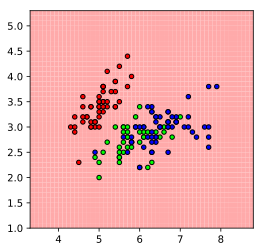

In [47]:
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
step = 0.1
xx, yy = np.meshgrid(np.arange(x_min, x_max, step),
                     np.arange(y_min, y_max, step))

ypred = []
for data in np.array([xx.ravel(), yy.ravel()]).T:
    ypred.append(KNN(K, X, y, data.reshape(1,2)))

fig, ax = plt.subplots(figsize=(4,4))

ax.pcolormesh(xx, yy, np.array(ypred).reshape(xx.shape), cmap=cmap_light)
ax.scatter(X[:,0], X[:,1], c=y, cmap=cmap_bold, edgecolor='k', s=20);